# 准备工作

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import os
import sys
# sys.path.append('/content/drive/My\ Drive/algorithms/DBScan/density')
%cd /content/drive/My\ Drive/algorithms/DBScan/density
os.listdir()


################# import libraries #####################
import time

# from point import ClusterPoint as CP
from boxgraph import BoxGraph
from box import Box

import numpy as np
from matplotlib import patches
import matplotlib.pyplot as plt
import datetime as dt
import math
from operator import itemgetter
from itertools import compress
import operator

import random

import pandas as pd
import seaborn as sns
sns.set()

/content/drive/My Drive/algorithms/DBScan/density


In [3]:
################# all the defined classes #####################
'''
    Rectangle, Point, ClusterPoint, CentroidPoint, referencePoint, 
    TimeWindow
'''

class Rectangle:
    def __init__(self, x, y, width, height, cluster_label=-1):
        '''
            x,y: the coordinate of a point, which is the middle point of a rectangle
            width, height: the width, height of the rectangle
            cluster_label: the label, default is -1, which means that it is not clustered
        '''
        self.x = x
        self.y = y
        self.width = width
        self.height = height
        self.cluster_label = cluster_label
        self.x_min = self.x - self.width/2
        self.x_max = self.x + self.width/2
        self.y_min = self.y - self.height/2
        self.y_max = self.y + self.height/2
        self.area = self.width * self.height

from enum import Enum

"""absolute tolerance value used for equality testing.
Should ideally be relative to magnitude"""
EPS = 1e-12


class Point:
    """
    Represents a point in the plane.
    Contains a dimension field and a list of coordinates for each dimension
    """
    def __init__(self, dimension, coords=None, ID=None, datetime=None,type_point=None):
        self.dimension = dimension
        if coords is None:
            self.coords = [0. for _ in range(dimension)]
        else:
            assert len(coords) == dimension
            self.coords = coords[:]
        self.ID = ID
        self.datetime = datetime
        self.type_point = type_point
        # self.label = label

    def __str__(self):
        return " ".join("{}".format(c) for c in self.coords)

    def __eq__(self, other):
        return self.sq_distance_to(other) < EPS

    def __ne__(self, other):
        return not self.__eq__(other)

    def __hash__(self):
        return hash(hash(self.coords[0]) + hash(self.coords[1])) # a bit finniky

    def sq_distance_to(self, other):
        assert self.dim_match(other)

        return sum((self.coords[i] - other.coords[i]) ** 2 for i in range(self.dimension))

    def add(self, other):
        assert self.dim_match(other)

        for i in range(self.dimension):
            self.coords[i] += other.coords[i]

    def sub(self, other):
        assert self.dim_match(other)

        for i in range(self.dimension):
            self.coords[i] -= other.coords[i]

    def mul(self, x):
        self.coords = [coord * x for coord in self.coords]
        return self

    def div(self, x):
        self.coords = [coord / x for coord in self.coords]
        return self

    def dim_match(self, other):
        return self.dimension == other.dimension

    def get(self, i):
        return self.coords[i]


class ClusterPoint(Point):
    """
    Point containing an additional clustering label and cluster function
    """

    DEFAULT_LABEL = -1

    class Func(Enum):
        NOISE = 0
        CORE = 1
        BORDER = 2

    def __init__(self, dimension, coords=None, ID=None, datetime=None, label=DEFAULT_LABEL, func=Func.NOISE, type_point=None):
        super().__init__(dimension, coords, ID, datetime, type_point)

        self.cluster_label = label
        self.func = func

    def __str__(self):
        return "{} {} {}".format(super().__str__(), self.cluster_label, self.func.name)

    def is_labeled(self):
        return self.cluster_label != self.DEFAULT_LABEL

class CentroidPoint(Point):
    """Centroid point used by k-means"""
    def __init__(self, dimension, coords=None):
        super().__init__(dimension, coords)

class referencePoint:
    def __init__(self, scrX, scrY, lat, lng):
        '''
            scrX: float, the X in the picture
            scrU: float, the Y in the picture
            lat: float, latitude
            lng: float, longitue
        '''
        self.scrX = scrX
        self.scrY = scrY
        self.lat = lat
        self.lng = lng

class TimeWindow:
    def __init__(self, w, start_time, window):
        '''
            w: int - the window size, as in minutes
            start_time: dateime - the starting time of the window
            window: dataframe
        '''
        self.window_size = w
        self.start_time = start_time
        self.window = window

        
    def sliding(self, x, df, column):
        '''
            because the window and the starting time of it are initialized
            it only needs to move on the dataframe df by x minutes
        '''
        # the window slides to right x minutes 
        # print('start time:', (self.start_time))
        # print('timedelta:', type(dt.timedelta(minutes=x)))
        new_start_time = self.start_time + dt.timedelta(minutes=x)
        # sort by datetime
        # self.window.sort(key=itemgetter(3))
        
        # delete the previous points
        # for i in range(len(self.window)):
        #     if self.window[i][3] < new_start_time:
        #         self.window.pop(i)
        self.window = self.window.drop(self.window[self.window[column] < new_start_time].index)
        
        # add new points
        end_time = self.start_time + dt.timedelta(minutes=self.window_size)
        new_end_time = new_start_time + dt.timedelta(minutes=self.window_size)
        # update new start time
        self.start_time = new_start_time

        after_end_time = df[column] >= end_time
        before_new_end_time = df[column] < new_end_time
        between_two_times = after_end_time & before_new_end_time
        filtered_times = df.loc[between_two_times]

        self.window = pd.concat([self.window, filtered_times])

        return TimeWindow(self.window_size, self.start_time, self.window)

    def sliding_with_prob(self, x, df, column, prob):
        '''
            because the window and the starting time of it are initialized
            it only needs to move on the dataframe df by x minutes
        '''
        # the window slides to right x minutes 
        new_start_time = self.start_time + dt.timedelta(minutes=x)
        # print('before delete:',len(self.window.index))
        self.window = self.window.drop(self.window[self.window[column] < new_start_time].index)
        # print('after delete:',len(self.window.index))
        
        # add new points
        end_time = self.start_time + dt.timedelta(minutes=self.window_size)
        new_end_time = new_start_time + dt.timedelta(minutes=self.window_size)
        # update new start time
        self.start_time = new_start_time

        after_end_time = df[column] >= end_time
        before_new_end_time = df[column] < new_end_time
        between_two_times = after_end_time & before_new_end_time
        filtered_times = df.loc[between_two_times]
        n_samples = len(filtered_times.index)
        index_list = []
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        # print('before:',n_samples,'after sample:',len(index_list))
        latest_window = filtered_times.iloc[np.array(index_list)]

        self.window = pd.concat([self.window, latest_window])

        return TimeWindow(self.window_size, self.start_time, self.window)

In [4]:
################# helper functions #####################
'''
    leap_year, day_of_month, select_day
'''

def leap_year(year):
    '''
        year: int
        return: boolean, if year is a leap year
    '''
    if((year%4 == 0 and year%100 != 0) or year %400 == 0):
        return True
    else:
        return False

def day_of_month(year, month):
    '''
        year: int
        month: int
        return: int, the month of year has how many day
    '''
    dic = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    if month==2 and leap_year(year):
        return 29
    else:
        return dic[month]

def select_day(start_dt, lasting_hour, df, column):
    '''
        start_dt: datetime, the starting datetime
        lasting_time: int, hours
        df: dataframe
        column: string, name of the required column
        return: dataframe, select a dataframe that is within this time
    '''
    # print(start_dt, type(start_dt))
    # print(df[column][0], type(df[column][0]) )
    after_start_date = df[column] >= start_dt
    before_end_date = df[column] < start_dt + dt.timedelta(hours=lasting_hour)
    # print(start_dt + dt.timedelta(hours=lasting_hour))
    between_two_dates = after_start_date & before_end_date
    # print(np.unique(np.array(between_two_dates)))
    filtered_dates = df.loc[between_two_dates]
    return filtered_dates

# This function converts lat and lng coordinates to GLOBAL X and Y positions
def latlngToGlobalXY(lat, lng):
    radius = 6371    #Earth Radius in KM
    # Calculate global X and Y for top-left reference point        
    p0 = referencePoint(0, 0, 40.88104503491091, -74.02323943194315)
    # Calculate global X and Y for bottom-right reference point
    p1 = referencePoint(471, 907, 40.701400864163276, -73.90045275291787) 
    # Calculates x based on cos of average of the latitudes
    x = radius*lng*math.cos((p0.lat + p1.lat)/2)
    # x = radius * lng
    # Calculates y based on latitude
    y = radius*lat
    return {'x': x, 'y': y}

# This function converts lat and lng coordinates to SCREEN X and Y positions
def latlngToScreenXY(lat, lng):
    # Calculate global X and Y for top-left reference point        
    p0 = referencePoint(0, 0, 40.88104503491091, -74.02323943194315)
    # Calculate global X and Y for bottom-right reference point
    p1 = referencePoint(471, 907, 40.701400864163276, -73.90045275291787) 
    
    p0_pos = latlngToGlobalXY(p0.lat, p0.lng)
    p1_pos = latlngToGlobalXY(p1.lat, p1.lng)

    # Calculate global X and Y for projection point
    pos = latlngToGlobalXY(lat, lng)
    # Calculate the percentage of Global X position in relation to total global width
    perX = ((pos['x']-p0_pos['x'])/(p1_pos['x'] - p0_pos['x']))
    # Calculate the percentage of Global Y position in relation to total global height
    perY = ((pos['y']-p0_pos['y'])/(p1_pos['y'] - p0_pos['y']))

    # Returns the screen position based on reference points
    return {
        'x': p0.scrX + (p1.scrX - p0.scrX)*perX,
        'y': p0.scrY + (p1.scrY - p0.scrY)*perY
    }

In [5]:
################# helper functions (for Rectangle) #####################
def n_of_points_in_rectangle(rect, points):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    xl = rect.x_min
    xr = rect.x_max
    yl = rect.y_min
    yr = rect.y_max
    for i in range(len(points)):
        x,y = points[i].coords
        # print('x:',x,'y:',y, rect.x_min, rect.x)
        if xl <= x <= xr and yl <= y <= yr:
            cnt += 1
    return cnt
    
def dense_rectangle(points, rects, k=3, min_area=10, percent=0.5):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    # c = 4 * k**2    # the function with k
    list_densities = []
    list_rect = rects.copy()

    for i in range(len(list_rect)-1,-1,-1):
        r = list_rect[i]
        if r.area > min_area:
            density_pq = n_of_points_in_rectangle(r, points) / (r.area+EPS)
            list_densities.append(density_pq)
        else:
            list_rect.pop(i)
    
    list_densities = list_densities[::-1]
    if len(list_densities)<=0:
        return [],[]

    # print('the length of it:',len(list_densities),'. They are:',list_densities)
    # print('the length of it:',len(rects),'. They are:',rects)

    from operator import itemgetter

    # zipppppppppp and sort
    sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rect),key=itemgetter(0))))
    sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]
    # average_density = sum(sorted_densities) / len(sorted_densities)
    
    disjoint_rect = [sorted_rectangles[0]]
    disjoint_densities = [sorted_densities[0]]
    cnt = 1
    for i,r in enumerate(sorted_rectangles[1:]):
        flag_disjoint = True
        for j,dr in enumerate(disjoint_rect):
            if intersect_area(r, dr) > percent*r.area or intersect_area(r, dr) > percent*dr.area:
                flag_disjoint = False
        if flag_disjoint:
            disjoint_rect.append(r)
            disjoint_densities.append(sorted_densities[i])
            cnt += 1
        if cnt>=k:
            break

    # return sorted_rectangles[:k], average_density
    return sorted_rectangles[:k], sorted_densities[:k]

def intersect_area(a, b):  # returns 0 if rectangles don't intersect
    '''
        a, b: Rectangles
    '''
    dx = min(a.x_max, b.x_max) - max(a.x_min, b.x_min)
    dy = min(a.y_max, b.y_max) - max(a.y_min, b.y_min)
    if (dx>=0) and (dy>=0):
        return dx*dy
    else: 
        return 0

def intersect_rect(a, b):  # returns 0 if rectangles don't intersect
    '''
        a, b: Rectangles
    '''
    dx = min(a.x_max, b.x_max) - max(a.x_min, b.x_min)
    dy = min(a.y_max, b.y_max) - max(a.y_min, b.y_min)
    if (dx>=0) and (dy>=0):
        bottom = max(a.y_min, b.y_min)
        top = min(a.y_max, b.y_max)
        left = max(a.x_min, b.x_min)
        right = min(a.x_max, b.x_max)
        center_x = 0.5*(left+right)
        center_y = 0.5*(top+bottom)
        return Rectangle(center_x, center_y, dx, dy)
    else: 
        return None
    
def dense_disjoint_rectangle(list_rect,percent):
    '''
        list_rect: list - Rectangle, sorted by density (descentding)
        list_dens: list - float
        percent: float - the maximum overlap percentage
    '''
    disjoint_rect = [random.choice(list_rect)]
    for r in list_rect:
        flag_disjoint = True
        for dr in disjoint_rect:
            if intersect_area(r, dr) > percent*r.area or intersect_area(r, dr) > percent*dr.area:
                flag_disjoint = False
        if flag_disjoint:
            disjoint_rect.append(r)
    return disjoint_rect

def points_in_rect(list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- list of coords that lay in the rectangle
    '''
    # points = input_obj.cluster_points
    X = np.array([np.array(points[idx].coords) for idx in range(len(points))])
    res_points = []
    for r in list_rect:
        x_l, x_r = r.x_min, r.x_max
        y_b, y_t = r.y_min, r.y_max
        points_obtained = []
        for x in X:
            if x_l <= x[0] <= x_r and y_b <= x[1] <= y_t:
                points_obtained.append(x)
        res_points.extend(points_obtained)
    res_points = np.array([np.array(x) for x in res_points])
    return res_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def f_score_points_in_rect(true_rects, predicted_rects, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # print(np.unique(label))

    flag_true_rects = [False for _ in range(len(true_rects))]
    flag_predicted_rects = [False for _ in range(len(predicted_rects))]

    true_but_not_detected = []
    false_detected = []
    intersection = []
    for i in range(len(true_rects)):
        for j in range(len(predicted_rects)):
            tr = true_rects[i]
            pr = predicted_rects[j]
            tmp = intersect_rect(tr,pr)
            if tmp:
                intersection.append(tmp)
                flag_true_rects[i] = True
                flag_predicted_rects[j] = True
                if tr.x_min <= pr.x_min:
                    left_r, right_r = tr, pr
                else: left_r, right_r = pr, tr

                if left_r.y_max >= right_r.y_max:
                    frac_1_width = left_r.width
                else: frac_1_width = right_r.width
                frac_1_height = abs(pr.y_max - tr.y_max)    #max(pr.y_max, tr.y_max) - min(pr.y_max, tr.y_max)
                if left_r.y_max >= right_r.y_max:
                    frac_1_x = left_r.x
                else: frac_1_x = right_r.x
                frac_1_y = 0.5*(tr.y_max + pr.y_max)        #0.5*(max(pr.y_max, tr.y_max) + min(pr.y_max, tr.y_max))
                frac_1 = Rectangle(frac_1_x, frac_1_y, frac_1_width, frac_1_height)
                if left_r.y_max >= right_r.y_max:
                    if left_r is tr:
                        true_but_not_detected.append(frac_1)
                    else:
                        false_detected.append(frac_1)
                else: 
                    if left_r is tr:
                        false_detected.append(frac_1)
                    else:
                        true_but_not_detected.append(frac_1)

                frac_2_width = abs(tr.x_min - pr.x_min)     #max(pr.x_min, tr.x_min) - min(pr.x_min, tr.x_min)
                frac_2_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_2_x = 0.5*(tr.x_min + pr.x_min)      #0.5*(max(pr.x_min, tr.x_min) + min(pr.x_min, tr.x_min))
                frac_2_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_2 = Rectangle(frac_2_x, frac_2_y, frac_2_width, frac_2_height)
                if left_r is tr:
                    true_but_not_detected.append(frac_2)
                else: false_detected.append(frac_2)

                if left_r.y_min >= right_r.y_min:
                    frac_3_width = right_r.width
                else: frac_3_width = left_r.width
                frac_3_height = max(pr.y_min, tr.y_min) - min(pr.y_min, tr.y_min)
                if left_r.y_min >= right_r.y_min:
                    frac_3_x = right_r.x
                else: frac_3_x = left_r.x
                frac_3_y = 0.5*(pr.y_min + tr.y_min)
                frac_3 = Rectangle(frac_3_x, frac_3_y, frac_3_width, frac_3_height)
                if left_r.y_min >= right_r.y_min:
                    if left_r is tr:
                        false_detected.append(frac_3)
                    else:
                        true_but_not_detected.append(frac_3)
                else:
                    if left_r is tr:
                         true_but_not_detected.append(frac_3)
                    else:
                        false_detected.append(frac_3)

                frac_4_width = abs(pr.x_max - tr.x_max)
                frac_4_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_4_x = 0.5*(pr.x_max + tr.x_max)        # 0.5*(max(pr.x_max, tr.x_max) + min(pr.x_max, tr.x_max))
                frac_4_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_4 = Rectangle(frac_4_x, frac_4_y, frac_4_width, frac_4_height)
                if right_r is tr:
                    if right_r.x_max > left_r.x_max:
                        true_but_not_detected.append(frac_4)
                    else:
                        false_detected.append(frac_4)
                else: 
                    if right_r.x_max > left_r.x_max:
                        false_detected.append(frac_4)
                    else:
                        true_but_not_detected.append(frac_4)
        if flag_true_rects[i] == False:
            true_but_not_detected.append(true_rects[i])
    for j in range(len(predicted_rects)):
        if not flag_predicted_rects[j]:
            false_detected.append(predicted_rects[j])

    # true positive
    true_positive_points = points_in_rect(intersection, points)
    n_tp = len(true_positive_points)

    # false negative
    false_negative_points = points_in_rect(true_but_not_detected, points)
    n_fn = len(false_negative_points)

    # all the actual positive
    actual_positive_points = points_in_rect(true_rects, points)
    n_ap = len(actual_positive_points)
    
    # false positive
    false_positive_points = points_in_rect(false_detected, points)
    n_fp = len(false_positive_points)

    predicted_points = points_in_rect(predicted_rects, points)
    n_pp = len(predicted_points)
    
    # precision = tp / (tp + fp)
    if n_pp == 0 :
        precision = 0
    else: precision = n_tp / n_pp
    # print('precision check:',precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if n_ap == 0:
        recall = 0
    else: recall = n_tp / n_ap
    # print('recall check',recall, n_tp, n_fn)

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, precision, recall
    
def f_score_points_in_rect_duplicate(true_rects, list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points    
    if len(list_rect)<=0:
        return 0,0,0
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    n_points = len(points)
    coords = np.array([np.array(points[idx].coords) for idx in range(n_points)])
    
    # the points in the predicted rectangle
    predicted_points = points_in_rect(list_rect, points)
    # set_predicted_points = set(map(tuple, predicted_points))

    # all the points that are clusterd
    set_all_points = set(map(tuple, coords))

    # all the actual positive points
    true_points = points_in_rect(true_rects, points)
    # set_true_points = set(map(tuple, true_points))

    # the points outside of the predicted rectangle
    # negative_points = set_all_points - set_true_points
    coordsv = coords.view([('', coords.dtype)] * coords.shape[1]).ravel()
    true_pointsv = true_points.view([('', true_points.dtype)] * true_points.shape[1]).ravel()
    negative_points = np.setdiff1d(coordsv, true_pointsv).view(coords.dtype).reshape(-1, coords.shape[1])
    # print('negative points:',len(negative_points),'= all points:',len(coords),'- actual positive points:',len(true_points))
    
    # true positive
    # tp_set = set_true_points & set_predicted_points
    # print('actual positive points:',len(true_points),'& predicted points:',len(predicted_points))
    predicted_pointsv = predicted_points.view([('', predicted_points.dtype)] * predicted_points.shape[1]).ravel()
    true_pointsv = true_points.view([('', true_points.dtype)] * true_points.shape[1]).ravel()
    true_positive = np.intersect1d(true_pointsv, predicted_pointsv).view(true_points.dtype).reshape(-1, true_points.shape[1])
    # tp_list = list(map(list, tp_set))
    n_tp = len(true_positive)
    # print('true positvie points:',n_tp,'= actual positive points:',len(true_points),'& predicted points:',len(predicted_points))

    # false negative
    # fn_set = set_true_points - set_predicted_points
    true_positivev = true_positive.view([('', true_positive.dtype)] * true_positive.shape[1]).ravel()
    true_pointsv = true_points.view([('', true_points.dtype)] * true_points.shape[1]).ravel()
    false_negative = np.setdiff1d(true_pointsv, true_positivev).view(true_points.dtype).reshape(-1, true_points.shape[1])
    # fn_list = list(map(list, fn_set))
    n_fn = len(false_negative)
    # print('false positvie points:',n_fn,'= all actual positive points:',len(true_points),'- true positive points:',n_tp)
    
    # false positive
    # fp_set = set_predicted_points & negative_points
    # nrows_n, ncols_n = negative_points.shape
    # dtype_n={'names':['f{}'.format(i) for i in range(ncols_n)],
    #     'formats':ncols_n * [negative_points.dtype]}
    # false_positive = np.intersect1d(negative_points.view(dtype_n), predicted_points.view(dtype_n))
    # false_positive = negative_points.view(negative_points.dtype).reshape(-1, ncols_n)
    negative_pointsv = true_positive.view([('', negative_points.dtype)] * negative_points.shape[1]).ravel()
    false_positive = np.intersect1d(negative_pointsv, predicted_pointsv).view(negative_points.dtype).reshape(-1, negative_points.shape[1])
    # fp_list = list(map(list, fp_set))
    n_fp = len(false_positive)
    # print('false positvie points:',n_fp,'= negative points:',len(negative_points),'& predicted points:',len(set_predicted_points))

    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / len(predicted_points)
    if n_tp>len(predicted_points):
        print('precision > 1!')
    # print('precision: n_tp>len(predicted_points)', n_tp, len(predicted_points), n_tp + n_fp, n_tp>len(predicted_points))
    
    # recall = tp / (tp + fn)
    if (n_tp + n_fn) == 0:
        recall = 0
    else: recall = n_tp / len(true_points)
    if n_tp > len(true_points):
        print('recall > 1!')
    # print(recall, n_tp, n_fn)

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, precision, recall


# def f_score_points_in_rect_duplicate(true_rects, list_rect, points):
#     '''
#         list_rect: list - Rectangles
#         input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

#         return -- float, accuracy
#     '''
#     # points = input_obj.cluster_points
#     label = np.array([points[idx].cluster_label for idx in range(len(points))])
#     # print(np.unique(label))
#     # label_points = []
#     # noise_points = []
#     # for idx in range(len(points)):
#     #     if points[idx].cluster_label==-1:
#     #         noise_points.append(points[idx])
#     #     else:
#     #         label_points.append(points[idx])
#     # points = [points[idx] for idx in range(len(points)) if points[idx]!=-1]
#     # cluster_coords = np.array([np.array(label_points[idx].coords) for idx in range(len(label_points))])
#     # noise_coords = np.array([np.array(noise_points[idx].coords) for idx in range(len(noise_points))])
#     n_points = len(points)
#     coords = np.array([np.array(points[idx].coords) for idx in range(n_points)])
    
#     # the points in the predicted rectangle
#     predicted_points = points_in_rect(list_rect, points)
#     set_predicted_points = set(map(tuple, predicted_points))

#     # all the points that are clusterd
#     set_all_points = set(map(tuple, coords))

#     # all the actual positive points
#     true_points = points_in_rect(true_rects, points)
#     set_true_points = set(map(tuple, true_points))

#     # the points outside of the predicted rectangle
#     negative_points = set_all_points - set_true_points
#     # print('negative points:',len(negative_points),'= all points:',len(set_all_points),'- actual positive points:',len(set_true_points))
    
#     # true positive
#     tp_set = set_true_points & set_predicted_points
#     # tp_list = list(map(list, tp_set))
#     n_tp = len(tp_set)
#     # print('true positvie points:',n_tp,'= actual positive points:',len(set_true_points),'& predicted points:',len(set_predicted_points))

#     # false negative
#     fn_set = set_true_points - set_predicted_points
#     # fn_list = list(map(list, fn_set))
#     n_fn = len(fn_set)
#     # print('false positvie points:',n_fn,'= all actual positive points:',len(set_true_points),'- true positive points:',n_tp)
    
#     # false positive
#     fp_set = set_predicted_points & negative_points
#     # fp_list = list(map(list, fp_set))
#     n_fp = len(fp_set)
#     # print('false positvie points:',n_fp,'= negative points:',len(negative_points),'& predicted points:',len(set_predicted_points))

#     # precision = tp / (tp + fp)
#     if n_tp + n_fp == 0 :
#         precision = 0
#     else: precision = n_tp / len(predicted_points)
#     # print(precision, n_tp, n_fp)
    
#     # recall = tp / (tp + fn)
#     if (n_tp + n_fn) == 0:
#         recall = 0
#     else: recall = n_tp / len(true_points)
#     # print(recall, n_tp, n_fn)

#     # f_score = 2 * (p*r)/(p+r)
#     if precision + recall == 0:
#         f_score = 0
#     else: f_score = 2 * ((precision*recall) / (precision+recall))

#     return f_score, precision, recall

def roc_auc_fscore(true_rects, predicted_rects, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # print(np.unique(label))

    flag_true_rects = [False for _ in range(len(true_rects))]
    flag_predicted_rects = [False for _ in range(len(predicted_rects))]

    true_but_not_detected = []
    false_detected = []
    intersection = []
    for i in range(len(true_rects)):
        for j in range(len(predicted_rects)):
            tr = true_rects[i]
            pr = predicted_rects[j]
            tmp = intersect_rect(tr,pr)
            if tmp:
                intersection.append(tmp)
                flag_true_rects[i] = True
                flag_predicted_rects[j] = True
                if tr.x_min <= pr.x_min:
                    left_r, right_r = tr, pr
                else: left_r, right_r = pr, tr

                if left_r.y_max >= right_r.y_max:
                    frac_1_width = left_r.width
                else: frac_1_width = right_r.width
                frac_1_height = abs(pr.y_max - tr.y_max)    #max(pr.y_max, tr.y_max) - min(pr.y_max, tr.y_max)
                if left_r.y_max >= right_r.y_max:
                    frac_1_x = left_r.x
                else: frac_1_x = right_r.x
                frac_1_y = 0.5*(tr.y_max + pr.y_max)        #0.5*(max(pr.y_max, tr.y_max) + min(pr.y_max, tr.y_max))
                frac_1 = Rectangle(frac_1_x, frac_1_y, frac_1_width, frac_1_height)
                if left_r.y_max >= right_r.y_max:
                    if left_r is tr:
                        true_but_not_detected.append(frac_1)
                    else:
                        false_detected.append(frac_1)
                else: 
                    if left_r is tr:
                        false_detected.append(frac_1)
                    else:
                        true_but_not_detected.append(frac_1)

                frac_2_width = abs(tr.x_min - pr.x_min)     #max(pr.x_min, tr.x_min) - min(pr.x_min, tr.x_min)
                frac_2_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_2_x = 0.5*(tr.x_min + pr.x_min)      #0.5*(max(pr.x_min, tr.x_min) + min(pr.x_min, tr.x_min))
                frac_2_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_2 = Rectangle(frac_2_x, frac_2_y, frac_2_width, frac_2_height)
                if left_r is tr:
                    true_but_not_detected.append(frac_2)
                else: false_detected.append(frac_2)

                if left_r.y_min >= right_r.y_min:
                    frac_3_width = right_r.width
                else: frac_3_width = left_r.width
                frac_3_height = max(pr.y_min, tr.y_min) - min(pr.y_min, tr.y_min)
                if left_r.y_min >= right_r.y_min:
                    frac_3_x = right_r.x
                else: frac_3_x = left_r.x
                frac_3_y = 0.5*(pr.y_min + tr.y_min)
                frac_3 = Rectangle(frac_3_x, frac_3_y, frac_3_width, frac_3_height)
                if left_r.y_min >= right_r.y_min:
                    if left_r is tr:
                        false_detected.append(frac_3)
                    else:
                        true_but_not_detected.append(frac_3)
                else:
                    if left_r is tr:
                         true_but_not_detected.append(frac_3)
                    else:
                        false_detected.append(frac_3)

                frac_4_width = abs(pr.x_max - tr.x_max)
                frac_4_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_4_x = 0.5*(pr.x_max + tr.x_max)        # 0.5*(max(pr.x_max, tr.x_max) + min(pr.x_max, tr.x_max))
                frac_4_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_4 = Rectangle(frac_4_x, frac_4_y, frac_4_width, frac_4_height)
                if right_r is tr:
                    if right_r.x_max > left_r.x_max:
                        true_but_not_detected.append(frac_4)
                    else:
                        false_detected.append(frac_4)
                else: 
                    if right_r.x_max > left_r.x_max:
                        false_detected.append(frac_4)
                    else:
                        true_but_not_detected.append(frac_4)
        if flag_true_rects[i] == False:
            true_but_not_detected.append(true_rects[i])
    for j in range(len(predicted_rects)):
        if not flag_predicted_rects[j]:
            false_detected.append(predicted_rects[j])

    # true positive
    true_positive_points = points_in_rect(intersection, points)
    n_tp = len(true_positive_points)

    # false negative
    false_negative_points = points_in_rect(true_but_not_detected, points)
    n_fn = len(false_negative_points)

    # all the actual positive
    actual_positive_points = points_in_rect(true_rects, points)
    n_ap = len(actual_positive_points)

    # all the actual negative
    n_an = len(points) - n_ap
    
    # false positive
    false_positive_points = points_in_rect(false_detected, points)
    n_fp = len(false_positive_points)
    
    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / (n_tp + n_fp)
    # print('precision check:',precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if n_ap == 0:
        recall = 0
    else: recall = n_tp / n_ap
    # print('recall check',recall, n_tp, n_fn)

    # FPR = FP / (FP + TN)
    if n_an == 0:
        fpr = 0
    else: fpr = n_fp / n_an

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, recall, fpr

In [6]:
################# helper functions (as in points) #####################

def n_of_points_in_rectangle_pq(p, q, points):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    xp, yp = p.coords
    xq, yq = q.coords
    xl, xr = min(xp, xq), max(xp, xq)
    yl, yr = min(yp, yq), max(yp, yq)
    for i in range(len(points)):
        x,y = points[i].coords
        if xl <= x <= xr and yl <= y <= yr:
            cnt += 1
    return cnt

# 数据集

In [ ]:
################# generate rectangle set #####################
'''
    rectangle_set, rectangle_set_gaussian, 
'''

def rectangle_set(n_samples, a, rctgs, datetime, interval, epsilon=5, min_pts=4, type_point='Rect'):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a + [1]
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point=type_point))
                break
    return BoxGraph(n_samples, d, epsilon, min_pts, list_points)

def rectangle_set_gaussian(n_samples, a, rctgs, datetime, interval, epsilon=5, min_pts=4, type_point='Rect'):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a + [1]
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.normal(tmp_rctg.x_min+0.5*(tmp_rctg.width), tmp_rctg.width*0.3)
                y = np.random.normal(tmp_rctg.y_min+0.5*(tmp_rctg.height), tmp_rctg.height*0.3)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point=type_point))
                break
    return BoxGraph(n_samples, d, epsilon, min_pts, list_points)

def rectangle_set_list(n_samples, a, rctgs, datetime, interval, type_point='Rect'):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a + [1]
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point=type_point))
                break
    return list_points

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

In [ ]:
################# generate taxi set #####################
def taxi_set(epsilon, min_pts):
    data=pd.read_csv("yellow_tripdata_2015-01.csv")
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    
    del data['store_and_fwd_flag']
    del data['RateCodeID']
    del data['payment_type']
    del data['fare_amount']
    del data['extra']
    del data['mta_tax']
    del data['tip_amount']
    del data['tolls_amount']
    del data['improvement_surcharge']
    del data['total_amount']
    
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    data_oneday = select_day(s_datetime, 0.25, data, 'tpep_pickup_datetime')

    data_oneday['pickup_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    data_oneday['dropoff_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    data_oneday['pickup_x'] = data_oneday['pickup_coords'].apply(lambda x: x['x'])
    data_oneday['pickup_y'] = data_oneday['pickup_coords'].apply(lambda x: x['y'])
    data_oneday['dropoff_x'] = data_oneday['dropoff_coords'].apply(lambda x: x['x'])
    data_oneday['dropoff_y'] = data_oneday['dropoff_coords'].apply(lambda x: x['y'])

    # data that fit in the image
    data_oneday = data_oneday[(data_oneday['pickup_x'] >= 0) & (data_oneday['pickup_x'] <= 471) & (data_oneday['pickup_y'] <= 907) & (data_oneday['pickup_y'] >= 0)]

    n, d = len(data_oneday), 2
    list_points = []
    for j in range(n):
        x, y = data_oneday.iloc[j,-4], data_oneday.iloc[j,-3]
        datetime_generated = data_oneday.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated))
    return BoxGraph(n, d, epsilon, min_pts, list_points)

In [ ]:
data=pd.read_csv("yellow_tripdata_2015-01.csv")
data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

del data['store_and_fwd_flag']
del data['RateCodeID']
del data['payment_type']
del data['fare_amount'] 
del data['extra']
del data['mta_tax']
del data['tip_amount']
del data['tolls_amount']
del data['improvement_surcharge']
del data['total_amount']

s_date = dt.date(2015,1,10)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_onehour = select_day(s_datetime, 1, data, 'tpep_pickup_datetime')

data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

# data that fit in the image
data_onehour = data_onehour[(data_onehour['pickup_x'] >= 0)&(data_onehour['pickup_x'] <= 471)&(data_onehour['pickup_y'] <= 907)&(data_onehour['pickup_y'] >= 0)]


# data_oneday = select_day(s_datetime, 12, data, 'tpep_pickup_datetime')

# data_oneday['pickup_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
# data_oneday['dropoff_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

# data_oneday['pickup_x'] = data_oneday['pickup_coords'].apply(lambda x: x['x'])
# data_oneday['pickup_y'] = data_oneday['pickup_coords'].apply(lambda x: x['y'])
# data_oneday['dropoff_x'] = data_oneday['dropoff_coords'].apply(lambda x: x['x'])
# data_oneday['dropoff_y'] = data_oneday['dropoff_coords'].apply(lambda x: x['y'])

# # data that fit in the image
# data_oneday = data_oneday[(data_oneday['pickup_x'] >= 0) & (data_oneday['pickup_x'] <= 471) & (data_oneday['pickup_y'] <= 907) & (data_oneday['pickup_y'] >= 0)]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

In [ ]:
s_date = dt.date(2015,1,10)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_sat = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,9)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_fri = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,11)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_sun = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,12)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_mon = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,1)
s_time = dt.time(0,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_newyear = select_day(s_datetime, 24, data, 'tpep_pickup_datetime')

data_newyear['pickup_coords']=data_newyear.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_newyear['dropoff_coords']=data_newyear.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_newyear['pickup_x'] = data_newyear['pickup_coords'].apply(lambda x: x['x'])
data_newyear['pickup_y'] = data_newyear['pickup_coords'].apply(lambda x: x['y'])
data_newyear['dropoff_x'] = data_newyear['dropoff_coords'].apply(lambda x: x['x'])
data_newyear['dropoff_y'] = data_newyear['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_newyear = data_newyear[(data_newyear['pickup_x'] >= 0) & (data_newyear['pickup_x'] <= 471) & (data_newyear['pickup_y'] <= 907) & (data_newyear['pickup_y'] >= 0)]

data_fri['pickup_coords']=data_fri.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_fri['dropoff_coords']=data_fri.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_fri['pickup_x'] = data_fri['pickup_coords'].apply(lambda x: x['x'])
data_fri['pickup_y'] = data_fri['pickup_coords'].apply(lambda x: x['y'])
data_fri['dropoff_x'] = data_fri['dropoff_coords'].apply(lambda x: x['x'])
data_fri['dropoff_y'] = data_fri['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_fri = data_fri[(data_fri['pickup_x'] >= 0) & (data_fri['pickup_x'] <= 471) & (data_fri['pickup_y'] <= 907) & (data_fri['pickup_y'] >= 0)]

data_sat['pickup_coords']=data_sat.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_sat['dropoff_coords']=data_sat.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_sat['pickup_x'] = data_sat['pickup_coords'].apply(lambda x: x['x'])
data_sat['pickup_y'] = data_sat['pickup_coords'].apply(lambda x: x['y'])
data_sat['dropoff_x'] = data_sat['dropoff_coords'].apply(lambda x: x['x'])
data_sat['dropoff_y'] = data_sat['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_sat = data_sat[(data_sat['pickup_x'] >= 0) & (data_sat['pickup_x'] <= 471) & (data_sat['pickup_y'] <= 907) & (data_sat['pickup_y'] >= 0)]

data_sun['pickup_coords']=data_sun.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_sun['dropoff_coords']=data_sun.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_sun['pickup_x'] = data_sun['pickup_coords'].apply(lambda x: x['x'])
data_sun['pickup_y'] = data_sun['pickup_coords'].apply(lambda x: x['y'])
data_sun['dropoff_x'] = data_sun['dropoff_coords'].apply(lambda x: x['x'])
data_sun['dropoff_y'] = data_sun['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_sun = data_sun[(data_sun['pickup_x'] >= 0) & (data_sun['pickup_x'] <= 471) & (data_sun['pickup_y'] <= 907) & (data_sun['pickup_y'] >= 0)]

data_mon['pickup_coords']=data_mon.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_mon['dropoff_coords']=data_mon.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_mon['pickup_x'] = data_mon['pickup_coords'].apply(lambda x: x['x'])
data_mon['pickup_y'] = data_mon['pickup_coords'].apply(lambda x: x['y'])
data_mon['dropoff_x'] = data_mon['dropoff_coords'].apply(lambda x: x['x'])
data_mon['dropoff_y'] = data_mon['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_mon = data_mon[(data_mon['pickup_x'] >= 0) & (data_mon['pickup_x'] <= 471) & (data_mon['pickup_y'] <= 907) & (data_mon['pickup_y'] >= 0)]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

In [ ]:
data_dec=pd.read_csv("yellow_tripdata_2015-12.csv")
data_dec['tpep_pickup_datetime']=pd.to_datetime(data_dec['tpep_pickup_datetime'])
data_dec['tpep_dropoff_datetime']=pd.to_datetime(data_dec['tpep_dropoff_datetime'])

# del data_dec['store_and_fwd_flag']
# del data_dec['RateCodeID']
# del data_dec['payment_type']
# del data_dec['fare_amount'] 
# del data_dec['extra']
# del data_dec['mta_tax']
# del data_dec['tip_amount']
# del data_dec['tolls_amount']
# del data_dec['improvement_surcharge']
# del data_dec['total_amount']

s_date = dt.date(2015,12,25)
s_time = dt.time(0,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)

data_christmas = select_day(s_datetime, 24, data_dec, 'tpep_pickup_datetime')

data_christmas['pickup_coords']=data_christmas.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_christmas['dropoff_coords']=data_christmas.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

data_christmas['pickup_x'] = data_christmas['pickup_coords'].apply(lambda x: x['x'])
data_christmas['pickup_y'] = data_christmas['pickup_coords'].apply(lambda x: x['y'])
data_christmas['dropoff_x'] = data_christmas['dropoff_coords'].apply(lambda x: x['x'])
data_christmas['dropoff_y'] = data_christmas['dropoff_coords'].apply(lambda x: x['y'])

# data that fit in the image
data_christmas = data_christmas[(data_christmas['pickup_x'] >= 0) & (data_christmas['pickup_x'] <= 471) & (data_christmas['pickup_y'] <= 907) & (data_christmas['pickup_y'] >= 0)]

# s_date = dt.date(2015,12,25)
# s_time = dt.time(17,0,0)
# start_time = dt.datetime.combine(s_date,s_time)
# column = 'tpep_pickup_datetime'

# after_start_date_tmp = data_dec[column] >= start_time
# before_end_date_tmp = data_dec[column] < start_time + dt.timedelta(minutes=60)
# between_two_dates_tmp = after_start_date_tmp & before_end_date_tmp
# origin_filtered_df_tmp = data_dec.loc[between_two_dates_tmp]
    
# origin_filtered_df_tmp.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

# 数据集展示

1500


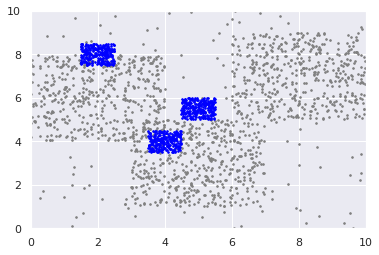

Time taken:      0.346s


In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, interval):
    plt.figure(1)
    import time as tm
    start = tm.time()
    bg_origin = rectangle_set(list_n[0], a[0], rctgs_origin, datetime, interval, 1, 1)
    bg_extra = rectangle_set(list_n[1], a[1], rctgs_extra, datetime, interval, 1, 1, type_point='extra')
    points = []
    points.extend(bg_origin.points)
    points.extend(bg_extra.points)
    # bg = BoxGraph(sum(list_n), 2, eps, mpt, points)
    # find_core_points(bg)
    # nr_clusters = compute_cluster_cores(bg)
    # assign_border_points(bg)
    # end = tm.time()
    # cost_time = end - start
    # points = bg.points

    # label = [points[i].cluster_label for i in range(len(points))]
    # label = np.array(label)

    # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    types = [np.array(points[i].type_point) for i in range(len(points))]
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    # ax = fig.add_subplot(row, column, order+cnt)
    # cnt += 1
    # ax = fig.add_axes([0, 0, 1, 1])
    # Hide spines, ticks, etc.

    # for idx, col in enumerate(colors,1):
    #     # print(idx, col)
    rect_data = []
    cnt = 0
    for p in points:
        if p.type_point=='Rect':
            rect_data.append(True)
            cnt += 1
        else:
            rect_data.append(False)
    print(cnt)
    plt.scatter(X[rect_data, 0], X[rect_data, 1],
                c='grey', marker='.', s=10)
    extra_data = [not x for x in rect_data]
    plt.scatter(X[extra_data, 0], X[extra_data, 1],
                c='blue', marker='.', s=10)
    
    # currentAxis = plt.gca()
    big_rect = rctgs_origin[-1]
    # cluster_rect = []
    # unique_label = np.unique(label)
    # # unique_label = unique_label[unique_label != -1]
    # # for idx, lbl in enumerate(np.unique(label),1):
    # for idx in range(1,len(unique_label)+1):
    #     cluster_data = label == idx
    #     if np.any(cluster_data):
    #         left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
    #         bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
    #         width, height = abs(right-left), abs(top-bottom)
    #         # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
    #         temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
    #         # print(left, right, top,bottom)
    #         # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
    #         cluster_rect.append(temp_rect)
    
    # # print('number of clusters:', len(cluster_rect))
    # max_avg_dens = 0
    # if len(cluster_rect)>0:
    #     # print(len(cluster_rect))
    #     k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
    #     n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
    #     n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
    #     f_score, precision, recall = f_score_points_in_rect(rctgs_extra, k_rects, points)
    #     f_socre, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
    #     if len(k_density)>0: average_density = np.mean(k_density)
    #     else: average_density = 0
    #     if average_density > max_avg_dens: 
    #         max_avg_dens = average_density
    #         eps_max_dens, mpt_max_dens = eps, mpt
    #     if f_score > max_fscore: 
    #         max_fscore = f_score
    #         eps_max_fscore, mpt_max_fscore = eps, mpt
    #     for r in k_rects:
    #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    # for r in rctgs_extra:
    #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # # print(max_avg_dens)
    # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
    # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
    # # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
    # title_3_2 = 'precision: ' + str(precision) + '\n'
    # title_3_3 = 'recall: ' + str(recall) + '\n'
    # title_3 = 'f_score: ' + str(f_score) + '\n'
    # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    # title_5 = 'original points: ' + str(n_rect_points) + '\n'
    # title_6 = 'generated rect points: ' + str(n_extra_points)
    # title = title_1 + title_2 + title_3_2 + title_3_3 + title_3 + title_4 + title_5 + title_6
    # ax.set_title(title)           
    # ax.set_xlabel(xlabel)
    min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
    min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
    plt.xlim([min_x, max_x])
    plt.ylim([min_y, max_y])

    plt.show()    
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    # print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)


if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    k = 3
    a = [[0.3, 0.3,0.3],[1/3,1/3,1/3]]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    # min_area = 1
    # lambda_eps, gamma_mpt = 0.1, 0.2
    # min_area_r = math.sqrt(min_area/math.pi) 
    # min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    # w_image, h_image = 10, 10
    # z = max(w_image, h_image)
    # max_pow_eps = math.log(z, 1+lambda_eps)
    # pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    # epsilon_list = (1+lambda_eps)**pow_eps

    # print('number of epsilon:', len(epsilon_list))

    import time 
    start = time.time()
    plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

6929


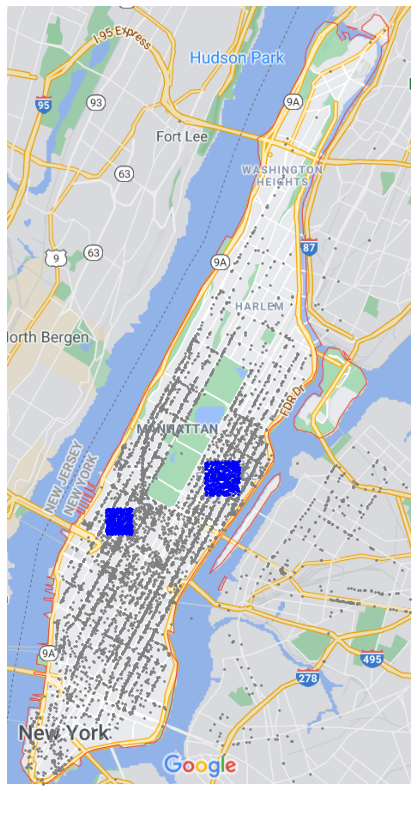

Time taken:      1.468s


In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points

def plot_clusters_two_rect_many(list_n, a, data_onehour, rctgs_extra, datetime, interval):
    
    import time as tm
    start = tm.time()
    taxis = generate_taxi(data_onehour)
    bg_extra = rectangle_set(list_n[0], a, rctgs_extra, datetime, interval, 1, 1, type_point='extra')
    points = []
    points.extend(taxis)
    points.extend(bg_extra.points)
    # bg = BoxGraph(sum(list_n), 2, eps, mpt, points)
    # find_core_points(bg)
    # nr_clusters = compute_cluster_cores(bg)
    # assign_border_points(bg)
    # end = tm.time()
    # cost_time = end - start
    # points = bg.points

    # label = [points[i].cluster_label for i in range(len(points))]
    # label = np.array(label)

    # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    types = [np.array(points[i].type_point) for i in range(len(points))]
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    # ax = fig.add_subplot(row, column, order+cnt)
    # cnt += 1
    # ax = fig.add_axes([0, 0, 1, 1])
    # Hide spines, ticks, etc.

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(im, cmap='gray')
    implot = plt.imshow(im)

    # for idx, col in enumerate(colors,1):
    #     # print(idx, col)
    taxi_data = []
    cnt = 0
    for p in points:
        if p.type_point=='taxi':
            taxi_data.append(True)
            cnt += 1
        else:
            taxi_data.append(False)
    print(cnt)
    ax.scatter(X[taxi_data, 0], X[taxi_data, 1],
                c='grey', marker='.', s=10)
    extra_data = [not x for x in taxi_data]
    ax.scatter(X[extra_data, 0], X[extra_data, 1],
                c='blue', marker='.', s=10)
    
    # currentAxis = plt.gca()
    # big_rect = rctgs_origin[-1]
    # cluster_rect = []
    # unique_label = np.unique(label)
    # # unique_label = unique_label[unique_label != -1]
    # # for idx, lbl in enumerate(np.unique(label),1):
    # for idx in range(1,len(unique_label)+1):
    #     cluster_data = label == idx
    #     if np.any(cluster_data):
    #         left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
    #         bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
    #         width, height = abs(right-left), abs(top-bottom)
    #         # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
    #         temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
    #         # print(left, right, top,bottom)
    #         # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
    #         cluster_rect.append(temp_rect)
    
    # # print('number of clusters:', len(cluster_rect))
    # max_avg_dens = 0
    # if len(cluster_rect)>0:
    #     # print(len(cluster_rect))
    #     k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
    #     n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
    #     n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
    #     f_score, precision, recall = f_score_points_in_rect(rctgs_extra, k_rects, points)
    #     f_socre, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
    #     if len(k_density)>0: average_density = np.mean(k_density)
    #     else: average_density = 0
    #     if average_density > max_avg_dens: 
    #         max_avg_dens = average_density
    #         eps_max_dens, mpt_max_dens = eps, mpt
    #     if f_score > max_fscore: 
    #         max_fscore = f_score
    #         eps_max_fscore, mpt_max_fscore = eps, mpt
    #     for r in k_rects:
    #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    # for r in rctgs_extra:
    #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # # print(max_avg_dens)
    # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
    # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
    # # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
    # title_3_2 = 'precision: ' + str(precision) + '\n'
    # title_3_3 = 'recall: ' + str(recall) + '\n'
    # title_3 = 'f_score: ' + str(f_score) + '\n'
    # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    # title_5 = 'original points: ' + str(n_rect_points) + '\n'
    # title_6 = 'generated rect points: ' + str(n_extra_points)
    # title = title_1 + title_2 + title_3_2 + title_3_3 + title_3 + title_4 + title_5 + title_6
    # ax.set_title(title)           
    # ax.set_xlabel(xlabel)
    # min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
    # min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
    # ax.set_xlim([])
    # ax.set_ylim([])

    plt.show()    
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    # print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)


if __name__ == "__main__":

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    k = 3
    a = [0.5,0.5]

    list_n = [1000]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    # min_area = 1
    # lambda_eps, gamma_mpt = 0.1, 0.2
    # min_area_r = math.sqrt(min_area/math.pi) 
    # min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    # w_image, h_image = 10, 10
    # z = max(w_image, h_image)
    # max_pow_eps = math.log(z, 1+lambda_eps)
    # pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    # epsilon_list = (1+lambda_eps)**pow_eps

    # print('number of epsilon:', len(epsilon_list))

    import time 
    start = time.time()
    plot_clusters_two_rect_many(list_n, a, data_onehour, rctgs, datetime, lasting_hours)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

# DBScan funstions

In [ ]:
################# DBScan functions #####################
'''
    find_core_points, compute_cluster_cores, assign_border_points
'''
def find_core_points(bg):
    """
    Step 2: find the core points
    """

    for box in bg.boxes:
        if len(box.points) >= bg.min_pts:
            # print('len(box.points) >= bg.min_pts:',len(box.points), bg.min_pts)
            box.func = Box.Func.CORE
            for point in box.points:
                point.func = ClusterPoint.Func.CORE
            
        else:
            for point in box.points:
                count = len(box.points)
                
                for neighbour in box.neighbours:
                    for nb_point in neighbour.points:
                        if nb_point.sq_distance_to(point) <= bg.eps_sqr:
                            count += 1
                            
                if count >= bg.min_pts:
                    # print('less than bg.min_pts:',len(box.points), bg.min_pts, 'the count is:', count)
                    box.func = Box.Func.CORE
                    point.func = ClusterPoint.Func.CORE
                    neighbour.func = Box.Func.PARTIAL                   

def compute_cluster_cores(bg):
    """
    Step 3: compute the cluster cores    
    """
    nr_clusters = -1

    label = 0
    for box in bg.boxes:
        # if (box.label == -1)  and (box.func is not Box.Func.NONE):
        if (box.label == -1)  and (box.func == Box.Func.CORE):
            label += 1
            box.label = label
            front = [box]
            
            while len(front) > 0:
                current_box = front.pop(0)
                
                for point in current_box.points:
                    if point.func == ClusterPoint.Func.CORE:
                        point.cluster_label = label
                        
                for neighbour in current_box.neighbours:
                    if neighbour.label == -1 and neighbour.func is not Box.Func.NONE:
                        if current_box.is_core_neighbour(neighbour, bg.eps):
                            neighbour.label = label
                            front.append(neighbour)
                            
    nr_clusters = label
    
    return nr_clusters

def assign_border_points(bg):
    """
    Step 4: assign border points to clusters
    """

    for box in bg.boxes:
        for point in box.points:
            if point.cluster_label == -1:
                nearest = None
                distance = 10**99
                
                for other_point in box.points:
                    if other_point.sq_distance_to(point) <= distance and other_point.cluster_label != -1:
                        nearest = other_point
                        distance = other_point.sq_distance_to(point)
                    
                for neighbour in box.neighbours:
                    for other_point in neighbour.points:
                        if other_point.sq_distance_to(point) <= distance and other_point.cluster_label != -1:
                            nearest = other_point
                            distance = other_point.sq_distance_to(point)
                            
                if distance <= bg.eps_sqr:
                    point.cluster_label = nearest.cluster_label
                    point.func = ClusterPoint.Func.BORDER

# DBScan experiments

**Rectangle set:**
different epsilons and min_pts

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt):

    fig = plt.figure(figsize=(30,85))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=2.5)
    fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list)  # number of rows
    column = 9  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    n_samples = 500

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    max_avg_dens = max_fscore = 0
    eps_max_dens = mpt_max_dens = 0
    eps_max_fscore = mpt_max_fscore = 0

    for eps in epsilon_list:
        number_of_points = sum(list_n)
        max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        print('for epsilon', eps, ', the number of min_pts is', len(min_pts_list))
        for mpt in min_pts_list:
            import time as tm
            start = tm.time()
            bg_origin = rectangle_set(list_n[0], a[0], rctgs_origin, datetime, interval, eps, mpt)
            bg_extra = rectangle_set(list_n[1], a[1], rctgs_extra, datetime, interval, eps, mpt, type_point='extra')
            points = []
            points.extend(bg_origin.points)
            points.extend(bg_extra.points)
            bg = BoxGraph(sum(list_n), 2, eps, mpt, points)
            find_core_points(bg)
            nr_clusters = compute_cluster_cores(bg)
            assign_border_points(bg)
            end = tm.time()
            cost_time = end - start
            points = bg.points

            label = [points[i].cluster_label for i in range(len(points))]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print('labels:', np.unique(label))
            # print('the first 5 labels:', label[:5])
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax = fig.add_subplot(row, column, order+cnt)
            cnt += 1
            # ax = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=2)
            
            currentAxis = plt.gca()
            big_rect = rctgs_origin[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            max_avg_dens = 0
            if len(cluster_rect)>0:
                # print(len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
                f_score, pcs, rcl = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
                f_socre, pcs, rcl = round(f_score, 4), round(pcs,4), round(rcl,4)
                # print('f_socre, precision, recall:', f_socre, pcs, rcl)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            for r in rctgs_extra:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print(max_avg_dens)
            title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3_2 = 'precision: ' + str(pcs) + '\n'
            title_3_3 = 'recall: ' + str(rcl) + '\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'original points: ' + str(n_rect_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_extra_points)
            title = title_1 + title_2 + title_3_2 + title_3_3 + title_3 + title_4 + title_5 + title_6
            ax.set_title(title)           
            # ax.set_xlabel(xlabel)
            min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
            min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
            ax.set_xlim([min_x, max_x])
            ax.set_ylim([min_y, max_y])

    plt.show()    
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)


if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    k = 3
    a = [[0.3,0.3,0.3], [1/3,1/3,1/3]]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    print('number of epsilon:', len(epsilon_list))

    import time 
    start = time.time()
    plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def rectangle_set_list(n_samples, a, rctgs, datetime, interval, type_point='Rect'):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a + [1]
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point=type_point))
                break
    return list_points

def plot_clusters_two_rect_many_k(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k):

    epsilon_list_np = np.array(epsilon_list)
    less_than_2 = epsilon_list_np[epsilon_list_np<2]
    less_than_2_n = len(less_than_2) * len(list_k[0])
    less_than_4 = epsilon_list_np[(epsilon_list_np>=2) & (epsilon_list_np<4)]
    less_than_4_n = len(less_than_4) * len(list_k[1])
    less_than_6 = epsilon_list_np[(epsilon_list_np>=4) & (epsilon_list_np<6)]
    less_than_6_n = len(less_than_6) * len(list_k[2])
    more_than_6 = epsilon_list_np[epsilon_list_np>=6]
    more_than_6_n = len(more_than_6) * len(list_k[3])

    # print('number of epsilon < 2:', less_than_2_n // 8)
    # print('number of epsilon < 4:', less_than_4_n // 4)
    # print('number of epsilon < 6:', less_than_6_n // 2)
    # print('number of epsilon >= 6:', more_than_6_n // 3)

    #  plot Numerical Data
    row = less_than_2_n + less_than_4_n + less_than_6_n + more_than_6_n  # number of rows
    columns = 9  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    
    max_avg_dens = max_fscore = 0
    eps_max_dens = mpt_max_dens = 0
    eps_max_fscore = mpt_max_fscore = 0
    grid_fpr = [[[]for _ in range(9)]for _ in range(len(epsilon_list))]
    number_of_points = sum(list_n)
    max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
    min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
    min_pts_list = (1+gamma_mpt)**min_pts_pow_list
    # print('min_pts_list:', min_pts_list)

    list_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    list_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = []
    points.extend(list_origin)
    points.extend(list_extra)

    fig = plt.figure(figsize=(35,700))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=2.5)
    fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    for i,eps in enumerate(epsilon_list):
        # print('for epsilon', bg.eps, ', the number of min_pts is', len(min_pts_list))
        if eps<2 : ks = list_k[0]
        if 2<=eps<4 : ks = list_k[1]
        if 4<=eps<6 : ks = list_k[2]
        if eps>6 : ks = list_k[3]
        k_max_fscore = fscore_each_k = mpt_max_k_fscore = 0
        for k in ks:
            for j,mpt in enumerate(min_pts_list):
                # print(eps, k, mpt)
                ax = fig.add_subplot(row, columns, order+cnt)
                cnt += 1
                import time as tm
                start = tm.time()
                bg = BoxGraph(number_of_points, 2, eps, mpt, points)
                find_core_points(bg)
                nr_clusters = compute_cluster_cores(bg)
                assign_border_points(bg)
                points = bg.points

                label = [points[i].cluster_label for i in range(len(points))]
                label = np.array(label)

                colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
                
                X = [np.array(points[i].coords) for i in range(len(points))]
                X = np.array(X)

                for idx, color in enumerate(colors):
                    # print(idx, col)
                    cluster_data = label == idx
                    ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                                c=color, marker='.', s=2)
                
                currentAxis = plt.gca()
                big_rect = rctgs_origin[-1]
                cluster_rect = []
                unique_label = np.unique(label)
                for idx in range(1,len(unique_label)+1):
                    cluster_data = label == idx
                    if np.any(cluster_data):
                        left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                        bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                        width, height = abs(right-left), abs(top-bottom)
                        temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                        cluster_rect.append(temp_rect)
                
                if len(cluster_rect)>0:
                    # print(len(cluster_rect))
                    k_rects, k_density = dense_rectangle(points, cluster_rect, k, 1)
                else:
                    k_rects, k_density = [], []
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
                # print('check points:', len(k_rects), len(points))
                f_score, pcs, rcl = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
                f_score, pcs, rcl = round(f_score, 4), round(pcs,4), round(rcl,4)
                grid_fpr[i][j].append(np.array([f_score, pcs, rcl]))
                # print('f_score, pcs, rcl:',f_score, pcs, rcl)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens= eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
                if f_score > fscore_each_k:
                    fscore_each_k = f_score
                    k_max_fscore = k
                    mpt_max_k_fscore = mpt

                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
                for r in rctgs_extra:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

                # print(max_avg_dens)
                end = tm.time()
                cost_time = end - start
                title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
                title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
                # title_3 = 'average density: ' + str(round(average_density, 4))+'\n'
                title_3_1 = 'precision: ' + str(pcs) + '\n'
                title_3_2 = 'recall: ' + str(rcl) + '\n'
                title_3 = 'f_score: ' + str(f_score) + '\n'
                title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
                title_5 = 'original points: ' + str(n_rect_points) + '\n'
                title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
                title_7 = 'requested k: ' + str(k)
                title = title_1 + title_2 + title_3_1 + title_3_2 + title_3 + title_4 + title_5 + title_6 + title_7
                ax.set_title(title)           
                # ax.set_xlabel(xlabel)
                min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
                min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
                ax.set_xlim([min_x, max_x])
                ax.set_ylim([min_y, max_y])
        print('for epsilon:', eps, 'the best k is', k_max_fscore, 'min_pts is',mpt_max_k_fscore, ', with fscore', fscore_each_k)
    
    plt.show()
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore, ', k:', k_max_fscore)
    return grid_fpr


if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    k = 3
    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    list_k = [list(range(3,11)), list(range(3,9)), list(range(3,6)), list(range(1,4))]

    import time 
    start = time.time()
    grid_fpr = plot_clusters_two_rect_many_k(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)
    

for epsilon: 1.0 the best k is 3 min_pts is 237.37631379976955 , with fscore 0.7709
for epsilon: 1.1 the best k is 4 min_pts is 38.33759992447472 , with fscore 0.6155
for epsilon: 1.2100000000000002 the best k is 4 min_pts is 95.39621664406893 , with fscore 0.6638
for epsilon: 1.3310000000000004 the best k is 3 min_pts is 38.33759992447472 , with fscore 0.6273
for epsilon: 1.4641000000000004 the best k is 7 min_pts is 95.39621664406893 , with fscore 0.6682
for epsilon: 1.6105100000000006 the best k is 6 min_pts is 1.0 , with fscore 0.8704
for epsilon: 1.7715610000000008 the best k is 5 min_pts is 1.0 , with fscore 0.8968
for epsilon: 1.9487171000000012 the best k is 5 min_pts is 1.0 , with fscore 0.8983
for epsilon: 2.1435888100000016 the best k is 5 min_pts is 1.0 , with fscore 0.8914
for epsilon: 2.357947691000002 the best k is 5 min_pts is 1.0 , with fscore 0.8067
for epsilon: 2.5937424601000023 the best k is 4 min_pts is 1.0 , with fscore 0.8438
for epsilon: 2.8531167061100025 the 

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def rectangle_set_list(n_samples, a, rctgs, datetime, interval, type_point='Rect'):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a + [1]
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point=type_point))
                break
    return list_points

def plot_clusters_two_rect_many_k(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k):

    epsilon_list_np = np.array(epsilon_list)
    less_than_2 = epsilon_list_np[epsilon_list_np<2]
    less_than_2_n = len(less_than_2) * len(list_k[0])
    less_than_4 = epsilon_list_np[(epsilon_list_np>=2) & (epsilon_list_np<4)]
    less_than_4_n = len(less_than_4) * len(list_k[1])
    less_than_6 = epsilon_list_np[(epsilon_list_np>=4) & (epsilon_list_np<6)]
    less_than_6_n = len(less_than_6) * len(list_k[2])
    more_than_6 = epsilon_list_np[epsilon_list_np>=6]
    more_than_6_n = len(more_than_6) * len(list_k[3])

    # print('number of epsilon < 2:', less_than_2_n // 8)
    # print('number of epsilon < 4:', less_than_4_n // 4)
    # print('number of epsilon < 6:', less_than_6_n // 2)
    # print('number of epsilon >= 6:', more_than_6_n // 3)

    #  plot Numerical Data
    row = less_than_2_n + less_than_4_n + less_than_6_n + more_than_6_n  # number of rows
    columns = 9  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    
    max_avg_dens = max_fscore = 0
    eps_max_dens = mpt_max_dens = 0
    eps_max_fscore = mpt_max_fscore = 0
    grid_fpr = [[[]for _ in range(9)]for _ in range(len(epsilon_list))]
    number_of_points = sum(list_n)
    max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
    min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
    min_pts_list = (1+gamma_mpt)**min_pts_pow_list
    # print('min_pts_list:', min_pts_list)

    list_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    list_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = []
    points.extend(list_origin)
    points.extend(list_extra)

    fig = plt.figure(figsize=(35,700))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=2.5)
    fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    for i,eps in enumerate(epsilon_list):
        # print('for epsilon', bg.eps, ', the number of min_pts is', len(min_pts_list))
        if eps<2 : ks = list_k[0]
        if 2<=eps<4 : ks = list_k[1]
        if 4<=eps<6 : ks = list_k[2]
        if eps>6 : ks = list_k[3]
        k_max_fscore = fscore_each_k = mpt_max_k_fscore = 0
        for k in ks:
            for j,mpt in enumerate(min_pts_list):
                # print(eps, k, mpt)
                ax = fig.add_subplot(row, columns, order+cnt)
                cnt += 1
                import time as tm
                start = tm.time()
                bg = BoxGraph(number_of_points, 2, eps, mpt, points)
                find_core_points(bg)
                nr_clusters = compute_cluster_cores(bg)
                assign_border_points(bg)
                points = bg.points

                label = [points[i].cluster_label for i in range(len(points))]
                label = np.array(label)

                colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
                
                X = [np.array(points[i].coords) for i in range(len(points))]
                X = np.array(X)

                for idx, color in enumerate(colors):
                    # print(idx, col)
                    cluster_data = label == idx
                    ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                                c=color, marker='.', s=2)
                
                currentAxis = plt.gca()
                big_rect = rctgs_origin[-1]
                cluster_rect = []
                unique_label = np.unique(label)
                for idx in range(1,len(unique_label)+1):
                    cluster_data = label == idx
                    if np.any(cluster_data):
                        left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                        bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                        width, height = abs(right-left), abs(top-bottom)
                        temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                        cluster_rect.append(temp_rect)
                
                if len(cluster_rect)>0:
                    # print(len(cluster_rect))
                    k_rects, k_density = dense_rectangle(points, cluster_rect, k, 1)
                else:
                    k_rects, k_density = [], []
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
                # print('check points:', len(k_rects), len(points))
                f_score, pcs, rcl = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
                f_score, pcs, rcl = round(f_score, 4), round(pcs,4), round(rcl,4)
                grid_fpr[i][j].append(np.array([f_score, pcs, rcl]))
                # print('f_score, pcs, rcl:',f_score, pcs, rcl)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens= eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
                if f_score > fscore_each_k:
                    fscore_each_k = f_score
                    k_max_fscore = k
                    mpt_max_k_fscore = mpt

                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
                for r in rctgs_extra:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

                # print(max_avg_dens)
                end = tm.time()
                cost_time = end - start
                title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
                title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
                # title_3 = 'average density: ' + str(round(average_density, 4))+'\n'
                title_3_1 = 'precision: ' + str(pcs) + '\n'
                title_3_2 = 'recall: ' + str(rcl) + '\n'
                title_3 = 'f_score: ' + str(f_score) + '\n'
                title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
                title_5 = 'original points: ' + str(n_rect_points) + '\n'
                title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
                title_7 = 'requested k: ' + str(k)
                title = title_1 + title_2 + title_3_1 + title_3_2 + title_3 + title_4 + title_5 + title_6 + title_7
                ax.set_title(title)           
                # ax.set_xlabel(xlabel)
                min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
                min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
                ax.set_xlim([min_x, max_x])
                ax.set_ylim([min_y, max_y])
        print('for epsilon:', eps, 'the best k is', k_max_fscore, 'min_pts is',mpt_max_k_fscore, ', with fscore', fscore_each_k)
    
    plt.show()
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore, ', k:', k_max_fscore)
    return grid_fpr


if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    k = 3
    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    list_k = [list(range(3,11)), list(range(3,9)), list(range(3,6)), list(range(1,4))]

    import time 
    start = time.time()
    grid_fpr = plot_clusters_two_rect_many_k(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)
    

for epsilon: 1.0 the best k is 3 min_pts is 15.40702157458636 , with fscore 0.7486
for epsilon: 1.1 the best k is 4 min_pts is 95.39621664406893 , with fscore 0.736
for epsilon: 1.2100000000000002 the best k is 3 min_pts is 95.39621664406893 , with fscore 0.7614
for epsilon: 1.3310000000000004 the best k is 3 min_pts is 95.39621664406893 , with fscore 0.6771
for epsilon: 1.4641000000000004 the best k is 4 min_pts is 1.0 , with fscore 0.7162
for epsilon: 1.6105100000000006 the best k is 5 min_pts is 6.191736422399997 , with fscore 0.7491
for epsilon: 1.7715610000000008 the best k is 8 min_pts is 1.0 , with fscore 0.8939
for epsilon: 1.9487171000000012 the best k is 5 min_pts is 1.0 , with fscore 0.8839
for epsilon: 2.1435888100000016 the best k is 3 min_pts is 1.0 , with fscore 0.9032
for epsilon: 2.357947691000002 the best k is 4 min_pts is 1.0 , with fscore 0.8435
for epsilon: 2.5937424601000023 the best k is 3 min_pts is 1.0 , with fscore 0.7659
for epsilon: 2.8531167061100025 the be

In [ ]:
 def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt):

    fig = plt.figure(figsize=(30,85))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=2.5)
    fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list)  # number of rows
    column = 9  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    n_samples = 500

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    max_avg_dens = max_fscore = 0
    eps_max_dens = mpt_max_dens = 0
    eps_max_fscore = mpt_max_fscore = 0

    for eps in epsilon_list:
        number_of_points = sum(list_n)
        max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        print('for epsilon', eps, ', the number of min_pts is', len(min_pts_list))
        for mpt in min_pts_list:
            import time as tm
            start = tm.time()
            bg_origin = rectangle_set(list_n[0], a, rctgs_origin, datetime, interval, eps, mpt)
            bg_extra = rectangle_set(list_n[1], a, rctgs_extra, datetime, interval, eps, mpt, type_point='extra')
            points = []
            points.extend(bg_origin.points)
            points.extend(bg_extra.points)
            bg = BoxGraph(sum(list_n), 2, eps, mpt, points)
            find_core_points(bg)
            nr_clusters = compute_cluster_cores(bg)
            assign_border_points(bg)
            end = tm.time()
            cost_time = end - start
            points = bg.points

            label = [points[i].cluster_label for i in range(len(points))]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print('labels:', np.unique(label))
            # print('the first 5 labels:', label[:5])
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax = fig.add_subplot(row, column, order+cnt)
            cnt += 1
            # ax = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            big_rect = rctgs_origin[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            max_avg_dens = 0
            if len(cluster_rect)>0:
                # print(len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
                f_score, precision, recall = f_score_points_in_rect(rctgs_extra, k_rects, points)
                f_socre, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            for r in rctgs_extra:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print(max_avg_dens)
            title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3_2 = 'precision: ' + str(precision) + '\n'
            title_3_3 = 'recall: ' + str(recall) + '\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'original points: ' + str(n_rect_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_extra_points)
            title = title_1 + title_2 + title_3_2 + title_3_3 + title_3 + title_4 + title_5 + title_6
            ax.set_title(title)           
            # ax.set_xlabel(xlabel)
            min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
            min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
            ax.set_xlim([min_x, max_x])
            ax.set_ylim([min_y, max_y])

    plt.show()    
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)


if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,2,2)
    r_p = Rectangle(5,3,2,2)
    r_q = Rectangle(8,7,2,2)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(5,3,1,1)
    r_12 = Rectangle(8,8,1,1)
    rctgs_extra = [r_10, r_11, r_12, r_d]

    k = 3
    a = [0.3,0.3,0.3]

    list_n = [1000, 500]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    print('number of epsilon:', len(epsilon_list))

    import time 
    start = time.time()
    plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

number of clusters: 30
number of clusters: 31
number of clusters: 30
number of clusters: 22
number of clusters: 25
number of clusters: 19
number of clusters: 24
number of clusters: 30
number of clusters: 28
number of clusters: 30
number of clusters: 28


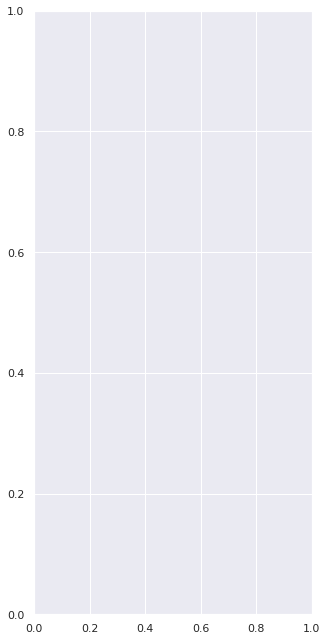

[0.7495 0.6829 0.7992 0.8334 0.575  0.7163 0.5846 0.6975 0.7269 0.8929
 0.89  ] [3.33032894 3.40040874 3.11968398 4.52100563 3.93476367 4.38541198
 4.1366787  3.27942133 3.72712874 3.28417277 2.95259953]


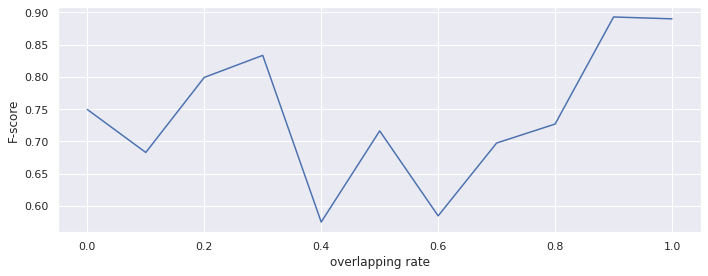

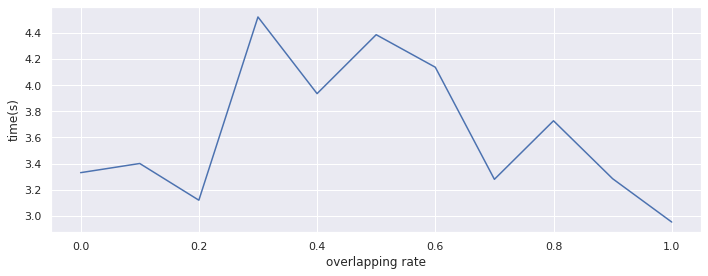

Time taken:      42.015s


In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(rctgs_origin, n, a, rctgs_extra, datetime, interval, beta_list, k=3):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(beta_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    z_max_dens = 0
    max_fscore = 0
    z_max_fscore = 0

    fpr_list = []
    time_list = []
            
    # rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    
    rect_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    rect_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = rect_origin + rect_extra

    fpr_for_each_b = []
    time_for_each_b = []

    for b in beta_list:
        import time as tm
        start = tm.time()
        rect_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
        rect_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
        points = []
        points.extend(rect_origin)
        points.extend(rect_extra)
        eps, mpt, = 1.61, 237
        bg = BoxGraph(sum(list_n), 2, eps, mpt, points)
        find_core_points(bg)
        nr_clusters = compute_cluster_cores(bg)
        assign_border_points(bg)
        end = tm.time()
        cost_time = end - start
        points = bg.points

        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print('labels:', np.unique(label))
        # print('the first 5 labels:', label[:5])
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        # ax = fig.add_subplot(row, column, order+cnt)
        # cnt += 1
        # ax = fig.add_axes([0, 0, 1, 1])
        # Hide spines, ticks, etc.

        # for idx, col in enumerate(colors,1):
        #     # print(idx, col)
        #     cluster_data = label == idx
        #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #                 c=col, marker='.', s=10)
        
        currentAxis = plt.gca()
        big_rect = rctgs_origin[-1]
        cluster_rect = []
        unique_label = np.unique(label)
        # unique_label = unique_label[unique_label != -1]
        # for idx, lbl in enumerate(np.unique(label),1):
        for idx in range(1,len(unique_label)+1):
            cluster_data = label == idx
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                # print(left, right, top,bottom)
                # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                cluster_rect.append(temp_rect)
        
        print('number of clusters:', len(cluster_rect))
        max_avg_dens = 0
        if len(cluster_rect)>0:
            # print(len(cluster_rect))
            k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1, b)
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_b.append(f_score)
            if len(k_density)>0: average_density = np.mean(k_density)
            else: average_density = 0
            # if average_density > max_avg_dens: 
            #     max_avg_dens = average_density
            #     eps_max_dens, mpt_max_dens = eps, mpt
            # if f_score > max_fscore: 
            #     max_fscore = f_score
            #     eps_max_fscore, mpt_max_fscore = eps, mpt
        end = tm.time()
        time_cost = end-start
        time_for_each_b.append(time_cost)
        #     for r in k_rects:
        #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        # for r in rctgs_extra:
        #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        # print(max_avg_dens)
        # title_1 = 'maximum overlapping rate: ' + str(round(b, 1)) + '\n'
        # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
        # # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
        # title_3_2 = 'precision: ' + str(precision) + '\n'
        # title_3_3 = 'recall: ' + str(recall) + '\n'
        # title_3 = 'f_score: ' + str(f_score) + '\n'
        # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        # title_5 = 'original points: ' + str(n_rect_points) + '\n'
        # title_6 = 'generated rect points: ' + str(n_extra_points)
        # title = title_1 + title_2 + title_3_2 + title_3_3 + title_3 + title_4
        # ax.set_title(title)           
        # # ax.set_xlabel(xlabel)
        # min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
        # min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
        # ax.set_xlim([min_x, max_x])
        # ax.set_ylim([min_y, max_y])
        # ax = fig.add_subplot(row, column, order+cnt)
        # cnt += 1
        # ax.axis('off')
        # ax.imshow(im, cmap='gray')
        # implot = plt.imshow(im)
            
    fpr_for_each_b = (np.array(fpr_for_each_b))
    time_for_each_b = (np.array(time_for_each_b))

    plt.show()

    return fpr_for_each_b, time_for_each_b
    
if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    # pow_list = np.arange(0,5)
    # min_area_list = 2**pow_list
    # # min_area_list = np.insert(min_area_list, 0, 0)
    # print(min_area_list)

    # z_list = np.array([1,2,5,10,20,50,100])
    k = 3
    beta_list = np.arange(0,1.1,0.1)

    import time 
    start = time.time()
    fpr_each_ma, time_each_ma = plot_clusters_taxi_many(rctgs_origin, list_n, list_a, rctgs_extra, datetime, lasting_hours, beta_list)
    print(fpr_each_ma, time_each_ma)
    fig = plt.figure(figsize=(10, 4))
    fpr_each_ma = np.array(fpr_each_ma)
    plt.plot(beta_list, fpr_each_ma)
    plt.xlabel('overlapping rate')
    plt.ylabel('F-score')
    fig = plt.figure(figsize=(10, 4))
    plt.plot(beta_list, time_each_ma)
    plt.xlabel('overlapping rate')
    plt.ylabel('time(s)')
    plt.show()
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

number of clusters: 26
number of clusters: 28
number of clusters: 29
number of clusters: 25
number of clusters: 28
number of clusters: 32
number of clusters: 25
number of clusters: 21
number of clusters: 23
number of clusters: 26
number of clusters: 31
number of clusters: 24
number of clusters: 26
number of clusters: 29
number of clusters: 26
number of clusters: 25
number of clusters: 22
number of clusters: 24
number of clusters: 29
number of clusters: 32


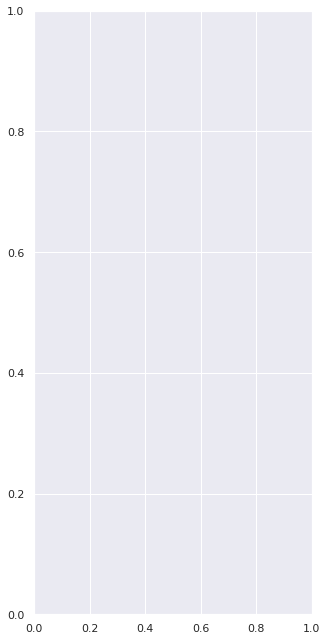

[0.7866 0.529  0.4479 0.4372 0.4003 0.2607 0.4429 0.335  0.4562 0.
 0.4635 0.5732 0.5579 0.     0.     0.     0.5392 0.     0.     0.    ] [3.58381677 4.28166723 3.3232069  4.1762085  3.23801541 3.35809565
 3.40103889 3.98850965 4.60596633 3.26957798 3.92260695 4.20437217
 4.19485879 3.71606016 4.18122458 3.73876357 4.72432399 3.79930258
 3.61491299 3.61248016]


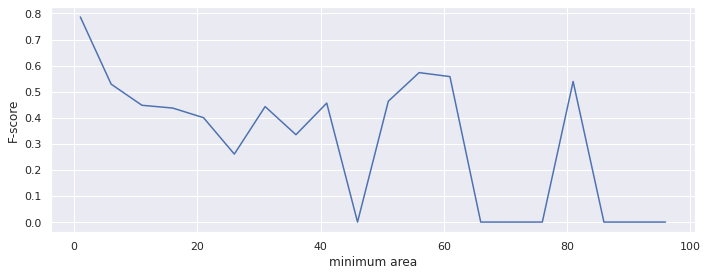

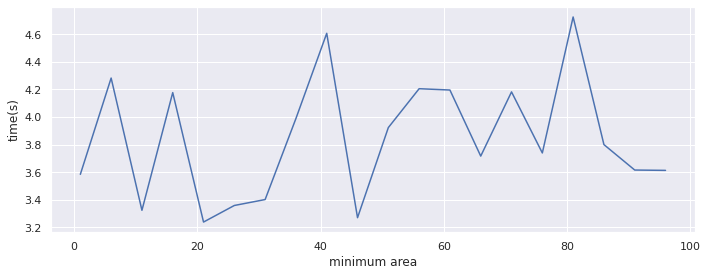

Time taken:      78.902s


In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(rctgs_origin, n, a, rctgs_extra, datetime, interval, min_area_list, k=3):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(beta_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    z_max_dens = 0
    max_fscore = 0
    z_max_fscore = 0

    fpr_list = []
    time_list = []
            
    # rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    
    rect_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    rect_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = rect_origin + rect_extra

    fpr_for_each_b = []
    time_for_each_b = []

    for b in min_area_list:
        import time as tm
        start = tm.time()
        rect_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
        rect_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
        points = []
        points.extend(rect_origin)
        points.extend(rect_extra)
        eps, mpt, = 1.61, 237
        bg = BoxGraph(sum(list_n), 2, eps, mpt, points)
        find_core_points(bg)
        nr_clusters = compute_cluster_cores(bg)
        assign_border_points(bg)
        end = tm.time()
        cost_time = end - start
        points = bg.points

        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print('labels:', np.unique(label))
        # print('the first 5 labels:', label[:5])
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        # ax = fig.add_subplot(row, column, order+cnt)
        # cnt += 1
        # ax = fig.add_axes([0, 0, 1, 1])
        # Hide spines, ticks, etc.

        # for idx, col in enumerate(colors,1):
        #     # print(idx, col)
        #     cluster_data = label == idx
        #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #                 c=col, marker='.', s=10)
        
        currentAxis = plt.gca()
        big_rect = rctgs_origin[-1]
        cluster_rect = []
        unique_label = np.unique(label)
        # unique_label = unique_label[unique_label != -1]
        # for idx, lbl in enumerate(np.unique(label),1):
        for idx in range(1,len(unique_label)+1):
            cluster_data = label == idx
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                # print(left, right, top,bottom)
                # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                cluster_rect.append(temp_rect)
        
        print('number of clusters:', len(cluster_rect))
        max_avg_dens = 0
        if len(cluster_rect)>0:
            # print(len(cluster_rect))
            k_rects, k_density = dense_rectangle(points, cluster_rect, 3, b, 1)
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_b.append(f_score)
            if len(k_density)>0: average_density = np.mean(k_density)
            else: average_density = 0
            # if average_density > max_avg_dens: 
            #     max_avg_dens = average_density
            #     eps_max_dens, mpt_max_dens = eps, mpt
            # if f_score > max_fscore: 
            #     max_fscore = f_score
            #     eps_max_fscore, mpt_max_fscore = eps, mpt
        end = tm.time()
        time_cost = end-start
        time_for_each_b.append(time_cost)
        #     for r in k_rects:
        #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        # for r in rctgs_extra:
        #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        # print(max_avg_dens)
        # title_1 = 'maximum overlapping rate: ' + str(round(b, 1)) + '\n'
        # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
        # # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
        # title_3_2 = 'precision: ' + str(precision) + '\n'
        # title_3_3 = 'recall: ' + str(recall) + '\n'
        # title_3 = 'f_score: ' + str(f_score) + '\n'
        # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        # title_5 = 'original points: ' + str(n_rect_points) + '\n'
        # title_6 = 'generated rect points: ' + str(n_extra_points)
        # title = title_1 + title_2 + title_3_2 + title_3_3 + title_3 + title_4
        # ax.set_title(title)           
        # # ax.set_xlabel(xlabel)
        # min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
        # min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
        # ax.set_xlim([min_x, max_x])
        # ax.set_ylim([min_y, max_y])
        # ax = fig.add_subplot(row, column, order+cnt)
        # cnt += 1
        # ax.axis('off')
        # ax.imshow(im, cmap='gray')
        # implot = plt.imshow(im)
            
    fpr_for_each_b = (np.array(fpr_for_each_b))
    time_for_each_b = (np.array(time_for_each_b))

    plt.show()

    return fpr_for_each_b, time_for_each_b
    
if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    # pow_list = np.arange(0,5)
    # min_area_list = 2**pow_list
    # # min_area_list = np.insert(min_area_list, 0, 0)
    # print(min_area_list)

    # z_list = np.array([1,2,5,10,20,50,100])
    k = 3
    min_area_list = np.arange(1,100,5)

    import time 
    start = time.time()
    fpr_each_ma, time_each_ma = plot_clusters_taxi_many(rctgs_origin, list_n, list_a, rctgs_extra, datetime, lasting_hours, min_area_list)
    print(fpr_each_ma, time_each_ma)
    fig = plt.figure(figsize=(10, 4))
    fpr_each_ma = np.array(fpr_each_ma)
    plt.plot(min_area_list, fpr_each_ma)
    plt.xlabel('minimum area')
    plt.ylabel('F-score')
    fig = plt.figure(figsize=(10, 4))
    plt.plot(min_area_list, time_each_ma)
    plt.xlabel('minimum area')
    plt.ylabel('time(s)')
    plt.show()
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

**Taxi set:** different epsilons and min_pts

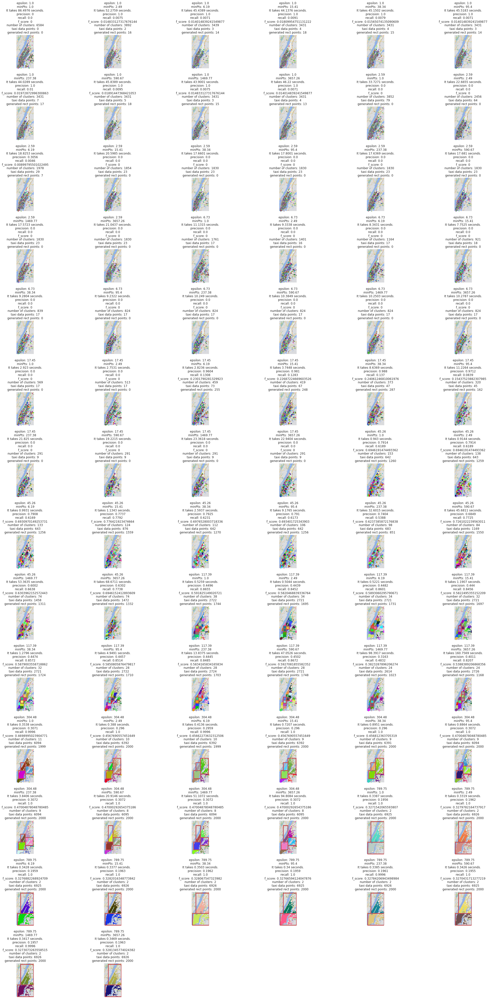

maximum average density: 11.831191014213575 , eps: 2.5937424601000023 , mpt: 1.0
maximum fscore: 0.776421923474664 , eps: 45.2592555681761 , mpt: 15.40702157458636


Time taken:      1746.406s


In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 65))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.7)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    # rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(taxi_list) + n
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, points) 
            bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax_im = fig.add_subplot(row, column, order+cnt)
            # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
            # pix_row = 907//row
            # pix_col = 471//column
            # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
            cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            ax_im.axis('off')
            ax_im.imshow(im, cmap='gray')
            implot = plt.imshow(im)

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre, precision, recall  = round(f_score, 4), round(precision,4), round(recall,4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            for r in rctgs:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3_2 = 'precision: ' + str(precision) + '\n'
            title_3_3 = 'recall: ' + str(recall) + '\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_rect_points)
            title = title_1 + title_2 + title_3_2 + title_3_3 + title_3 + title_4 + title_5 + title_6
            ax_im.set_title(title)           
            # ax_im.set_xlabel(xlabel)
            ax_im.set_xticks([])
            ax_im.set_yticks([])
            bg = None

    plt.show()
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    
if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    # data=pd.read_csv("yellow_tripdata_2015-01.csv")
    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    # del data['store_and_fwd_flag']
    # del data['RateCodeID']
    # del data['payment_type']
    # del data['fare_amount'] 
    # del data['extra']
    # del data['mta_tax']
    # del data['tip_amount']
    # del data['tolls_amount']
    # del data['improvement_surcharge']
    # del data['total_amount']

    # s_date = dt.date(2015,1,10)
    # s_time = dt.time(7,0,0)
    # s_datetime = dt.datetime.combine(s_date,s_time)
    # data_onehour = select_day(s_datetime, 1, data, 'tpep_pickup_datetime')

    # data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    # data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    # data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
    # data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
    # data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
    # data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

    # # data that fit in the image
    # data_onehour = data_onehour[(data_onehour['pickup_x'] >= 0) &
    #                             (data_onehour['pickup_x'] <= 471) &
    #                             (data_onehour['pickup_y'] <= 907) & 
    #                             (data_onehour['pickup_y'] >= 0)]

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

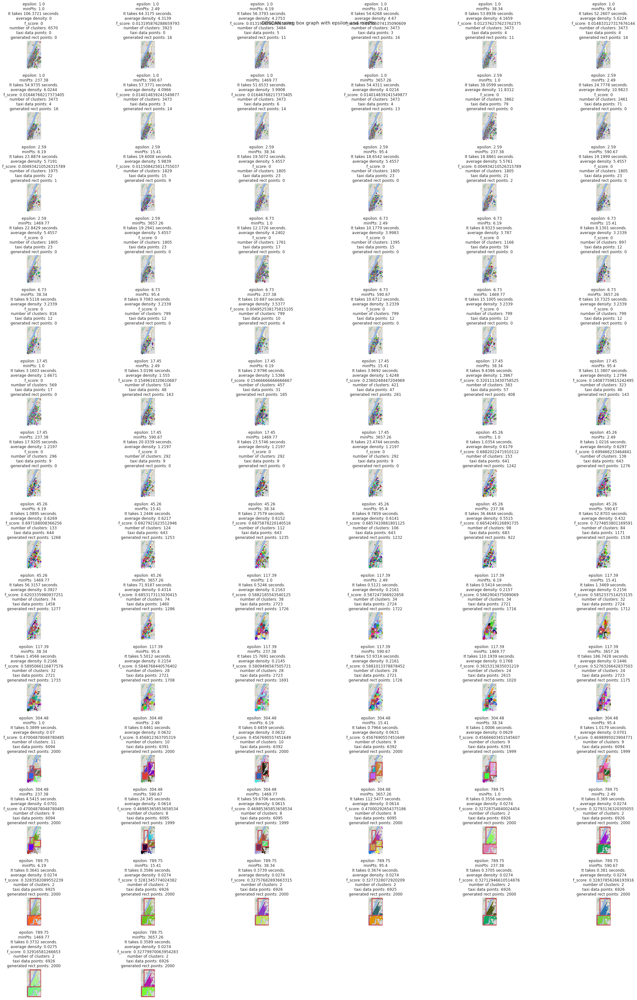

maximum average density: 11.831191014213575 , eps: 2.5937424601000023 , mpt: 1.0
maximum fscore: 0.7274853801169591 , eps: 45.2592555681761 , mpt: 590.6682291542425


Time taken:      1975.181s


In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    # rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(taxi_list) + n
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, points) 
            bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax_im = fig.add_subplot(row, column, order+cnt)
            # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
            # pix_row = 907//row
            # pix_col = 471//column
            # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
            cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            ax_im.axis('off')
            ax_im.imshow(im, cmap='gray')
            implot = plt.imshow(im)

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            for r in rctgs:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_rect_points)
            title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            ax_im.set_title(title)           
            # ax_im.set_xlabel(xlabel)
            ax_im.set_xticks([])
            ax_im.set_yticks([])
            bg = None

    plt.show()
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    
if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    # data=pd.read_csv("yellow_tripdata_2015-01.csv")
    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    # del data['store_and_fwd_flag']
    # del data['RateCodeID']
    # del data['payment_type']
    # del data['fare_amount'] 
    # del data['extra']
    # del data['mta_tax']
    # del data['tip_amount']
    # del data['tolls_amount']
    # del data['improvement_surcharge']
    # del data['total_amount']

    # s_date = dt.date(2015,1,10)
    # s_time = dt.time(7,0,0)
    # s_datetime = dt.datetime.combine(s_date,s_time)
    # data_onehour = select_day(s_datetime, 1, data, 'tpep_pickup_datetime')

    # data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    # data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    # data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
    # data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
    # data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
    # data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

    # # data that fit in the image
    # data_onehour = data_onehour[(data_onehour['pickup_x'] >= 0) &
    #                             (data_onehour['pickup_x'] <= 471) &
    #                             (data_onehour['pickup_y'] <= 907) & 
    #                             (data_onehour['pickup_y'] >= 0)]

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

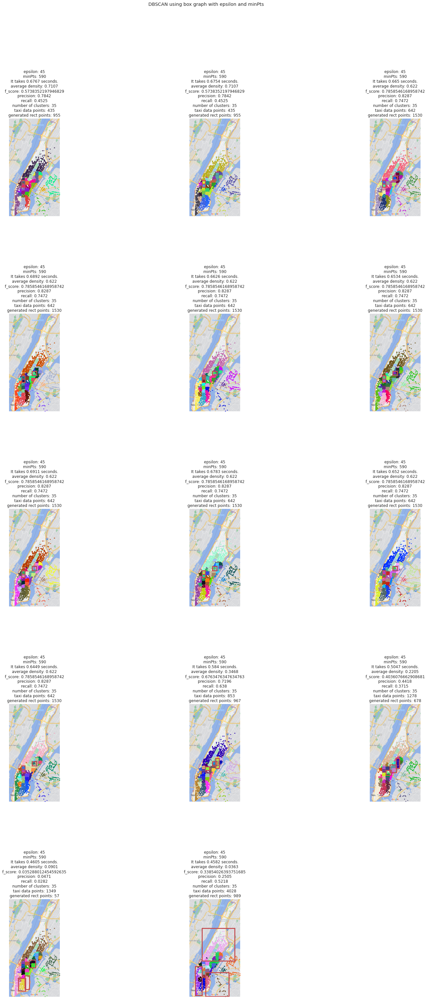

maximum average density: 0.7106882474989652 , min_area: 1
maximum fscore: 0.7858546168958742 , min_area: 4


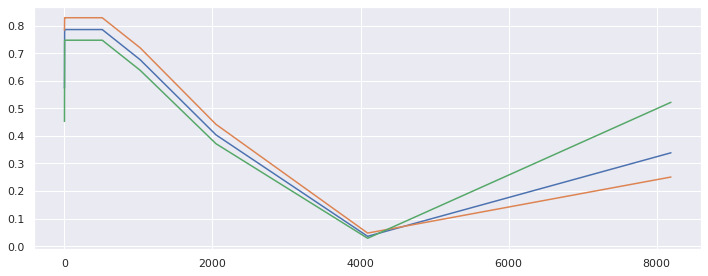

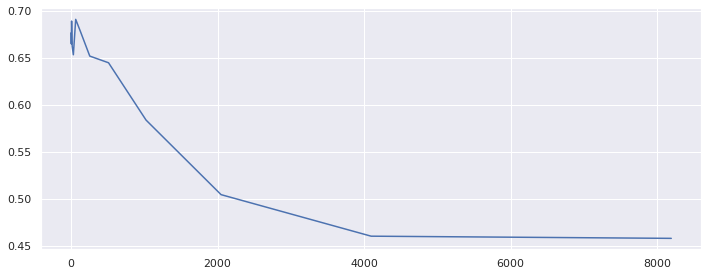

Time taken:      114.812s


In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(min_area_list) // 3 + 1  # number of rows
    column = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    eps, mpt = 45, 590
    taxi_list = generate_taxi(data_onehour)
    bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
    points = bg.points
    max_avg_dens, ma_max_dens = 0, 0
    max_fscore, ma_max_fscore = 0, 0
    fpr_each_ma, time_each_ma = [], []

    for ma in min_area_list:   
        import time as tm
        start = tm.time()

        label = [p.cluster_label for p in points]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print(len(np.unique(label)), 'labels:', np.unique(label))
        # print('the first 5 labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        ax_im = fig.add_subplot(row, column, order+cnt)
        # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
        # pix_row = 907//row
        # pix_col = 471//column
        # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
        cnt += 1
        # ax_im = fig.add_axes([0, 0, 1, 1])
        # Hide spines, ticks, etc.
        ax_im.axis('off')
        ax_im.imshow(im, cmap='gray')
        implot = plt.imshow(im)

        for idx, col in enumerate(colors,1):
            # print(idx, col)
            cluster_data = label == idx
            ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)
        
        currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        unique_label = np.unique(label)
        # unique_label = unique_label[unique_label != -1]
        # for idx, lbl in enumerate(np.unique(label),1):
        for idx in range(1,len(unique_label)+1):
            cluster_data = label == idx
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                # print(left, right, top,bottom)
                # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                cluster_rect.append(temp_rect)
        
        # print('number of clusters:', len(cluster_rect))
        average_density = 0
        f_score = 0
        n_taxi_points = n_rect_points = 0
        if len(cluster_rect)>0:
            # print('number of clusters:',len(cluster_rect))
            k_rects, k_density = dense_rectangle(points, cluster_rect, 3, ma)
        else:
            k_rects, k_density = [],[]
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, points)
        fpr_each_ma.append(np.array([f_score, precision, recall]))
        f_socre, precision, recall = round(f_score, 4), round(precision, 4), round(recall, 4)
        if len(k_density)>0: average_density = np.mean(k_density)
        else: average_density = 0
        if average_density > max_avg_dens: 
            max_avg_dens = average_density
            ma_max_dens = ma
        if f_score > max_fscore: 
            max_fscore = f_score
            ma_max_fscore = ma
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        for r in rctgs:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        # print('the maximum average density:',max_avg_dens)
        end = tm.time()
        cost_time = end - start
        time_each_ma.append(cost_time)
        title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
        title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
        title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
        title_3 = 'f_score: ' + str(f_score) + '\n' + 'precision: ' + str(precision) + '\n' + 'recall: ' + str(recall) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'generated rect points: ' + str(n_rect_points)
        title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
        ax_im.set_title(title)           
        # ax_im.set_xlabel(xlabel)
        ax_im.set_xticks([])
        ax_im.set_yticks([])
        bg = None

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', ma_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', ma_max_fscore)

    return fpr_each_ma, time_each_ma
    
if __name__ == "__main__":

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 1

    pow_list = np.arange(0,14)
    min_area_list = 2**pow_list

    import time 
    start = time.time()
    fpr_each_ma, time_each_ma = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, min_area_list)
    fig = plt.figure(figsize=(10, 4))
    plt.plot(min_area_list, fpr_each_ma)
    fig = plt.figure(figsize=(10, 4))
    plt.plot(min_area_list, time_each_ma)
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # row, columns, order = len(min_area_list)//2+1, 2, 1
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(fpr_each_ma[i,:,0],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i])
    #     ax.set_title(title_i)
    #     ax.set_xlim(0,1)
    #     ax.set_xlabel('F-score')
    #     ax.set_ylabel('Density')
    # plt.show()
    # fig = plt.figure(figsize=(4,3))
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(fpr_each_ma[i,:,1],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i])  
    #     ax.set_title(title_i)
    #     ax.set_xlabel('precision')
    #     ax.set_ylabel('Density')
    # plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(fpr_each_ma[i,:,2],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i])  
    #     ax.set_title(title_i)
    #     ax.set_xlabel('recall')
    #     ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

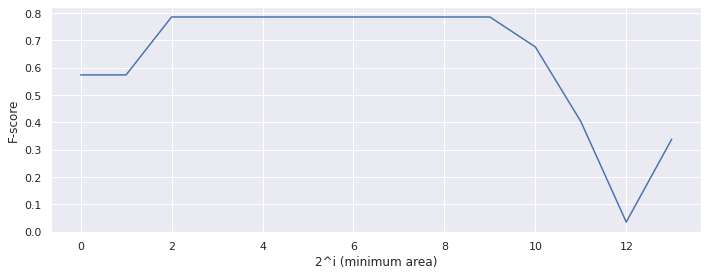

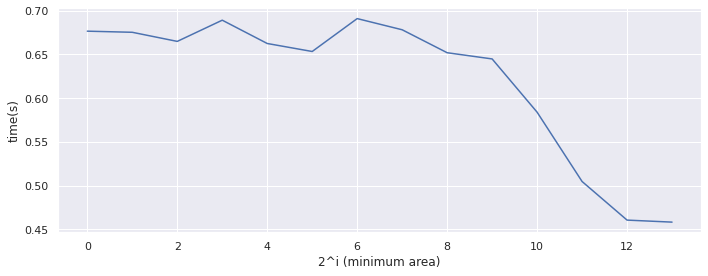

In [ ]:
fig = plt.figure(figsize=(10, 4))
fpr_each_ma = np.array(fpr_each_ma)
plt.plot(pow_list, fpr_each_ma[:,0])
plt.xlabel('2^i (minimum area)')
plt.ylabel('F-score')
fig = plt.figure(figsize=(10, 4))
plt.plot(pow_list, time_each_ma)
plt.xlabel('2^i (minimum area)')
plt.ylabel('time(s)')
plt.show()

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, disjoint_bound_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(min_area_list) // 3 + 1  # number of rows
    column = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    max_avg_dens, ma_max_dens = 0, 0
    max_fscore, ma_max_fscore = 0, 0
    fpr_each_ma, time_each_ma = [], []

    for db in disjoint_bound_list:  
        eps, mpt = 45, 590
        taxi_list = generate_taxi(data_onehour)
        bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
        points = bg.points 
        
        import time as tm
        start = tm.time()

        label = [p.cluster_label for p in points]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print(len(np.unique(label)), 'labels:', np.unique(label))
        # print('the first 5 labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        ax_im = fig.add_subplot(row, column, order+cnt)
        # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
        # pix_row = 907//row
        # pix_col = 471//column
        # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
        cnt += 1
        # ax_im = fig.add_axes([0, 0, 1, 1])
        # Hide spines, ticks, etc.
        ax_im.axis('off')
        ax_im.imshow(im, cmap='gray')
        implot = plt.imshow(im)

        for idx, col in enumerate(colors,1):
            # print(idx, col)
            cluster_data = label == idx
            ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)
        
        currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        unique_label = np.unique(label)
        # unique_label = unique_label[unique_label != -1]
        # for idx, lbl in enumerate(np.unique(label),1):
        for idx in range(1,len(unique_label)+1):
            cluster_data = label == idx
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                # print(left, right, top,bottom)
                # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                cluster_rect.append(temp_rect)
        
        # print('number of clusters:', len(cluster_rect))
        average_density = 0
        f_score = 0
        n_taxi_points = n_rect_points = 0
        if len(cluster_rect)>0:
            # print('number of clusters:',len(cluster_rect))
            k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1024, db)
        else:
            k_rects, k_density = [],[]
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, points)
        fpr_each_ma.append(np.array([f_score, precision, recall]))
        f_socre, precision, recall = round(f_score, 4), round(precision, 4), round(recall, 4)
        if len(k_density)>0: average_density = np.mean(k_density)
        else: average_density = 0
        if average_density > max_avg_dens: 
            max_avg_dens = average_density
            ma_max_dens = ma
        if f_score > max_fscore: 
            max_fscore = f_score
            ma_max_fscore = ma
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        for r in rctgs:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        # print('the maximum average density:',max_avg_dens)
        end = tm.time()
        cost_time = end - start
        time_each_ma.append(cost_time)
        title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
        title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
        title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
        title_3 = 'f_score: ' + str(f_score) + '\n' + 'precision: ' + str(precision) + '\n' + 'recall: ' + str(recall) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'generated rect points: ' + str(n_rect_points)
        title_7 = 'overlapping rate:' + str(1-db) + '\n'
        title = title_7 + title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
        ax_im.set_title(title)           
        # ax_im.set_xlabel(xlabel)
        ax_im.set_xticks([])
        ax_im.set_yticks([])
        bg = None

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', ma_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', ma_max_fscore)

    return fpr_each_ma, time_each_ma
    
if __name__ == "__main__":

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 1

    disjoint_bound_list =  np.arange(0, 1.1, 0.1)

    import time 
    start = time.time()
    fpr_each_ma, time_each_ma = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, disjoint_bound_list)
    fig = plt.figure(figsize=(10, 4))
    plt.plot(disjoint_bound_list, fpr_each_ma)
    fig = plt.figure(figsize=(10, 4))
    plt.plot(disjoint_bound_list, time_each_ma)
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # row, columns, order = len(min_area_list)//2+1, 2, 1
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(fpr_each_ma[i,:,0],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i])
    #     ax.set_title(title_i)
    #     ax.set_xlim(0,1)
    #     ax.set_xlabel('F-score')
    #     ax.set_ylabel('Density')
    # plt.show()
    # fig = plt.figure(figsize=(4,3))
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(fpr_each_ma[i,:,1],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i])  
    #     ax.set_title(title_i)
    #     ax.set_xlabel('precision')
    #     ax.set_ylabel('Density')
    # plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(fpr_each_ma[i,:,2],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i])  
    #     ax.set_title(title_i)
    #     ax.set_xlabel('recall')
    #     ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

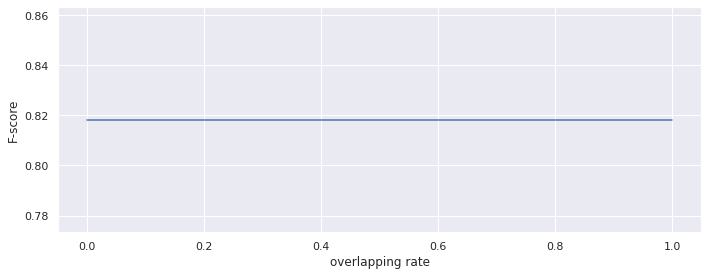

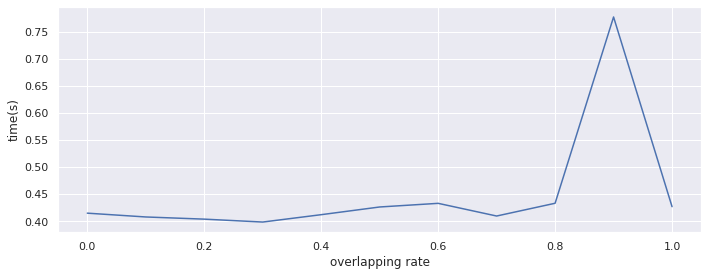

In [ ]:
fig = plt.figure(figsize=(10, 4))
fpr_each_ma = np.array(fpr_each_ma)
plt.plot(1-disjoint_bound_list, fpr_each_ma[:,0])
plt.xlabel('overlapping rate')
plt.ylabel('F-score')
fig = plt.figure(figsize=(10, 4))
plt.plot(1-disjoint_bound_list, time_each_ma)
plt.xlabel('overlapping rate')
plt.ylabel('time(s)')
plt.show()

KeyboardInterrupt: ignored

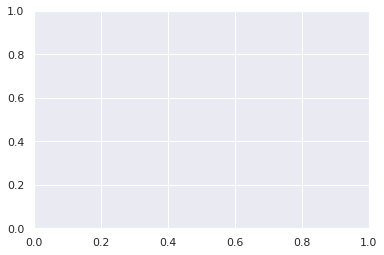

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    eps, mpt = 45, 590
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens, ma_max_dens = 0, 0
    max_fscore, ma_max_fscore = 0, 0
    fpr_each_ma, time_each_ma = [], []
    grid_fpr_list, grid_time_list = [], []

    for ma in min_area_list:   
        for _ in range(100):
            bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
            # pix_row = 907//row
            # pix_col = 471//column
            # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
            # cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
             
            import time as tm
            start = tm.time()
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, ma)
            else:
                k_rects, k_density = [],[]
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, points)
            fpr_each_ma.append(np.array([f_score, precision, recall]))
            f_socre, precision, recall = round(f_score, 4), round(precision, 4), round(recall, 4)
            if len(k_density)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                ma_max_dens = ma
            if f_score > max_fscore: 
                max_fscore = f_score
                ma_max_fscore = ma
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            time_each_ma.append(cost_time)
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n' + 'precision: ' + str(precision) + '\n' + 'recall: ' + str(recall) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None
        grid_fpr_list.append(fpr_each_ma)
        grid_time_list.append(time_each_ma)
    # plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', ma_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', ma_max_fscore)

    return grid_fpr_list, grid_time_list
    
if __name__ == "__main__":

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 1

    pow_list = np.arange(0,14)
    min_area_list = 2**pow_list

    import time 
    start = time.time()
    fpr_each_ma, time_each_ma = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, min_area_list)
    fpr_each_ma, time_each_ma = np.array(fpr_each_ma), np.array(time_each_ma)
    print(fpr_each_ma[0,:5], time_each_ma[0,:5])
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(min_area_list)//2+1, 2, 1
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_each_ma[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(4,3))
    for i in range(len(min_area_list)):
        tmp_label = 'min_area = ' + str(min_area_list[i])
        sns.kdeplot(time_each_ma[i],shade=True, label=tmp_label)
    ax.set_xlabel('time(s)')
    ax.set_ylabel('Density')
    ax.legend()
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_each_ma[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_each_ma[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    db_max_dens = 0
    max_fscore = 0
    db_max_fscore = 0

    fpr_list = []
    time_list = []
            
    rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    points = taxi_list + rect_list

    for ma in min_area_list:
        fpr_for_each_area = []
        time_for_each_area = []
        for _ in range(100):
            import time as tm
            start = tm.time()
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # ax.axis('off')
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, 30, 3, 0, min_area=ma)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = np.array(points_in_rect(k_rects, points))
            else:
                points_in_rects = []
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_area.append(np.array([f_score, precision, recall]))
            if len(k_rects)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                db_max_dens  = ma
            if f_score > max_fscore: 
                max_fscore = f_score
                db_max_fscore = ma
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=1)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start
            time_for_each_area.append(cost_time)
            # title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            # title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            # title_6 = 'taxi points: ' + str(n_taxi_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax.set_title(title)           
            # # ax.set_xlabel(xlabel)
            # ax.set_xticks([])
            # ax.set_yticks([])
            bg = None
        fpr_list.append(np.array(fpr_for_each_area))
        time_list.append(np.array(time_for_each_area))

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', db_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', db_max_fscore )

    fpr_list = np.array(fpr_list)
    return fpr_list, time_list
    
if __name__ == "__main__":

    min_area = 4
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    pow_list = np.arange(0,14)
    min_area_list = 2**pow_list

    import time 
    start = time.time()
    fpr_list, time_list = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, min_area_list)
    # fig = plt.figure(figsize=(15,8))
    # ax = fig.add_subplot(2,2,1)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,0],shade=True)
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,2)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,3)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,1],shade=True)
    # ax.set_xlabel('precision')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,4)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,2],shade=True)
    # ax.set_xlabel('recall')
    # ax.set_ylabel('Density')
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(min_area_list)//2+1, 2, 1
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(time_list[i],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i]) 
    #     ax.set_title(title_i)
    #     ax.set_xlabel('time(s)')
    #     ax.set_ylabel('Density')
    fig = plt.figure(figsize=(4,3))
    for i in range(len(min_area_list)):
        sns.kdeplot(time_list[i],shade=True)
    ax.set_xlabel('time(s)')
    ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

NameError: ignored

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    # rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(taxi_list) + n
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, points) 
            bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    
if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    # data=pd.read_csv("yellow_tripdata_2015-01.csv")
    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    # del data['store_and_fwd_flag']
    # del data['RateCodeID']
    # del data['payment_type']
    # del data['fare_amount'] 
    # del data['extra']
    # del data['mta_tax']
    # del data['tip_amount']
    # del data['tolls_amount']
    # del data['improvement_surcharge']
    # del data['total_amount']

    # s_date = dt.date(2015,1,10)
    # s_time = dt.time(7,0,0)
    # s_datetime = dt.datetime.combine(s_date,s_time)
    # data_onehour = select_day(s_datetime, 1, data, 'tpep_pickup_datetime')

    # data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    # data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    # data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
    # data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
    # data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
    # data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

    # # data that fit in the image
    # data_onehour = data_onehour[(data_onehour['pickup_x'] >= 0) &
    #                             (data_onehour['pickup_x'] <= 471) &
    #                             (data_onehour['pickup_y'] <= 907) & 
    #                             (data_onehour['pickup_y'] >= 0)]

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(9,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

maximum average density: 11.831191014213575 , eps: 2.5937424601000023 , mpt: 1.0
maximum fscore: 0.746062235881675 , eps: 45.2592555681761 , mpt: 590.6682291542425


Time taken:      1220.079s


number of epsilon < 20: 4
number of epsilon < 50: 1
number of epsilon < 100: 0
number of epsilon >= 100: 3
for epsilon: 1.0 the best k is 0 with fscore 0
for epsilon: 2.5937424601000023 the best k is 0 with fscore 0
for epsilon: 6.727499949325611 the best k is 8 with fscore 0.09447004608294933
for epsilon: 17.44940226888645 the best k is 8 with fscore 0.53994653994654
for epsilon: 45.2592555681761 the best k is 5 with fscore 0.8645933938574464
for epsilon: 117.39085287969579 the best k is 2 with fscore 0.652338811630847
for epsilon: 304.48163954141955 the best k is 3 with fscore 0.47004878048780485
for epsilon: 789.7469567994436 the best k is 3 with fscore 0.3275076504590275


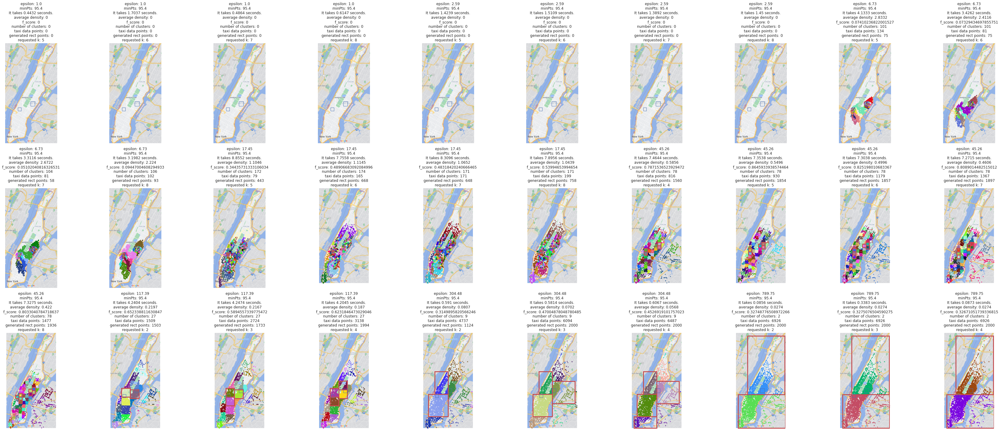

maximum average density: 2.8331823306516823 , eps: 6.727499949325611 , mpt: 95.39621664406893
maximum fscore: 0.8645933938574464 , eps: 45.2592555681761 , mpt: 95.39621664406893


Time taken:      127.579s


In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(len(data_list), d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = len(df.index), 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_oneday, n, a, rctgs, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(48, 200))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    epsilon_list_np = np.array(epsilon_list)
    less_than_20 = epsilon_list_np[epsilon_list_np<20]
    less_than_20_n = len(less_than_20) * len(list_k[0])
    less_than_50 = epsilon_list_np[(epsilon_list_np>=20) & (epsilon_list_np<50)]
    less_than_50_n = len(less_than_50) * len(list_k[1])
    less_than_100 = epsilon_list_np[(epsilon_list_np>=50) & (epsilon_list_np<100)]
    less_than_100_n = len(less_than_100) * len(list_k[2])
    more_than_100 = epsilon_list_np[epsilon_list_np>=100]
    more_than_100_n = len(more_than_100) * len(list_k[3])

    print('number of epsilon < 20:', len(less_than_20))
    print('number of epsilon < 50:', len(less_than_50) )
    print('number of epsilon < 100:', len(less_than_100) )
    print('number of epsilon >= 100:', len(more_than_100) )

    #  plot Numerical Data
    row = less_than_20_n + less_than_50_n + less_than_100_n + more_than_100_n  # number of rows
    columns = 10  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    n_samples = 500
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 5

    # rect_set_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    list_taxi = generate_taxi(data_onehour)
    max_avg_dens = 0
    eps_max_dens = mpt_max_dens = 0
    max_fscore = 0
    eps_max_fscore = mpt_max_fscore = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(list_taxi) + n
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        if eps<20 : ks = list_k[0]
        elif 20<=eps<50 : ks = list_k[1]
        elif 50<=eps<100 : ks = list_k[2]
        else : ks = list_k[3]
        k_max_fscore = fscore_each_k = 0
        for k in ks:
            for mpt in min_pts_list:      
                import time as tm
                start = tm.time()
                # bg = BoxGraph(n_points, 2, eps, mpt, points) 
                bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, list_taxi)
                end = tm.time()
                cost_time = end - start
                points = bg.points

                label = [p.cluster_label for p in points]
                label = np.array(label)

                colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
                
                # print(len(np.unique(label)), 'labels:', np.unique(label))
                # print('the first 5 labels:', np.unique(label))
                X = [np.array(points[i].coords) for i in range(len(points))]
                X = np.array(X)
                # print('number of coords:', len(X))
                # print('the first 5 coords:', X[:5])

                ax_im = fig.add_subplot(row, columns, order+cnt)
                # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
                # pix_row = 907//row
                # pix_col = 471//column
                # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
                cnt += 1
                # ax_im = fig.add_axes([0, 0, 1, 1])
                # Hide spines, ticks, etc.
                ax_im.axis('off')
                ax_im.imshow(im, cmap='gray')
                implot = plt.imshow(im)

                for idx, col in enumerate(colors,1):
                    # print(idx, col)
                    cluster_data = label == idx
                    ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                                c=col, marker='.', s=10)
                
                currentAxis = plt.gca()
                # big_rect = rctgs[-1]
                cluster_rect = []
                unique_label = np.unique(label)
                # unique_label = unique_label[unique_label != -1]
                # for idx, lbl in enumerate(np.unique(label),1):
                for idx in range(1,len(unique_label)+1):
                    cluster_data = label == idx
                    if np.any(cluster_data):
                        left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                        bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                        width, height = abs(right-left), abs(top-bottom)
                        # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                        temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                        # print(left, right, top,bottom)
                        # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                        cluster_rect.append(temp_rect)
                
                # print('number of clusters:', len(cluster_rect))
                average_density = 0
                f_score = 0
                n_taxi_points = n_rect_points = 0
                if len(cluster_rect)>0:
                    # print('number of clusters:',len(cluster_rect))
                    k_rects, k_density = dense_rectangle(points, cluster_rect, k, 1)
                    n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                    n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                    f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                    f_socre = round(f_score, 4)
                    if len(k_density)>0: average_density = np.mean(k_density)
                    else: average_density = 0
                    if average_density > max_avg_dens: 
                        max_avg_dens = average_density
                        eps_max_dens, mpt_max_dens = eps, mpt
                    if f_score > max_fscore: 
                        max_fscore = f_score
                        eps_max_fscore, mpt_max_fscore = eps, mpt
                    if f_score > fscore_each_k:
                        fscore_each_k = f_score
                        k_max_fscore = k
                    for r in k_rects:
                        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
                for r in rctgs:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

                # print('the maximum average density:',max_avg_dens)
                title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
                title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
                title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
                title_3 = 'f_score: ' + str(f_score) + '\n'
                title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
                title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
                title_6 = 'generated rect points: ' + str(n_rect_points) + '\n'
                title_7 = 'requested k: ' + str(k)
                title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6 + title_7
                ax_im.set_title(title)           
                # ax_im.set_xlabel(xlabel)
                ax_im.set_xticks([])
                ax_im.set_yticks([])
                bg = None
        print('for epsilon:', eps, 'the best k is', k_max_fscore, 'with fscore', fscore_each_k)
    plt.show()
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    
if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    # data=pd.read_csv("yellow_tripdata_2015-01.csv")
    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    # del data['store_and_fwd_flag']
    # del data['RateCodeID']
    # del data['payment_type']
    # del data['fare_amount'] 
    # del data['extra']
    # del data['mta_tax']
    # del data['tip_amount']
    # del data['tolls_amount']
    # del data['improvement_surcharge']
    # del data['total_amount']

    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    # data_onehour = select_day(s_datetime, 0.5, data, 'tpep_pickup_datetime')

    # data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    # data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    # data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
    # data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
    # data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
    # data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

    # # data that fit in the image
    # data_onehour = data_onehour[(data_oneday['pickup_x'] >= 0) &
    #                             (data_onehour['pickup_x'] <= 471) &
    #                             (data_onehour['pickup_y'] <= 907) & 
    #                             (data_onehour['pickup_y'] >= 0)]

    
    list_k = [list(range(5,9)), list(range(4,9)), list(range(2,5)), list(range(2,5))]

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
from IPython.display import clear_output

def plot_sliding_window_taxi_and_rect_prob_sampling(df,list_n, list_a, rctgs_extra, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    lasting_hours = 12

    rect_set_list = rectangle_set_list(list_n, list_a, rctgs_extra, datetime, interval)
    index_list = []
    for j in range(len(rect_set_list)):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_rect_set = list(map(rect_set_list.__getitem__, index_list))  # rect_set_list[np.array(index_list)]
    
    #  plot Numerical Data
    row = 4  # number of rows
    n_col = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(34):

        temp_taxi_prob = generate_bg_list(latest_window)
        temp_point_list = temp_taxi_prob + sampled_rect_set
        print('length of the prob taxi and prob rect:', len(temp_taxi_prob), len(sampled_rect_set))
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        find_core_points(temp_bg)
        nr_clusters = compute_cluster_cores(temp_bg)
        assign_border_points(temp_bg)
        points = temp_bg.points

        X_prob = [np.array(points[i].coords) for i in range(len(points))]
        X_prob = np.array(X_prob)
        label_prob = [points[i].cluster_label for i in range(len(points))]
        label_prob = np.array(label_prob)
        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

        # label = [points[i].cluster_label for i in range(len(points))]
        # label = np.array(label)

        temp_taxi_list = generate_bg_list(filtered_df)
        df_not_prob = temp_taxi_list + rect_set_list
        X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
        X = np.array(X)
        label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
        label = np.array(label)

        # ax = fig.add_subplot(row, n_col, order+cnt)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')      

        from pandas import DataFrame
        df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
        contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="rainbow", fill=True, cbar=True)
        contour.collections[0].set_alpha(0)

        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]

        # dots = ax.scatter(X[:, 0], X[:, 1],
        #                  marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label_prob))+1):
            cluster_data = label_prob == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        import time
        start = time.time()
        k_rects, average_density = dense_rectangle(points, cluster_rect, min_area=2**6)
        # print(len(k_rects), average_density)
        db = 0.5
        # if len(k_rects)>0:
        #     disjoint_rects = dense_disjoint_rectangle(k_rects, db)
        #     points_in_rects = np.array(points_in_rect(disjoint_rects, df_not_prob))
        points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
        f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, df_not_prob)
        f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4) 
        print('f, p, r:', f_score, precision, recall)

        # if len(points_in_rects)>0:
        #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
        #     # ax.plot(x, y, 'r.', markersize=2)
        #     # ax.scatter(X[:,0], X[:,1], s=2, c='grey')
        #     from pandas import DataFrame
        #     pos = []
        #     for i in range(len(x)):
        #         pos.append([x[i], y[i]])
        #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
        #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
        #     contour.collections[0].set_alpha(0)
            # xmin, xmax = x.min(), x.max()
            # ymin, ymax = y.min(), y.max()
            # X_, Y_ = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
            # positions = np.vstack([X_.ravel(), Y_.ravel()])
            # values = np.vstack([x, y])
            # from scipy import stats
            # kernel = stats.gaussian_kde(values)
            # Z_ = np.reshape(kernel(positions).T, X_.shape)
            # ax.imshow(np.rot90(Z_), cmap=plt.cm.gist_earth_r,
            # extent=[xmin, xmax, ymin, ymax])

        # ax.plot(X[:,0], X[:,1], 'grey.', markersize=2)
        
        # contour.imshow(im,aspect = contour.get_aspect(),
        #   zorder = 1)
        # currentAxis = plt.gca()
        # for r in disjoint_rects:
        #     currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='g', fill=None))
        # ax.set_title("Sample Algorithm")
        import time
        end = time.time()
        cost_time = end-start

        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs_extra:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

        title_1 = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w)) + ' \n'
        title_2 = 'f_score: ' + str(f_score) + '\n'
        title_3_1 = 'precision: ' + str(precision) + '\n'
        title_3_2 = 'recall: ' + str(recall) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'number of generated rect data points: ' + str(n_rect_points)
        title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
        plt.title(title_str)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        latest_window = filtered_tw.window
        filtered_df_tw = TimeWindow(w, start_time, filtered_df)
        filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
        filtered_df = filtered_df_tw.window
        start_time += dt.timedelta(minutes=interval)

    plt.show()

if __name__ == "__main__":

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    k = 3
    a = [0.5, 0.5]

    n = 2000

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    import time 
    start = time.time()
    print(len(data_onehour.index))
    plot_sliding_window_taxi_and_rect_prob_sampling(data_sat, n, a, rctgs, datetime, 30, 60, 'tpep_pickup_datetime', 45, 590, 1/4)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

# sampling algorithm functions

In [ ]:
def disjoint_dense_rectangle_pq(points, n_pairs, n_return_points, percent, min_area=1):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    c = n_pairs
    k = n_return_points
    # k = int(math.sqrt(c))
    # k = 2 * n**2 + n
    # c = 4 * k**2 + k    # the function with k
    list_rectangles = []
    list_densities = []
    # points = input_obj.cluster_points
    cnt = 0

    for i in range(c):
    # while len(list_rectangles) < c:
        p, q = random.choices(points, k=2)
        center_x, center_y = (p.coords[0]+q.coords[0])/2, (p.coords[1]+q.coords[1])/2
        center_width, center_height = abs(p.coords[0]-q.coords[0]), abs(p.coords[1]-q.coords[1])
        rect_pq = Rectangle(center_x, center_y, center_width, center_height)
        if rect_pq.area>min_area:
            density_pq = n_of_points_in_rectangle_pq(p,q,points) / (rect_pq.area+EPS)
            list_rectangles.append(rect_pq)
            list_densities.append(density_pq)
    if len(list_rectangles)<=0:
        return [], []
    
    # zip and sort
    sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rectangles),key=itemgetter(0))))
    sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]

    disjoint_rect = [sorted_rectangles[0]]
    disjoint_densities = [sorted_densities[0]]
    cnt = 1
    for i,r in enumerate(sorted_rectangles[1:]):
        flag_disjoint = True
        for j,dr in enumerate(disjoint_rect):
            if intersect_area(r, dr) > percent*r.area or intersect_area(r, dr) > percent*dr.area:
                flag_disjoint = False
        if flag_disjoint:
            disjoint_rect.append(r)
            disjoint_densities.append(sorted_densities[i])
            cnt += 1
        if cnt>=k:
            break
    return disjoint_rect[:k], disjoint_densities[:k]

# sampling algorithm experiments

In [ ]:
################# sampling algorithm #####################
from IPython.display import clear_output

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)



def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]
    filtered_df = origin_filtered_df

    # initializing the window
    init_df = TimeWindow(w, start_time, filtered_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    #  plot Numerical Data
    row = 4  # number of rows
    n_col = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    
    update_start_time = start_time
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
    
    # generate the boxgraph for the window and run DBSCAN
    for m in range(24):

        import time
        time_cost_start = time.time()
        
        df_not_prob = generate_bg_list(filtered_df) + rect_set_list
        X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
        X = np.array(X)
        label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
        label = np.array(label)
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        
        # ax = fig.add_subplot(row, n_col, order+cnt)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')

        # for idx, col in enumerate(colors):
        #     # print(idx, col)
        #     cluster_data = label == idx
        #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #                 c=col, marker='.', s=10)
        dots = ax.scatter(X[:, 0], X[:, 1],
                        marker='.', s=10)

        currentAxis = plt.gca()
        big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label))+1):
            cluster_data = label == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        # k_rects, average_density = dense_rectangle(temp_point_list, cluster_rect)
        k_rects, average_density = disjoint_dense_rectangle_pq(df_not_prob, 40, 4, 0.8)
        # print(len(k_rects), average_density)
        points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
        f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
        f_socre = round(f_score, 4)

        ax.scatter(X[:,0], X[:,1], s=2, c='grey')

        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if len(points_in_rects)>0:
            x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            ax.plot(x, y, 'r.', markersize=2)
            from pandas import DataFrame
            pos = []
            for i in range(len(x)):
                pos.append([x[i], y[i]])
            df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            contour.collections[0].set_alpha(0)

        title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
        # title_2 = 'sample rate:' + str(prob) + '\n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'rect data points: ' + str(n_rect_points)
        title_str = title_1 + title_3 + title_4 + title_5 + title_6
        plt.title(title_str)
        update_start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        # filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        # latest_window = filtered_tw.window
        # filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
        if m<23:
            filtered_tw = filtered_tw.sliding(interval, df, column)
            latest_window = filtered_tw.window

        import time
        time_cost_end = time.time()
        time_cost = time_cost_end - time_cost_start
    plt.show()
        
if __name__ == '__main__':
    fscore_list, time_cost_list = plot_sliding_window_taxi_and_rect_multi_prob( \
        data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 45, 590)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
################# sampling algorithm #####################
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def generate_taxi(df):
    n, d = len(df.index), 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def dense_rectangle_pq(points, n_pairs, n_return_points):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    c = n_pairs
    k = n_return_points
    # k = int(math.sqrt(c))
    # k = 2 * n**2 + n
    # c = 4 * k**2 + k    # the function with k
    list_rectangles = []
    list_densities = []
    # points = input_obj.cluster_points
    cnt = 0

    for i in range(c):
    # while len(list_rectangles) < c:
        p, q = random.choices(points, k=2)
        center_x, center_y = (p.coords[0]+q.coords[0])/2, (p.coords[1]+q.coords[1])/2
        center_width, center_height = abs(p.coords[0]-q.coords[0]), abs(p.coords[1]-q.coords[1])
        rect_pq = Rectangle(center_x, center_y, center_width, center_height)
        if rect_pq.area>1:
            density_pq = n_of_points_in_rectangle_pq(p,q,points) / (rect_pq.area+EPS)
            list_rectangles.append(rect_pq)
            list_densities.append(density_pq)

    # zip and sort
    if len(list_densities)>0:
        sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rectangles),key=itemgetter(0))))
        sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]
        return sorted_rectangles[:k], sorted_densities[:k]
    else:
        return [], []

def plot_sliding_window_taxi_and_rect_multi_prob(n, a, rctgs, datetime, interval, data_onehour, list_k):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(list_k) // 3  # number of rows
    column = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)

    taxi_list = generate_taxi(data_onehour)
    rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    points = taxi_list + rect_list
    
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
    
    # generate the boxgraph for the window and run DBSCAN
    for tk in range(len(list_k)):

        import time
        time_cost_start = time.time()
        
        df_not_prob = points
        X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
        X = np.array(X)
        label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
        label = np.array(label)
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        
        # ax = fig.add_subplot(row, n_col, order+cnt)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')

        # for idx, col in enumerate(colors):
        #     # print(idx, col)
        #     cluster_data = label == idx
        #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #                 c=col, marker='.', s=10)
        dots = ax.scatter(X[:, 0], X[:, 1],
                        marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        # cluster_rect = []
        # for idx in range(1,len(np.unique(label))+1):
        #     cluster_data = label == idx
        #     # print(len(cluster_data),np.unique(cluster_data))
        #     if np.any(cluster_data):
        #         left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
        #         bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
        #         width, height = abs(right-left), abs(top-bottom)
        #         # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
        #         temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
        #         cluster_rect.append(temp_rect)

        # k_rects, average_density = dense_rectangle(temp_point_list, cluster_rect)
        k_rects, average_density = dense_rectangle_pq(df_not_prob, 2*tk, tk)
        # print(len(k_rects), average_density)
        if len(k_rects)>0:
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
            f_score = round(f_score, 4)
        else:
            points_in_rects = []
            n_rect_points = 0
            n_taxi_points = 0
            f_score = 0

        ax.scatter(X[:,0], X[:,1], s=2, c='grey')

        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if len(points_in_rects)>0:
            x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            ax.plot(x, y, 'r.', markersize=2)
            from pandas import DataFrame
            pos = []
            for i in range(len(x)):
                pos.append([x[i], y[i]])
            df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            contour.collections[0].set_alpha(0)

        # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
        # title_2 = 'sample rate:' + str(prob) + '\n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
        title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'rect data points: ' + str(n_rect_points)
        title_str = title_3 + title_4 + title_5 + title_6
        plt.title(title_str)
        # update_start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        import time
        time_cost_end = time.time()
        time_cost = time_cost_end - time_cost_start

        
if __name__ == '__main__':
    
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 1

    list_k = list(range(5, 21, 5))

    plot_sliding_window_taxi_and_rect_multi_prob(n, a, rctgs, datetime, interval, data_onehour, list_k)

Output hidden; open in https://colab.research.google.com to view.

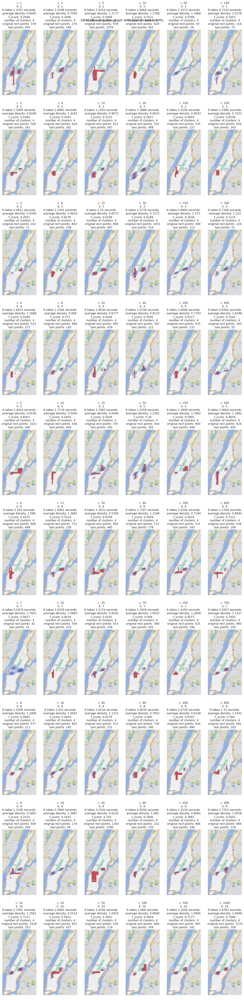

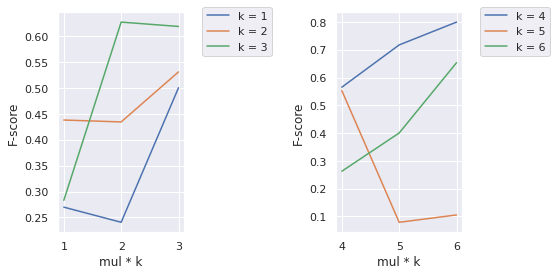

maximum average density: 2.069842507282179 , c: 1000 , k: 10
maximum fscore: 0.7999 , c: 1000 , k: 10


Time taken:      120.990s


In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, k_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(15, 60))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(k_list)   # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    c_max_dens, k_max_dens = 0,0
    max_fscore = 0
    c_max_fscore, k_max_fscore = 0,0

    # same row, same k, different c
    grid_k_c = []

    for k in k_list:
        row_k = []
        c_list = [k, 2*k, 5*k, 10*k, 50*k, 100*k]
        for c in c_list:      
            import time as tm
            start = tm.time()
            
            rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
            points = taxi_list + rect_list
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax = fig.add_subplot(row, column, order+cnt)
            cnt += 1
            ax.axis('off')
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, 40, 4, 0.8)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                # disjoint_rects = dense_disjoint_rectangle(k_rects, 0.7)
                points_in_rects = np.array(points_in_rect(k_rects, points))
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_score = round(f_score, 4)
                if len(k_rects)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    c_max_dens, k_max_dens = c, k
                if f_score > max_fscore: 
                    max_fscore = f_score
                    c_max_fscore, k_max_fscore = c, k
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            else:
                points_in_rects = []
                n_rect_points = 0
                n_taxi_points = 0
                f_score = 0
            for r in rctgs:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            row_k.append(f_score)
            ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            if len(points_in_rects)>0:
                x, y = points_in_rects[:, 0], points_in_rects[:, 1]
                ax.plot(x, y, 'r.', markersize=2)
                from pandas import DataFrame
                pos = []
                for i in range(len(x)):
                    pos.append([x[i], y[i]])
                df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
                contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
                contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start

            title_1 = 'c: ' + str(round(c,2)) + '\n' + 'k: ' + str(round(k,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            title_6 = 'taxi points: ' + str(n_taxi_points)
            title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            ax.set_title(title)           
            # ax.set_xlabel(xlabel)
            ax.set_xticks([])
            ax.set_yticks([])
            bg = None
        row_k = np.array(row_k)
        grid_k_c.append(row_k)
    fig = plt.figure(figsize=(8,4))
    ax = fig.add_subplot(1,2,1)
    grid_k_c = np.array(grid_k_c)
    mul = [1, 2, 3,4,5,6]
    for i in range(len(grid_k_c[:3])):
        label = 'k = ' + str(mul[i])
        plt.plot(mul, grid_k_c[i][:3], label = label)
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.xlabel('mul * k')
    plt.ylabel('F-score')
    ax = fig.add_subplot(1,2,2)
    for i in range(len(mul[3:])):
        label = 'k = ' + str(mul[3:][i])
        plt.plot(mul, grid_k_c[i-1][3:], label = label)
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.xlabel('mul * k')
    plt.ylabel('F-score')
    plt.show()
    print('maximum average density:', max_avg_dens, ', c:', c_max_dens, ', k:', k_max_dens)
    print('maximum fscore:', max_fscore, ', c:', c_max_fscore, ', k:', k_max_fscore)
    
if __name__ == "__main__":

    min_area = 4
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    k_list = list(range(1,11))

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, k_list)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, disjoint_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(15, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(disjoint_list) // 3 + 1  # number of rows
    column = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    db_max_dens = 0
    max_fscore = 0
    db_max_fscore = 0

    fpr_list = []
    time_list = []

    for db in disjoint_list:
        import time as tm
        start = tm.time()
        
        rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
        points = taxi_list + rect_list
        
        label = [p.cluster_label for p in points]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print(len(np.unique(label)), 'labels:', np.unique(label))
        # print('the first 5 labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        ax = fig.add_subplot(row, column, order+cnt)
        cnt += 1
        ax.axis('off')
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        
        k_rects, k_density = disjoint_dense_rectangle_pq(points, 15, 3,db)
        currentAxis = plt.gca()
        if len(k_rects)>0:
            points_in_rects = np.array(points_in_rect(k_rects, points))
        else:
            points_in_rects = []
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
        f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
        fpr_list.append(np.array([f_score, precision, recall]))
        if len(k_rects)>0: average_density = np.mean(k_density)
        else: average_density = 0
        if average_density > max_avg_dens: 
            max_avg_dens = average_density
            db_max_dens  = db
        if f_score > max_fscore: 
            max_fscore = f_score
            db_max_fscore = db
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        for r in rctgs:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
        ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if len(points_in_rects)>0:
            x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            ax.plot(x, y, 'r.', markersize=1)
            from pandas import DataFrame
            pos = []
            for i in range(len(x)):
                pos.append([x[i], y[i]])
            df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            contour.collections[0].set_alpha(0)
        
        end = tm.time()
        cost_time = end - start
        time_list.append(cost_time)
        title_1 = 'disjoint rate: ' + str(round(db,2)) + '\n'
        title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
        title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
        title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
        title_6 = 'taxi points: ' + str(n_taxi_points)
        title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
        ax.set_title(title)           
        # ax.set_xlabel(xlabel)
        ax.set_xticks([])
        ax.set_yticks([])
        bg = None

    plt.show()
    print('maximum average density:', max_avg_dens, ', db:', db_max_dens)
    print('maximum fscore:', max_fscore, ', db:', db_max_fscore )

    fpr_list = np.array(fpr_list)
    fig = plt.figure(figsize=(15,8))
    ax = fig.add_subplot(2,2,1)
    # print('the first 20 item in list:',fscore_dbscan[:20])
    ax.plot(db_list,fpr_list[:,0])
    # plt.figure(figsize=(10,5))
    ax.set_xlim(0,1)
    ax.set_xlabel('overlapping rate')
    ax.set_ylabel('F-score')
    ax = fig.add_subplot(2,2,2)
    ax.plot(db_list,time_list)
    ax.set_xlabel('overlapping rate')
    ax.set_ylabel('time(s)')
    ax = fig.add_subplot(2,2,3)
    ax.plot(db_list,fpr_list[:,1])
    ax.set_xlabel('overlapping rate')
    ax.set_ylabel('precision')
    ax = fig.add_subplot(2,2,4)
    ax.plot(db_list,fpr_list[:,2])
    ax.set_xlabel('overlapping rate')
    ax.set_ylabel('recall')
    
if __name__ == "__main__":

    min_area = 4
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    db_list = np.arange(0,1.1,0.1)

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, db_list)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

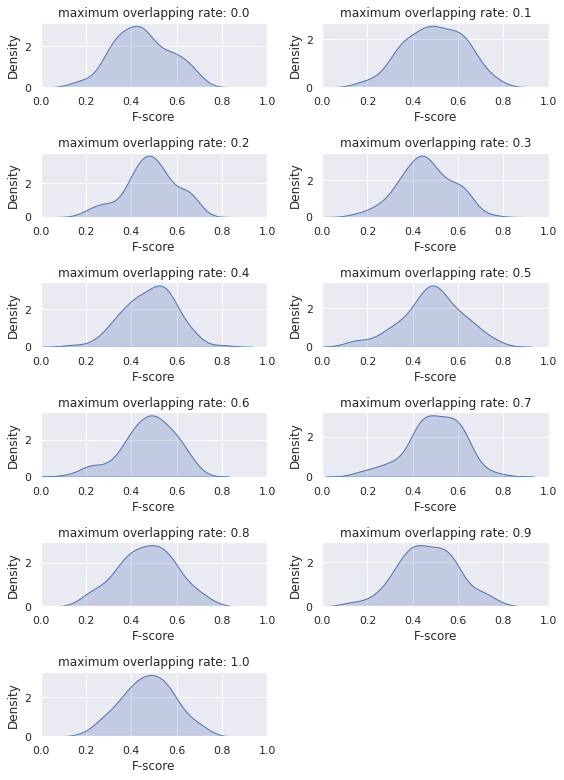

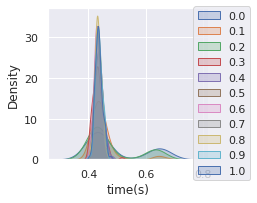

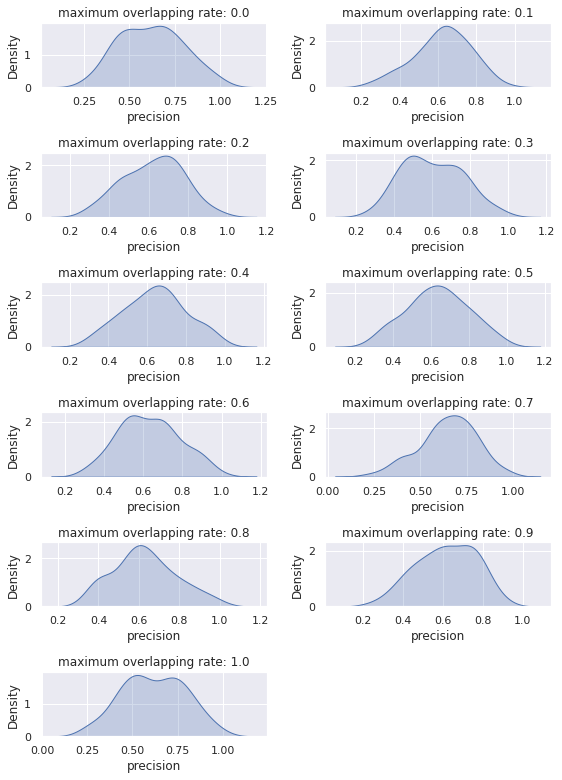

Time taken:      7.124s


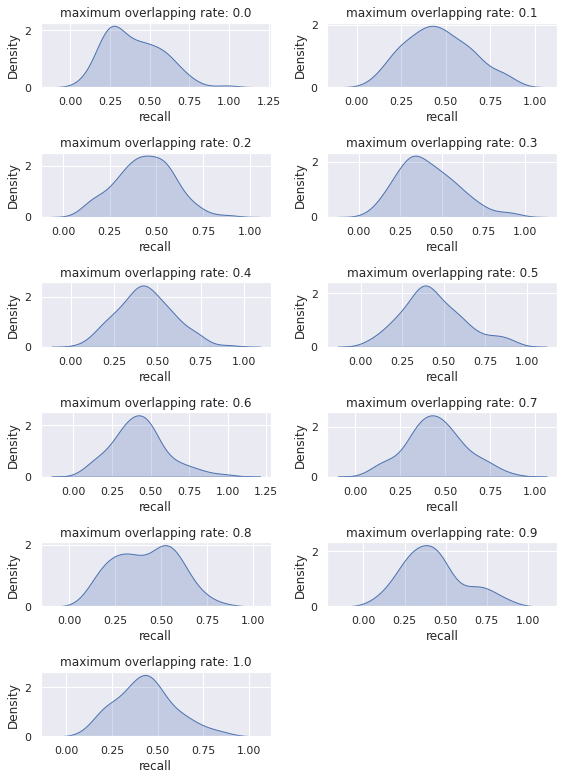

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    db_max_dens = 0
    max_fscore = 0
    db_max_fscore = 0

    fpr_list = []
    time_list = []
            
    rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    points = taxi_list + rect_list

    for ma in min_area_list:
        fpr_for_each_area = []
        time_for_each_area = []
        for _ in range(100):
            import time as tm
            start = tm.time()
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # ax.axis('off')
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, 60, 6, 1, min_area=ma)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = np.array(points_in_rect(k_rects, points))
            else:
                points_in_rects = []
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_area.append(np.array([f_score, precision, recall]))
            if len(k_rects)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                db_max_dens  = ma
            if f_score > max_fscore: 
                max_fscore = f_score
                db_max_fscore = ma
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=1)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start
            time_for_each_area.append(cost_time)
            # title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            # title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            # title_6 = 'taxi points: ' + str(n_taxi_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax.set_title(title)           
            # # ax.set_xlabel(xlabel)
            # ax.set_xticks([])
            # ax.set_yticks([])
            bg = None
        fpr_list.append(np.array(fpr_for_each_area))
        time_list.append(np.array(time_for_each_area))

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', db_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', db_max_fscore )

    fpr_list = np.array(fpr_list)
    return fpr_list, time_list
    
if __name__ == "__main__":

    min_area = 4
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    db_list = np.arange(0,1.1,0.1)

    import time 
    start = time.time()
    fpr_list, time_list = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, db_list)
    # fig = plt.figure(figsize=(15,8))
    # ax = fig.add_subplot(2,2,1)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,0],shade=True)
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,2)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,3)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,1],shade=True)
    # ax.set_xlabel('precision')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,4)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,2],shade=True)
    # ax.set_xlabel('recall')
    # ax.set_ylabel('Density')
    fig = plt.figure(figsize=(8,len(db_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(db_list)//2+1, 2, 1
    for i in range(len(db_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,0],shade=True)
        title_i = 'maximum overlapping rate: ' + str(round(db_list[i], 1))
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(time_list[i],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i]) 
    #     ax.set_title(title_i)
    #     ax.set_xlabel('time(s)')
    #     ax.set_ylabel('Density')
    fig = plt.figure(figsize=(4,3))
    for i,b in enumerate(db_list):
        sns.kdeplot(time_list[i],shade=True, label=round(b,1))
    plt.xlabel('time(s)')
    plt.ylabel('Density')
    plt.legend(bbox_to_anchor=(1.3, 1.05))
    # bbox_to_anchor=(1.1, 1.05)
    plt.show()
    fig = plt.figure(figsize=(8,len(db_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(db_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,1],shade=True)
        title_i = 'maximum overlapping rate: ' + str(round(db_list[i], 1))
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(db_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(db_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,2],shade=True)
        title_i = 'maximum overlapping rate: ' +  str(round(db_list[i], 1))
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(15, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(min_area_list) // 3 + 1  # number of rows
    column = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    db_max_dens = 0
    max_fscore = 0
    db_max_fscore = 0

    fpr_list = []
    time_list = []

    for ma in min_area_list:
        import time as tm
        start = tm.time()
        
        rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
        points = taxi_list + rect_list
        
        label = [p.cluster_label for p in points]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print(len(np.unique(label)), 'labels:', np.unique(label))
        # print('the first 5 labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        ax = fig.add_subplot(row, column, order+cnt)
        cnt += 1
        ax.axis('off')
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        
        k_rects, k_density = disjoint_dense_rectangle_pq(points, 30, 3, 0, min_area=ma)
        currentAxis = plt.gca()
        if len(k_rects)>0:
            points_in_rects = np.array(points_in_rect(k_rects, points))
        else:
            points_in_rects = []
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
        f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
        fpr_list.append(np.array([f_score, precision, recall]))
        if len(k_rects)>0: average_density = np.mean(k_density)
        else: average_density = 0
        if average_density > max_avg_dens: 
            max_avg_dens = average_density
            db_max_dens  = ma
        if f_score > max_fscore: 
            max_fscore = f_score
            db_max_fscore = ma
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        for r in rctgs:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
        ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if len(points_in_rects)>0:
            x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            ax.plot(x, y, 'r.', markersize=1)
            from pandas import DataFrame
            pos = []
            for i in range(len(x)):
                pos.append([x[i], y[i]])
            df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            contour.collections[0].set_alpha(0)
        
        end = tm.time()
        cost_time = end - start
        time_list.append(cost_time)
        title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
        title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
        title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
        title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
        title_6 = 'taxi points: ' + str(n_taxi_points)
        title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
        ax.set_title(title)           
        # ax.set_xlabel(xlabel)
        ax.set_xticks([])
        ax.set_yticks([])
        bg = None

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', db_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', db_max_fscore )

    fpr_list = np.array(fpr_list)
    fig = plt.figure(figsize=(15,8))
    ax = fig.add_subplot(2,2,1)
    # print('the first 20 item in list:',fscore_dbscan[:20])
    ax.plot(min_area_list,fpr_list[:,0])
    # plt.figure(figsize=(10,5))
    ax.set_ylim(0,1)
    ax.set_xlabel('minimum area')
    ax.set_ylabel('F-score')
    ax = fig.add_subplot(2,2,2)
    ax.plot(min_area_list,time_list)
    ax.set_xlabel('minimum area')
    ax.set_ylabel('time(s)')
    ax = fig.add_subplot(2,2,3)
    ax.plot(min_area_list,fpr_list[:,1])
    ax.set_xlabel('minimum area')
    ax.set_ylabel('precision')
    ax = fig.add_subplot(2,2,4)
    ax.plot(min_area_list,fpr_list[:,2])
    ax.set_xlabel('minimum area')
    ax.set_ylabel('recall')
    
if __name__ == "__main__":

    min_area = 4
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    pow_list = np.arange(0,9)
    min_area_list = 2**pow_list

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, min_area_list)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

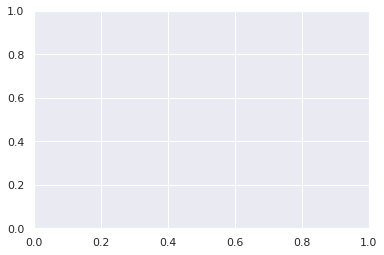

maximum average density: 4.849798851209111 , min_area: 1
maximum fscore: 0.8539 , min_area: 512


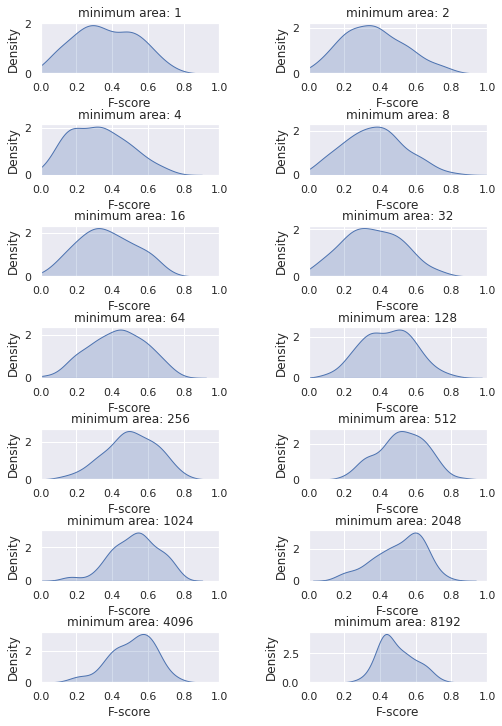

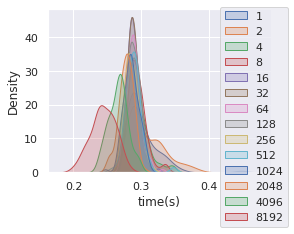

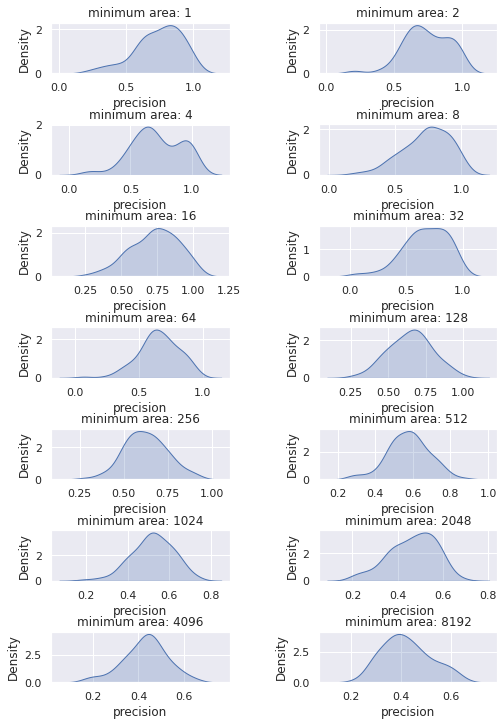

Time taken:      407.988s


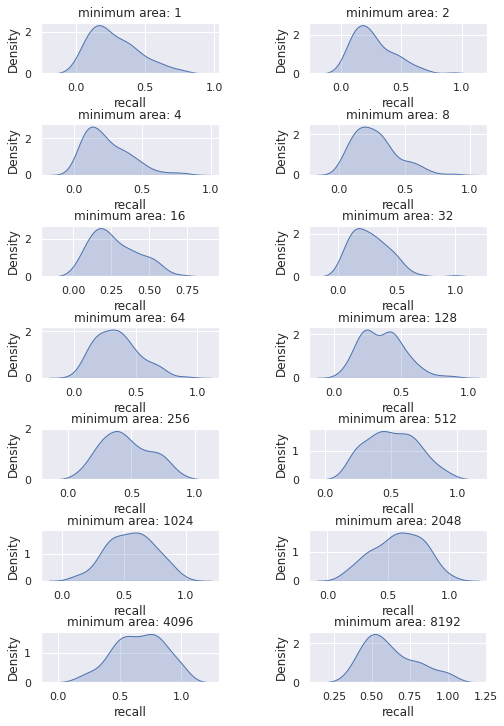

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    db_max_dens = 0
    max_fscore = 0
    db_max_fscore = 0

    fpr_list = []
    time_list = []
            
    rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    points = taxi_list + rect_list

    for ma in min_area_list:
        fpr_for_each_area = []
        time_for_each_area = []
        for _ in range(100):
            import time as tm
            start = tm.time()
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # ax.axis('off')
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, 30, 3, 0, min_area=ma)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = np.array(points_in_rect(k_rects, points))
            else:
                points_in_rects = []
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_area.append(np.array([f_score, precision, recall]))
            if len(k_rects)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                db_max_dens  = ma
            if f_score > max_fscore: 
                max_fscore = f_score
                db_max_fscore = ma
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=1)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start
            time_for_each_area.append(cost_time)
            # title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            # title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            # title_6 = 'taxi points: ' + str(n_taxi_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax.set_title(title)           
            # # ax.set_xlabel(xlabel)
            # ax.set_xticks([])
            # ax.set_yticks([])
            bg = None
        fpr_list.append(np.array(fpr_for_each_area))
        time_list.append(np.array(time_for_each_area))

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', db_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', db_max_fscore )

    fpr_list = np.array(fpr_list)
    return fpr_list, time_list
    
if __name__ == "__main__":

    min_area = 4
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    pow_list = np.arange(0,14)
    min_area_list = 2**pow_list

    import time 
    start = time.time()
    fpr_list, time_list = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, min_area_list)
    # fig = plt.figure(figsize=(15,8))
    # ax = fig.add_subplot(2,2,1)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,0],shade=True)
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,2)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,3)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,1],shade=True)
    # ax.set_xlabel('precision')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,4)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,2],shade=True)
    # ax.set_xlabel('recall')
    # ax.set_ylabel('Density')
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(min_area_list)//2+1, 2, 1
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(time_list[i],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i]) 
    #     ax.set_title(title_i)
    #     ax.set_xlabel('time(s)')
    #     ax.set_ylabel('Density')
    fig = plt.figure(figsize=(4,3))
    for i,ma in enumerate(min_area_list):
        sns.kdeplot(time_list[i],shade=True, label=ma)
    plt.xlabel('time(s)')
    plt.ylabel('Density')
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

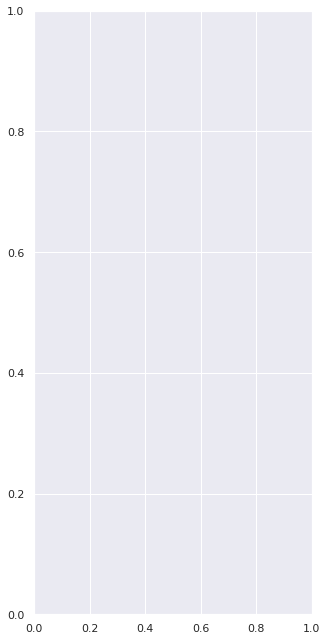

maximum average density: 3.0878252314673413 , min_area: 1
maximum fscore: 0.7987 , min_area: 2


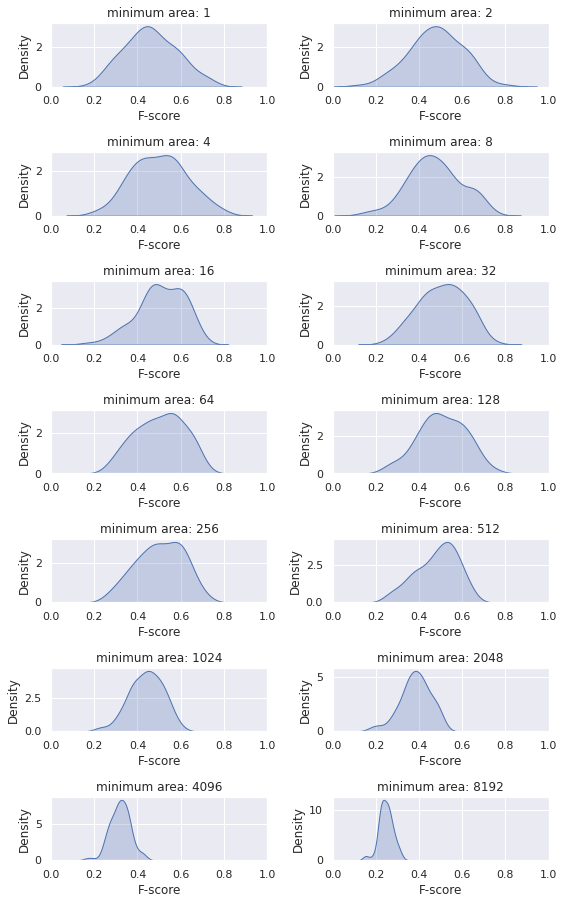

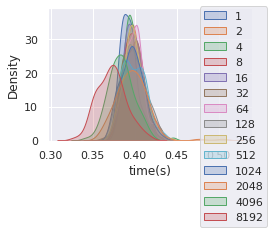

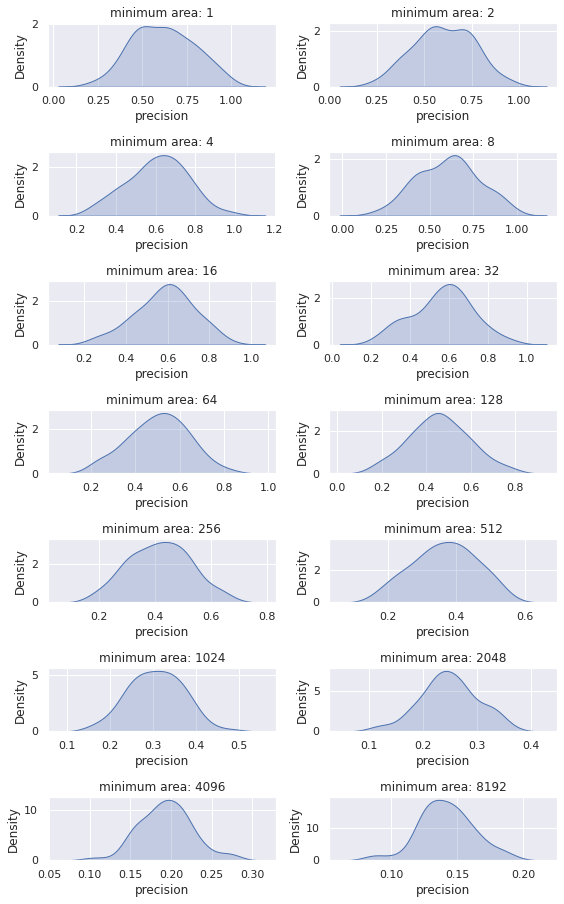

Time taken:      563.341s


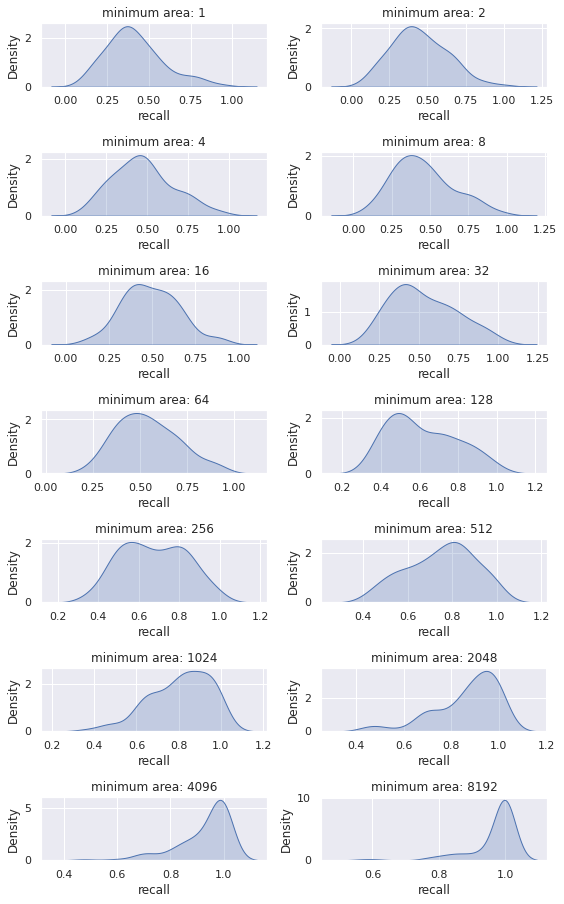

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    db_max_dens = 0
    max_fscore = 0
    db_max_fscore = 0

    fpr_list = []
    time_list = []
            
    rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    points = taxi_list + rect_list

    for ma in min_area_list:
        fpr_for_each_area = []
        time_for_each_area = []
        for _ in range(100):
            import time as tm
            start = tm.time()
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # ax.axis('off')
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, 60, 6, 1, min_area=ma)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = np.array(points_in_rect(k_rects, points))
            else:
                points_in_rects = []
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_area.append(np.array([f_score, precision, recall]))
            if len(k_rects)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                db_max_dens  = ma
            if f_score > max_fscore: 
                max_fscore = f_score
                db_max_fscore = ma
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=1)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start
            time_for_each_area.append(cost_time)
            # title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            # title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            # title_6 = 'taxi points: ' + str(n_taxi_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax.set_title(title)           
            # # ax.set_xlabel(xlabel)
            # ax.set_xticks([])
            # ax.set_yticks([])
            bg = None
        fpr_list.append(np.array(fpr_for_each_area))
        time_list.append(np.array(time_for_each_area))

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', db_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', db_max_fscore )

    fpr_list = np.array(fpr_list)
    return fpr_list, time_list
    
if __name__ == "__main__":

    min_area = 4
    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    pow_list = np.arange(0,14)
    min_area_list = 2**pow_list

    import time 
    start = time.time()
    fpr_list, time_list = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, min_area_list)
    # fig = plt.figure(figsize=(15,8))
    # ax = fig.add_subplot(2,2,1)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,0],shade=True)
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,2)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,3)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,1],shade=True)
    # ax.set_xlabel('precision')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,4)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,2],shade=True)
    # ax.set_xlabel('recall')
    # ax.set_ylabel('Density')
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(min_area_list)//2+1, 2, 1
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(time_list[i],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i]) 
    #     ax.set_title(title_i)
    #     ax.set_xlabel('time(s)')
    #     ax.set_ylabel('Density')
    fig = plt.figure(figsize=(4,3))
    for i,ma in enumerate(min_area_list):
        sns.kdeplot(time_list[i],shade=True, label=ma)
    plt.xlabel('time(s)')
    plt.ylabel('Density')
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

KeyboardInterrupt: ignored

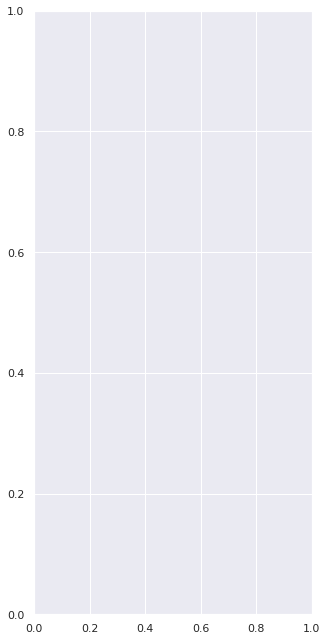

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(rctgs_origin, n, a, rctgs_extra, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    db_max_dens = 0
    max_fscore = 0
    db_max_fscore = 0

    fpr_list = []
    time_list = []
            
    # rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    
    rect_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    rect_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = rect_origin + rect_extra

    for ma in min_area_list:
        fpr_for_each_area = []
        time_for_each_area = []
        for _ in range(100):
            import time as tm
            start = tm.time()
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # ax.axis('off')
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.5, min_area=ma)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = np.array(points_in_rect(k_rects, points))
            else:
                points_in_rects = []
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_area.append(np.array([f_score, precision, recall]))
            if len(k_rects)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                db_max_dens  = ma
            if f_score > max_fscore: 
                max_fscore = f_score
                db_max_fscore = ma
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=1)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start
            time_for_each_area.append(cost_time)
            # title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            # title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            # title_6 = 'taxi points: ' + str(n_taxi_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax.set_title(title)           
            # # ax.set_xlabel(xlabel)
            # ax.set_xticks([])
            # ax.set_yticks([])
            bg = None
        fpr_list.append(np.array(fpr_for_each_area))
        time_list.append(np.array(time_for_each_area))

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', db_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', db_max_fscore )

    fpr_list = np.array(fpr_list)
    return fpr_list, time_list
    
if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    # pow_list = np.arange(0,5)
    # min_area_list = 2**pow_list
    # # min_area_list = np.insert(min_area_list, 0, 0)
    # print(min_area_list)

    min_area_list = np.arange(0,16)

    import time 
    start = time.time()
    fpr_list, time_list = plot_clusters_taxi_many(rctgs_origin, list_n, list_a, rctgs_extra, datetime, lasting_hours, min_area_list)
    # fig = plt.figure(figsize=(15,8))
    # ax = fig.add_subplot(2,2,1)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,0],shade=True)
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,2)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,3)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,1],shade=True)
    # ax.set_xlabel('precision')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,4)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,2],shade=True)
    # ax.set_xlabel('recall')
    # ax.set_ylabel('Density')
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(min_area_list)//2+1, 2, 1
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(time_list[i],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i]) 
    #     ax.set_title(title_i)
    #     ax.set_xlabel('time(s)')
    #     ax.set_ylabel('Density')
    fig = plt.figure(figsize=(4,3))
    for i, ma in enumerate(min_area_list):
        sns.kdeplot(time_list[i],shade=True, label=ma)
    plt.xlabel('time(s)')
    plt.ylabel('Density')
    plt.xlim([0,0.15])
    plt.legend()
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

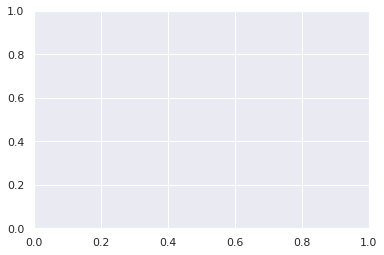

maximum average density: 154.66361532116608 , min_area: 2300
maximum fscore: 0.9261 , min_area: 2300


IndexError: ignored

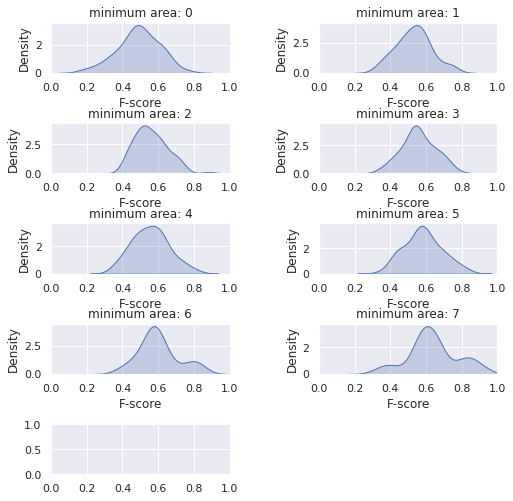

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(rctgs_origin, n, a, rctgs_extra, datetime, interval, z_list, k=3):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    z_max_dens = 0
    max_fscore = 0
    z_max_fscore = 0

    fpr_list = []
    time_list = []
            
    # rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    
    rect_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    rect_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = rect_origin + rect_extra

    for z in z_list:
        fpr_for_each_z = []
        time_for_each_z = []
        for _ in range(100):
            import time as tm
            start = tm.time()
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # ax.axis('off')
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, z*k, k, 0.5, min_area=2)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = np.array(points_in_rect(k_rects, points))
            else:
                points_in_rects = []
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_z.append(np.array([f_score, precision, recall]))
            if len(k_rects)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                z_max_dens  = z
            if f_score > max_fscore: 
                max_fscore = f_score
                z_max_fscore = z
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=1)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start
            time_for_each_z.append(cost_time)
            # title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            # title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            # title_6 = 'taxi points: ' + str(n_taxi_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax.set_title(title)           
            # # ax.set_xlabel(xlabel)
            # ax.set_xticks([])
            # ax.set_yticks([])
            bg = None
        fpr_list.append(np.array(fpr_for_each_z))
        time_list.append(np.array(time_for_each_z))

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', z_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', z_max_fscore )

    fpr_list = np.array(fpr_list)
    return fpr_list, time_list
    
if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    # pow_list = np.arange(0,5)
    # min_area_list = 2**pow_list
    # # min_area_list = np.insert(min_area_list, 0, 0)
    # print(min_area_list)

    z_list = np.array([1,2,5,10,20,50,100])
    k = 3
    z_list = k*z_list
    z_list = np.insert(z_list, len(z_list), sum(list_n))

    import time 
    start = time.time()
    fpr_list, time_list = plot_clusters_taxi_many(rctgs_origin, list_n, list_a, rctgs_extra, datetime, lasting_hours, z_list)
    # fig = plt.figure(figsize=(15,8))
    # ax = fig.add_subplot(2,2,1)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,0],shade=True)
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,2)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,3)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,1],shade=True)
    # ax.set_xlabel('precision')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,4)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,2],shade=True)
    # ax.set_xlabel('recall')
    # ax.set_ylabel('Density')
    fig = plt.figure(figsize=(8,len(z_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(z_list)//2+1, 2, 1
    for i in range(len(z_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(z_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(time_list[i],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i]) 
    #     ax.set_title(title_i)
    #     ax.set_xlabel('time(s)')
    #     ax.set_ylabel('Density')
    fig = plt.figure(figsize=(4,3))
    for i, ma in enumerate(z_list):
        sns.kdeplot(time_list[i],shade=True, label=ma)
    plt.xlabel('time(s)')
    plt.ylabel('Density')
    plt.xlim([0,0.15])
    plt.legend()
    plt.show()
    fig = plt.figure(figsize=(8,len(z_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(z_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(z_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(z_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(z_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(z_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

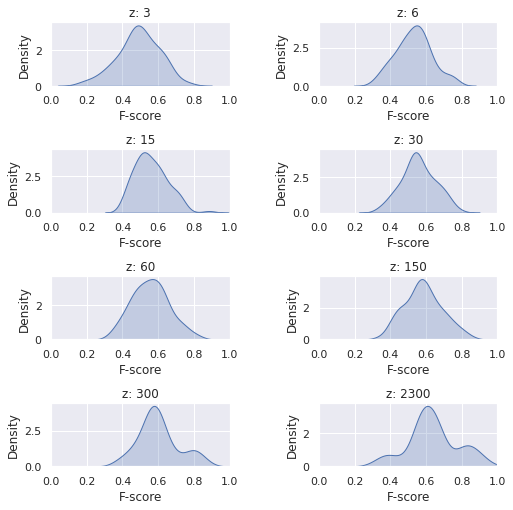

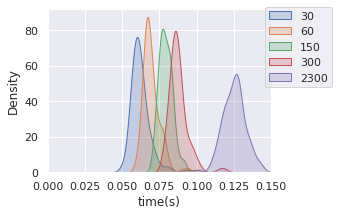

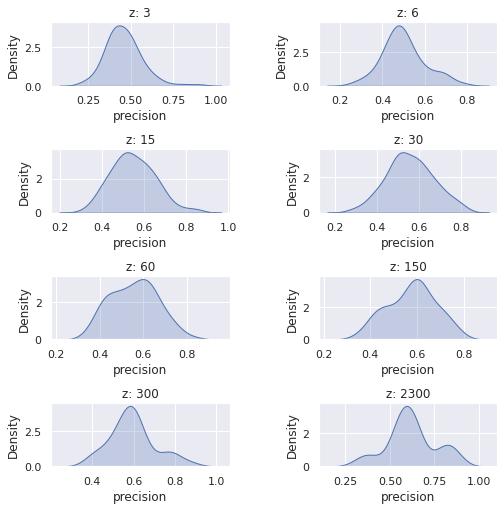

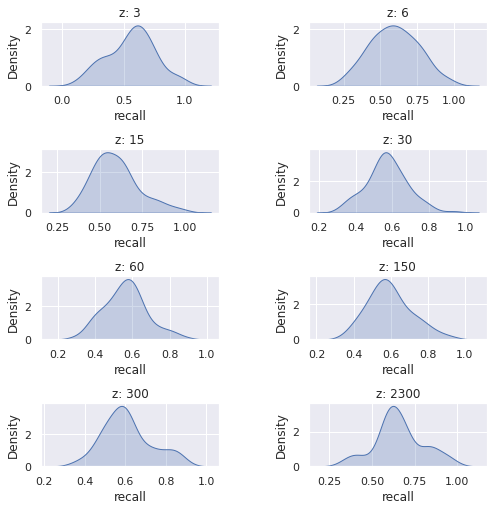

In [ ]:
fig = plt.figure(figsize=(8,len(z_list)+2.5))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
row, columns, order = len(z_list)//2+1, 2, 1
for i in range(len(z_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_list[i,:,0],shade=True)
    title_i = 'z: ' + str(z_list[i])
    ax.set_title(title_i)
    ax.set_xlim(0,1)
    ax.set_xlabel('F-score')
    ax.set_ylabel('Density')
plt.show()
fig = plt.figure(figsize=(4,3))
for i, ma in enumerate(z_list[3:]):
    sns.kdeplot(time_list[i],shade=True, label=ma)
plt.xlabel('time(s)')
plt.ylabel('Density')
plt.xlim([0,0.15])
plt.legend(bbox_to_anchor=(1.3, 1.05))
plt.show()
fig = plt.figure(figsize=(8,len(z_list)+2.5))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
for i in range(len(z_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_list[i,:,1],shade=True)
    title_i = 'z: ' + str(z_list[i])  
    ax.set_title(title_i)
    ax.set_xlabel('precision')
    ax.set_ylabel('Density')
plt.show()
fig = plt.figure(figsize=(8,len(z_list)+2.5))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
for i in range(len(z_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_list[i,:,2],shade=True)
    title_i = 'z: ' + str(z_list[i])  
    ax.set_title(title_i)
    ax.set_xlabel('recall')
    ax.set_ylabel('Density')

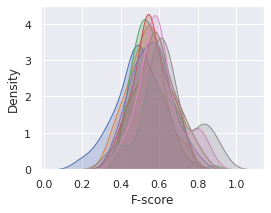

In [ ]:
fig = plt.figure(figsize=(4,3))
# fig.tight_layout()
# plt.subplots_adjust(wspace=0.5,hspace=1)
row, columns, order = len(z_list)//2+1, 2, 1
for i,z in enumerate(z_list):
    sns.kdeplot(fpr_list[i,:,0],shade=True, label=z)
# plt.xlim(0,1)
plt.xlabel('F-score')
plt.ylabel('Density')
plt.show()

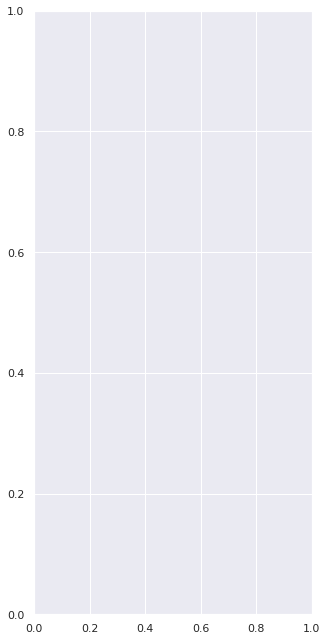

maximum average density: 183.8328966858323 , min_area: 0.8
maximum fscore: 0.8473 , min_area: 0.8


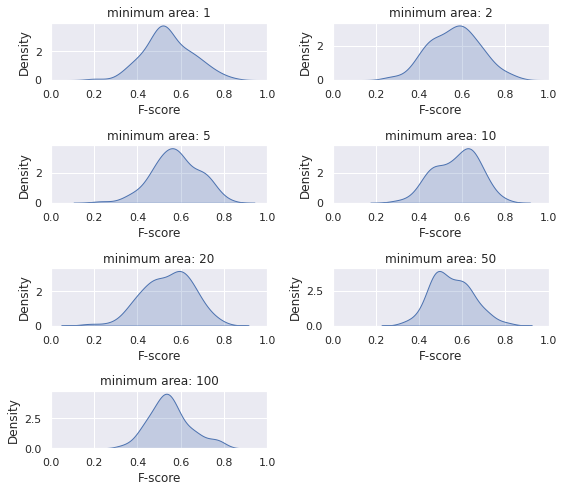

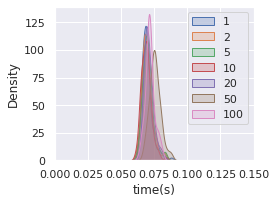

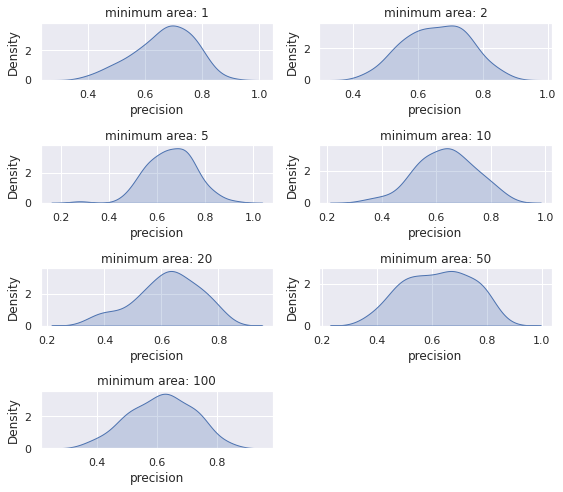

Time taken:      83.286s


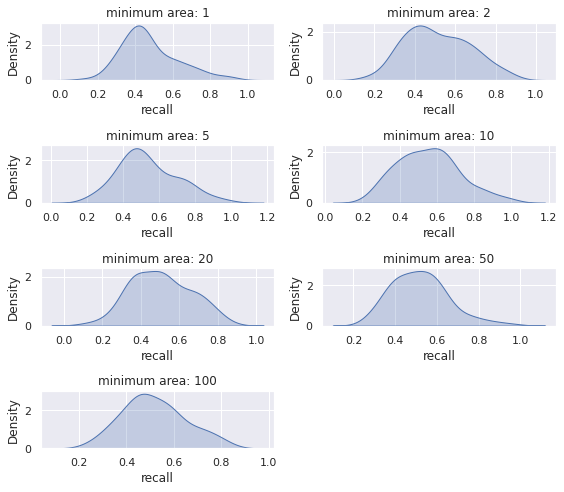

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(rctgs_origin, n, a, rctgs_extra, datetime, interval, beta_list, k=3):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(15, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    z_max_dens = 0
    max_fscore = 0
    z_max_fscore = 0

    fpr_list = []
    time_list = []
            
    # rect_list = rectangle_set_list(n, a, rctgs, datetime, interval)
    
    rect_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    rect_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = rect_origin + rect_extra

    for b in beta_list:
        fpr_for_each_b = []
        time_for_each_b = []
        for _ in range(100):
            import time as tm
            start = tm.time()
            
            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # ax.axis('off')
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, z*k, k, b, min_area=1)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = np.array(points_in_rect(k_rects, points))
            else:
                points_in_rects = []
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)
            fpr_for_each_b.append(np.array([f_score, precision, recall]))
            if len(k_rects)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                b_max_dens  = b
            if f_score > max_fscore: 
                max_fscore = f_score
                b_max_fscore = b
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=1)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)
            
            end = tm.time()
            cost_time = end - start
            time_for_each_b.append(cost_time)
            # title_1 = 'minimum area: ' + str(round(ma,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            # title_5 = 'original rect points: ' + str(n_rect_points) + '\n'
            # title_6 = 'taxi points: ' + str(n_taxi_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax.set_title(title)           
            # # ax.set_xlabel(xlabel)
            # ax.set_xticks([])
            # ax.set_yticks([])
            bg = None
        fpr_list.append(np.array(fpr_for_each_b))
        time_list.append(np.array(time_for_each_b))

    plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', b_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', b_max_fscore )

    fpr_list = np.array(fpr_list)
    return fpr_list, time_list
    
if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    # pow_list = np.arange(0,5)
    # min_area_list = 2**pow_list
    # # min_area_list = np.insert(min_area_list, 0, 0)
    # print(min_area_list)

    z_list = np.array([1,2,5,10,20,50,100])
    k = 3
    beta_list = np.arange(0,1.1,0.1)

    import time 
    start = time.time()
    fpr_list, time_list = plot_clusters_taxi_many(rctgs_origin, list_n, list_a, rctgs_extra, datetime, lasting_hours, beta_list)
    # fig = plt.figure(figsize=(15,8))
    # ax = fig.add_subplot(2,2,1)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,0],shade=True)
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,2)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(time_list[i],shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,3)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,1],shade=True)
    # ax.set_xlabel('precision')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(2,2,4)
    # for i in range(len(min_area_list)):
    #     sns.kdeplot(fpr_list[i,:,2],shade=True)
    # ax.set_xlabel('recall')
    # ax.set_ylabel('Density')
    fig = plt.figure(figsize=(8,len(z_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(z_list)//2+1, 2, 1
    for i in range(len(z_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(z_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    # fig = plt.figure(figsize=(8,len(min_area_list)))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.5,hspace=1)
    # for i in range(len(min_area_list)):
    #     ax = fig.add_subplot(row,columns,order+i)
    #     sns.kdeplot(time_list[i],shade=True)
    #     title_i = 'minimum area: ' + str(min_area_list[i]) 
    #     ax.set_title(title_i)
    #     ax.set_xlabel('time(s)')
    #     ax.set_ylabel('Density')
    fig = plt.figure(figsize=(4,3))
    for i, b in enumerate(beta_list):
        sns.kdeplot(time_list[i],shade=True, label=b)
    plt.xlabel('time(s)')
    plt.ylabel('Density')
    plt.xlim([0,0.15])
    plt.legend()
    plt.show()
    fig = plt.figure(figsize=(8,len(z_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(z_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(z_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(z_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(z_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_list[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(z_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

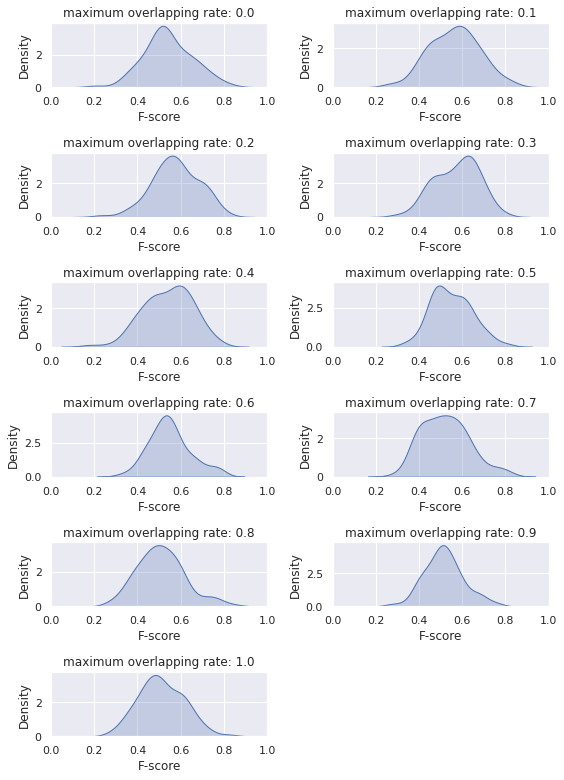

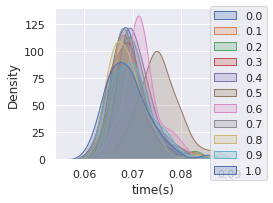

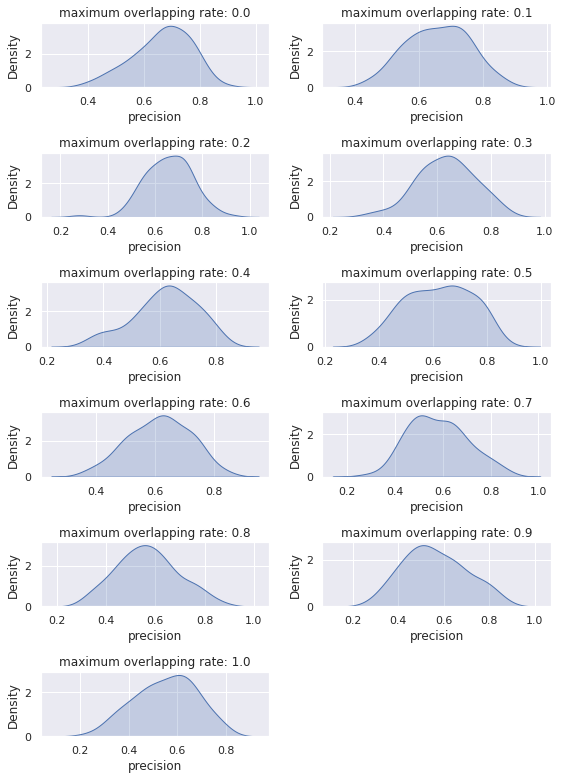

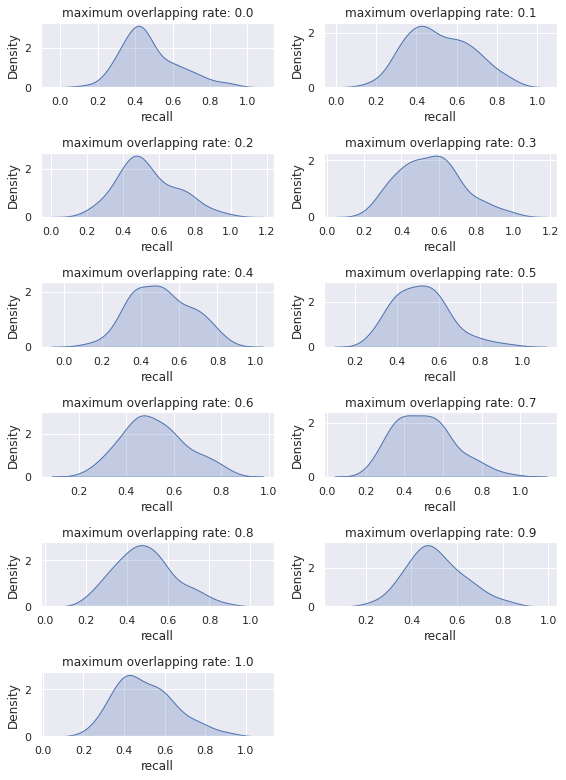

In [ ]:
fig = plt.figure(figsize=(8,len(beta_list)))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
row, columns, order = len(beta_list)//2+1, 2, 1
for i in range(len(beta_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_list[i,:,0],shade=True)
    title_i = 'maximum overlapping rate: ' + str(round(beta_list[i], 1))
    ax.set_title(title_i)
    ax.set_xlim(0,1)
    ax.set_xlabel('F-score')
    ax.set_ylabel('Density')
plt.show()
fig = plt.figure(figsize=(4,3))
for i, b in enumerate(beta_list):
    b = round(b,1)
    sns.kdeplot(time_list[i],shade=True, label=b)
plt.xlabel('time(s)')
plt.ylabel('Density')
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()
fig = plt.figure(figsize=(8,len(beta_list)))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
for i in range(len(beta_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_list[i,:,1],shade=True)
    title_i = 'maximum overlapping rate: ' + str(round(beta_list[i], 1))
    ax.set_title(title_i)
    ax.set_xlabel('precision')
    ax.set_ylabel('Density')
plt.show()
fig = plt.figure(figsize=(8,len(beta_list)))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
for i in range(len(beta_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_list[i,:,2],shade=True)
    title_i = 'maximum overlapping rate: ' + str(round(beta_list[i], 1))
    ax.set_title(title_i)
    ax.set_xlabel('recall')
    ax.set_ylabel('Density')

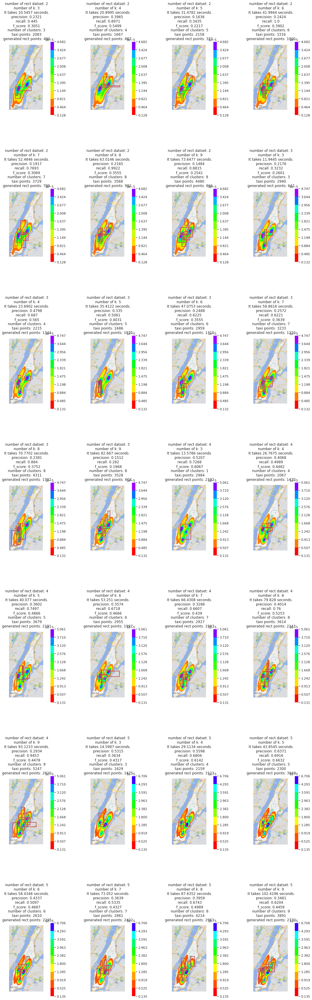

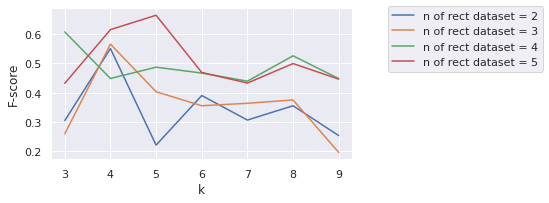

Time taken:      361.146s


In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs_list, datetime, interval, k_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(20, 60))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(k_list)  # number of rows
    column = len(rctgs_list)  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    taxi_list = generate_taxi(data_onehour)
    list_a = [[1/i]*i for i in range(2,6)]

    # same row, same dataset, different k
    f_score_list = []

    for i in range(len(rctgs_list)):
        rctgs = rctgs_list[i]
        import time as tm
        start = tm.time()
        
        rect_list = rectangle_set_list(n[i], list_a[i], rctgs, datetime, interval)
        points = taxi_list + rect_list
        
        label = [p.cluster_label for p in points]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print(len(np.unique(label)), 'labels:', np.unique(label))
        # print('the first 5 labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        fscore_k_for_each_set = []

        for k in k_list:
            ax = fig.add_subplot(row, column, order+cnt)
            cnt += 1
            ax.axis('off')
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            
            k_rects, k_density = disjoint_dense_rectangle_pq(points, 5*k, k, 0.5, 2048)
            currentAxis = plt.gca()
            if len(k_rects)>0:
                points_in_rects = points_in_rect(k_rects, points)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
                f_score, precision, recall = round(f_score, 4), round(precision, 4), round(recall, 4)
                fscore_k_for_each_set.append(f_score)
                if len(k_rects)>0: average_density = np.mean(k_density)
                else: average_density = 0
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            else:
                points_in_rects = []
                n_rect_points = 0
                n_taxi_points = 0
                f_score = 0
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
            


            # ax.scatter(X[:,0], X[:,1], s=2, c='gray')
            # ax.plot(X[:,0], X[:,1], 'g.', markersize=1)

            if len(points_in_rects)>0:
                x, y = X[:, 0], X[:, 1]
                # ax.plot(x, y, 'r.', markersize=1)
                from pandas import DataFrame
                pos = []
                for i in range(len(x)):
                    pos.append([x[i], y[i]])
                df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
                contour = sns.kdeplot(data=df_predicted,x='pos_x',y='pos_y',fill=True,cmap="gist_rainbow",cbar=True,thresh=0.05)
                contour.collections[0].set_alpha(0)

            end = tm.time()
            cost_time = end - start

            title_1 = 'number of rect datset: ' + str(len(rctgs)) + '\n'
            title_1_2 = 'number of k: ' + str(k) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3_2 = 'precision: ' + str(precision) + '\n'
            title_3_3 = 'recall: ' + str(recall) + '\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
            title_5 = 'taxi points: ' + str(n_taxi_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_rect_points)
            title = title_1 + title_1_2 + title_2 + title_3_2 + title_3_3 + title_3 + title_4 + title_5 + title_6
            ax.set_title(title)           
            # ax.set_xlabel(xlabel)
            ax.set_xticks([])
            ax.set_yticks([])
            bg = None
        f_score_list.append(np.array(fscore_k_for_each_set))
    plt.show()
    # print('maximum average density:', max_avg_dens, ', db:', db_max_dens)
    # print('maximum fscore:', max_fscore, ', db:', db_max_fscore )

    plt.figure(figsize=(8,3))
    number_of_rect = list(range(2,6))
    for i,nr in enumerate(number_of_rect):
        label = 'n of rect dataset = ' + str(nr)
        plt.plot(k_list, f_score_list[i], label=label)
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.xlabel('k')
    plt.ylabel('F-score')
    plt.show()
    
if __name__ == "__main__":

    min_area = 4
    n = [1000, 2000, 3000, 4000]
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs_2 = [rect_1, rect_2]

    rect_3 = Rectangle(150, 755, 30, 30)
    rctgs_3 = [rect_1, rect_2, rect_3]

    rect_4 = Rectangle(200, 650, 40, 40)
    rctgs_4 = [rect_1, rect_2, rect_3, rect_4]

    rect_5 = Rectangle(210, 630, 30, 30)
    rctgs_5 = [rect_1, rect_2, rect_3, rect_4, rect_5]

    rctgs_list = [rctgs_2, rctgs_3, rctgs_4, rctgs_5]
    k_list = list(range(3,10))

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, n, a, rctgs_list, datetime, lasting_hours, k_list)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

# k-means functions

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(points, centroids, rctgs_extra, local_search_=False):
        # Plot init seeds along side sample data=
        colors = ['#4EACC5', '#FF9C34', '#4E9A06', 'm', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
        colors = colors[:len(centroids)]
        plt.figure(1)
        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        centroids = [np.array(centroids[i].coords) for i in range(len(centroids))]
        centroids = np.array(centroids)
        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            plt.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)

        plt.scatter(centroids[:,0], centroids[:,1], c='b', s=50)
        currentAxis = plt.gca()
        for r in rctgs_extra:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if local_search_:
            plt.title("K-Means++ clustering with local search")
        else:
            plt.title("K-Means++ cluserting without local search")
        plt.xticks([])
        plt.yticks([])
        plt.show()

def run(input, list_a, datetime, interval, eps, list_n, rctgs_origin, rctgs_extra, n_components=2, noise=0.01, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    
    # read input from file
    if input=='file':
        try:
            with open(path_in, "r") as f:
                input_obj = Dataset.read_input(f)
        except IOError:
            print("Could not read input file: " + path_in, file=sys.stderr)
            return       
    else:
        # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
        bg_origin = rectangle_set(list_n[0], list_a[0], rctgs_origin, datetime, interval, eps)
        bg_extra = rectangle_set(list_n[1], list_a[1], rctgs_extra, datetime, interval, eps)
        points = []
        points.extend(bg_origin.points)
        points.extend(bg_extra.points)
        # input_obj = rectangle_set(n_data, a, rctgs, datetime, interval, eps)
        # points = input_obj.points

    # find the best centroids using k_means++ (w\ or w\o local search)
    centroids = cluster(points, n_components)
    # centroids = clustering(input_obj, centroids, local_search_=local_search_)

    # simple check if the correct number of centroids has been given
    # assert len(centroids) == input_obj.k

    # print result to file
    if input=='file':
        try:
            input_obj.write_output(centroids, path_out, assignment_nr)
        except IOError:
            print("Could not write output to file: " + path_out, file=sys.stderr)
    else:
        plot_clusters(points, centroids, rctgs_extra, local_search_=local_search_)
       

    # print("Cluster counter:      ", input_obj.k, file=sys.stderr)
    def avg_score(points, centroids):
        return f_score(points, centroids) / len(points)
    average_score = avg_score(points, centroids)
    print("Mean squared distance: {:.3f}".format(average_score), file=sys.stderr)  

# k-means experiments

In [ ]:
if __name__ == "__main__":
    import time
    start = time.time()
    r_n = Rectangle(2,6,2,2)
    r_p = Rectangle(5,3,2,2)
    r_q = Rectangle(8,7,2,2)
    r_d = Rectangle(5,5,10,10)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(5,3,1,1)
    r_12 = Rectangle(8,8,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    k = 3
    a = [0.3,0.3,0.3]

    list_n = [1000, 500]

    epsilon, min_pts = 3, 200

    # datetime = '2015-03-15 07:00:00'
    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12
    n, k = 1000, 2
    eps = 45
    disjoint_bound = [1/3, 1/2, 0]
    # alpha = [[0.1, 0.1, 0.1], [0.2, 0.2, 0.2], [0.3, 0.3, 0.3]]
    list_a = [[0.3, 0.3, 0.3], [1/3, 1/2, 1/3]]
    # alpha = [[0.1, 0.1], [0.2, 0.2], [0.3, 0.3], [0.4, 0.4]]
    # run('rctg', [r_a, r_b, r_d], alpha, n, k)
    run('rctg', list_a, datetime, lasting_hours, eps, list_n, rctgs_origin, rctgs_extra, n_components=3, noise=0.01, local_search_=False)
    # rect_compare(rctgs, n, k, alpha, disjoint_bound)
    import time
    end = time.time()
    print("Time taken:            {:.3f}s".format(end - start), file=sys.stderr)  

# comparision

w\o local search iterationcount: 11


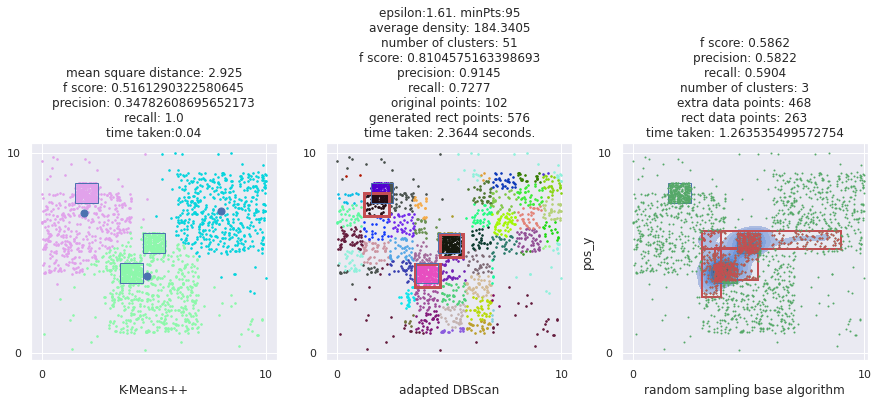

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    label = np.array([p.cluster_label for p in points])
    # print('labels:', np.unique(label))
    # print('length of centroids:', len(centroids))
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        # print('label of p', p.cluster_label, 'length of centroids:', len(centroids))
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(points, centroids, rctgs_extra, local_search_=False):
# def compare_time(input, noise, n_samples, n_components, avg_factor, disjoint_bound):
    '''
        input: list - the name of the datasets
        noise: list - float, the noise of the generated set
        n_samples: list - the number of the points generated
        n_components: int - the number of the clusters
        avg_factor: list of float - the factor for avg_Z
    '''

    #  plot Numerical Data
    row = 1  # number of rows
    columns = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0


    # c, k = 5*n_components, 2*n_components

    fig = plt.figure(figsize=(15, 4))
    # fig.suptitle('comparison of time cost of various points')

################### k means++ ###################
    import time
    start = time.time()
    # centroids = cluster(points)
    # centroids = clustering(input_obj, centroids, local_search_)
    X = np.array([points[idx].coords for idx in range(len(points))])
    centroids_np = np.array([np.array(centroids[idx].coords) for idx in range(len(centroids))])
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    ax = fig.add_subplot(row, columns, order+cnt)
    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    for idx, col in enumerate(colors):
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)

    ax.scatter(centroids_np[:,0], centroids_np[:,1], c='b', s=50)

    n_extra = n_origin = 0
    n_points = len(points)
    for i,p in enumerate(points):
        if p.type_point=='extra':
            n_extra += 1
        elif p.type_point == 'Rect':
            n_origin += 1
    precision = n_extra / n_points
    recall = 1.0
    fscore = 2* (precision*recall) / (precision+recall)
    currentAxis = plt.gca()

    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
    
    
    end = time.time()
    cost_time = end-start
    str_dist = 'mean square distance: '+str(round(f_score(points,centroids)/len(points),3))+'\n'
    str_fscore = 'f score: ' + str(fscore) + '\n'
    str_precision = 'precision: ' + str(precision) + '\n'
    str_recall = 'recall: ' + str(recall) + '\n'
    str_duration = 'time taken:'+str(round(cost_time,3))
    title = str_dist+str_fscore+str_precision+str_recall+str_duration
    ax.set_xlabel("K-Means++")
    ax.set_title(title)
    # ax.set_ylabel(ns)
    ax.set_xticks([0,10])
    ax.set_yticks([0,10])

    cnt += 1



###################  plot dbscan boxgraph  ###################Z
    start = time.time()
    epsilon, min_pts = 1.61, 95
    bg = BoxGraph(len(points), 2, epsilon, min_pts, points)
    find_core_points(bg)
    nr_clusters = compute_cluster_cores(bg)
    assign_border_points(bg)

    label = [bg.points[i].cluster_label for i in range(len(bg.points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(bg.points[i].coords) for i in range(len(bg.points))]
    X = np.array(X)
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    ax = fig.add_subplot(row, columns, order+cnt)
    cnt += 1

    for idx, col in enumerate(colors):
        # print(idx, col)
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)
    
    currentAxis = plt.gca()
    # big_rect = rctgs[-1]
    cluster_rect = []
    unique_label = np.unique(label)
    # unique_label = unique_label[unique_label != -1]
    # for idx, lbl in enumerate(np.unique(label),1):
    for idx in range(1,len(unique_label)+1):
        cluster_data = label == idx
        if np.any(cluster_data):
            left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
            bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            # print(left, right, top,bottom)
            # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
            cluster_rect.append(temp_rect)
    
    # print('number of clusters:', len(cluster_rect))
    if len(cluster_rect)>0:
        k_rects, k_density = dense_rectangle(bg.points, cluster_rect, k=3, min_area=1)
        points_in_rects = np.array(points_in_rect(k_rects, bg.points))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'Rect')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'extra')
        fscore, pcs, rcl = f_score_points_in_rect(rctgs_extra, k_rects, bg.points)
        fsocre, pcs, rcl = round(fscore, 4), round(pcs, 4), round(rcl, 4)
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    end = time.time()
    cost_time = end-start
    title_1 = 'epsilon:' + str(epsilon) + '. minPts:' + str(min_pts) + '\n'
    # ax.set_title(title)
    xlabel_1 = 'time taken: ' + str(round(cost_time, 4)) + ' seconds.'
    xlabel_2 = 'average density: ' + str(round(np.mean(k_density), 4))+'\n'
    xlabel_3 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    title_3 = 'f score: ' + str(fscore) + '\n'
    title_3_2 = 'precision: ' + str(pcs) + '\n'
    title_3_3 = 'recall: ' + str(rcl) + '\n'
    title_5 = 'original points: ' + str(n_rect_points) + '\n'
    title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
    title = title_1 + xlabel_2 + xlabel_3 + title_3 + title_3_2 + title_3_3 + title_5 + title_6 + xlabel_1
    ax.set_title(title)
    ax.set_xlabel('adapted DBScan')
    ax.set_xticks([0,10])
    ax.set_yticks([0,10])

    


################### plot sample algorithm ###################
    start = time.time()
    df_not_prob = points
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)
    
    ax = fig.add_subplot(row, columns, order+cnt)
    cnt += 1
    # ax.imshow(im, cmap='gray')
    # implot = plt.imshow(im)
    # ax.axis('off')

    # dots = ax.scatter(X[:, 0], X[:, 1],
    #                 marker='.', s=10)
    # ax.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

    k_rects, average_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.3)
    if len(k_rects)>0:
        points_in_rects = np.array(points_in_rect(k_rects, points))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
        fscore, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
        fscore, precision, recall = round(fscore, 4), round(precision,4), round(recall,4)
    else:
        points_in_rects = []
        n_rect_points = 0
        n_extra_points = 0
        fscore = 0

    # ax.scatter(X[:,0], X[:,1], s=2, c='green')

    for r in k_rects:
        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
    for r in rctgs_extra:
        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    if len(points_in_rects)>0:
        x, y = points_in_rects[:, 0], points_in_rects[:, 1]
        ax.plot(X[:,0], X[:,1], 'g.', markersize=2)
        ax.plot(x, y, 'r.', markersize=2)
        from pandas import DataFrame
        pos = []
        for i in range(len(x)):
            pos.append([x[i], y[i]])
        df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
        contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
        contour.collections[0].set_alpha(0)

    end = time.time()
    cost_time = end-start
    title_1 = 'time taken: ' + str(cost_time)
    title_3 = 'f score: ' + str(fscore) + '\n'
    title_3_2 = 'precision: ' + str(precision) + '\n'
    title_3_3 = 'recall: ' + str(recall) + '\n'
    title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
    title_5 = 'extra data points: ' + str(n_extra_points) + '\n'
    title_6 = 'rect data points: ' + str(n_rect_points) + '\n'
    title_str = title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6 + title_1
    ax.set_title(title_str)
    ax.set_xlabel('random sampling base algorithm')
    ax.set_xticks([0,10])
    ax.set_yticks([0,10])
    # update_start_time += dt.timedelta(minutes=interval)

    plt.show()

def run_kmeans(list_a, datetime, interval, list_n, rctgs_origin, rctgs_extra, n_components=3, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    

    # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
    bg_origin = rectangle_set_list(list_n[0], list_a[0], rctgs_origin, datetime, interval)
    bg_extra = rectangle_set_list(list_n[1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
    points = []
    points.extend(bg_origin)
    points.extend(bg_extra)
    
    # find the best centroids using k_means++ (w\ or w\o local search)
    centroids = cluster(points, n_components)
    # centroids = clustering(input_obj, centroids, local_search_=local_search_)

    # simple check if the correct number of centroids has been given
    # assert len(centroids) == input_obj.k

    plot_clusters(points, centroids, rctgs_extra, local_search_=local_search_)
       

    # print("Cluster counter:      ", input_obj.k, file=sys.stderr)
    # def avg_score(points, centroids):
    #     return f_score(points, centroids) / len(points)
    # average_score = avg_score(points, centroids)
    # print("Mean squared distance: {:.3f}".format(average_score), file=sys.stderr)  

if __name__ == '__main__':
    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    interval = 12

    # eps = 1.61
    run_kmeans(list_a, datetime, interval, list_n, rctgs_origin, rctgs_extra, 3, False)

w\o local search iterationcount: 13
number of k: 3
rect info: 132.3196564832336 590.3676343580006 31.70799115633696 31.817370026108392
rect info: 132.2751579259891 622.0180925742127 31.56286223363614 31.45783691409747
rect info: 228.6957073017327 549.5213943574759 30.109124118975217 31.704581869095477


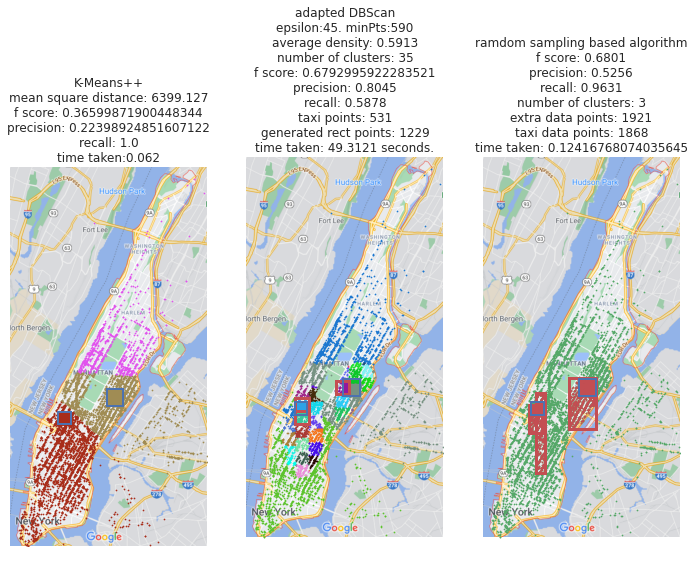

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    label = np.array([p.cluster_label for p in points])
    # print('labels:', np.unique(label))
    # print('length of centroids:', len(centroids))
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        # print('label of p', p.cluster_label, 'length of centroids:', len(centroids))
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(points, centroids, rctgs_extra, local_search_=False):
# def compare_time(input, noise, n_samples, n_components, avg_factor, disjoint_bound):
    '''
        input: list - the name of the datasets
        noise: list - float, the noise of the generated set
        n_samples: list - the number of the points generated
        n_components: int - the number of the clusters
        avg_factor: list of float - the factor for avg_Z
    '''

    #  plot Numerical Data
    row = 1  # number of rows
    columns = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # c, k = 5*n_components, 2*n_components

    fig = plt.figure(figsize=(12, 9))
    # fig.suptitle('comparison of time cost of various points')
    
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

################### k means++ ###################
    import time
    start = time.time()
    # centroids = cluster(points)
    # centroids = clustering(input_obj, centroids, local_search_)
    X = np.array([points[idx].coords for idx in range(len(points))])
    centroids_np = np.array([np.array(centroids[idx].coords) for idx in range(len(centroids))])
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    ax = fig.add_subplot(row, columns, order+cnt)
    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    for idx, col in enumerate(colors):
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=2)

    # ax.scatter(centroids_np[:,0], centroids_np[:,1], c='b', s=50)
    ax.axis('off')
    ax.imshow(im, cmap='gray')
    implot = plt.imshow(im)

    n_extra = n_origin = 0
    n_points = len(points)
    for i,p in enumerate(points):
        if p.type_point=='extra':
            n_extra += 1
        elif p.type_point == 'Rect':
            n_origin += 1
    precision = n_extra / n_points
    recall = 1.0
    fscore = 2* (precision*recall) / (precision+recall)
    currentAxis = plt.gca()

    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=2, edgecolor='b', fill=None))
    
    
    end = time.time()
    cost_time = end-start
    str_dist = "K-Means++" + '\n' + 'mean square distance: '+str(round(f_score(points,centroids)/len(points),3))+'\n'
    str_fscore = 'f score: ' + str(fscore) + '\n'
    str_precision = 'precision: ' + str(precision) + '\n'
    str_recall = 'recall: ' + str(recall) + '\n'
    str_duration = 'time taken:'+str(round(cost_time,3))
    title = str_dist+str_fscore+str_precision+str_recall+str_duration
    ax.set_xlabel("K-Means")
    ax.set_title(title)
    # ax.set_ylabel(ns)

    cnt += 1



###################  plot dbscan boxgraph  ###################Z
    start = time.time()
    epsilon, min_pts = 45, 590
    bg = BoxGraph(len(points), 2, epsilon, min_pts, points)
    find_core_points(bg)
    nr_clusters = compute_cluster_cores(bg)
    assign_border_points(bg)

    label = [bg.points[i].cluster_label for i in range(len(bg.points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(bg.points[i].coords) for i in range(len(bg.points))]
    X = np.array(X)
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    ax = fig.add_subplot(row, columns, order+cnt)
    cnt += 1

    ax.axis('off')
    ax.imshow(im, cmap='gray')
    implot = plt.imshow(im)

    for idx, col in enumerate(colors):
        # print(idx, col)
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=2)
    
    currentAxis = plt.gca()
    # big_rect = rctgs[-1]
    cluster_rect = []
    unique_label = np.unique(label)
    # unique_label = unique_label[unique_label != -1]
    # for idx, lbl in enumerate(np.unique(label),1):
    for idx in range(1,len(unique_label)+1):
        cluster_data = label == idx
        if np.any(cluster_data):
            left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
            bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            # print(left, right, top,bottom)
            # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
            cluster_rect.append(temp_rect)
    
    # print('number of clusters:', len(cluster_rect))
    if len(cluster_rect)>0:
        k_rects, k_density = dense_rectangle(bg.points, cluster_rect, k=3, min_area=2**6)
    else:
        k_rects, k_density = [],[]
    print('number of k:', len(k_rects))
    points_in_rects = np.array(points_in_rect(k_rects, bg.points))
    n_rect_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'taxi')
    n_extra_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'extra')
    fscore, pcs, rcl = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, bg.points)
    fsocre, pcs, rcl = round(fscore, 4), round(pcs, 4), round(rcl, 4)
    for r in k_rects:
        print('rect info:', r.x, r.y, r.width, r.height)
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='b', fill=None))
    
    end = time.time()
    cost_time = end-start
    title_1 = 'adapted DBScan' + '\n' + 'epsilon:' + str(epsilon) + '. minPts:' + str(min_pts) + '\n'
    # ax.set_title(title)
    xlabel_1 = 'time taken: ' + str(round(cost_time, 4)) + ' seconds.'
    xlabel_2 = 'average density: ' + str(round(np.mean(k_density), 4))+'\n'
    xlabel_3 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    title_3 = 'f score: ' + str(fscore) + '\n'
    title_3_2 = 'precision: ' + str(pcs) + '\n'
    title_3_3 = 'recall: ' + str(rcl) + '\n'
    title_5 = 'taxi points: ' + str(n_rect_points) + '\n'
    title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
    title = title_1 + xlabel_2 + xlabel_3 + title_3 + title_3_2 + title_3_3 + title_5 + title_6 + xlabel_1
    ax.set_title(title)
    ax.set_xlabel('adapted DBScan')

    


################### plot sample algorithm ###################
    start = time.time()
    df_not_prob = points
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)
    
    ax = fig.add_subplot(row, columns, order+cnt)
    cnt += 1
    ax.imshow(im, cmap='gray')
    implot = plt.imshow(im)
    ax.axis('off')

    currentAxis = plt.gca()

    # dots = ax.scatter(X[:, 0], X[:, 1],
    #                 marker='.', s=10)
    # ax.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

    k_rects, average_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.5, 1024)
    end = time.time()
    cost_time = end-start
    if len(k_rects)>0:
        points_in_rects = np.array(points_in_rect(k_rects, points))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
        fscore, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
        fscore, precision, recall = round(fscore, 4), round(precision,4), round(recall,4)
    else:
        points_in_rects = []
        n_rect_points = 0
        n_extra_points = 0
        fscore = 0

    # ax.scatter(X[:,0], X[:,1], s=2, c='green')

    for r in k_rects:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='b', fill=None))
    
    if len(points_in_rects)>0:
        x, y = points_in_rects[:, 0], points_in_rects[:, 1]
        ax.scatter(X[:,0], X[:,1], c='g', marker='.', s=2)
        ax.scatter(x, y, c='r', marker='.', s=2)
        # from pandas import DataFrame
        # pos = []
        # for i in range(len(x)):
        #     pos.append([x[i], y[i]])
        # df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
        # contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap='Reds', fill=True)
        # contour.collections[0].set_alpha(0)

    title_1 = 'time taken: ' + str(cost_time)
    title_3 = 'ramdom sampling based algorithm' + '\n' + 'f score: ' + str(fscore) + '\n'
    title_3_2 = 'precision: ' + str(precision) + '\n'
    title_3_3 = 'recall: ' + str(recall) + '\n'
    title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
    title_5 = 'extra data points: ' + str(n_extra_points) + '\n'
    title_6 = 'taxi data points: ' + str(n_rect_points) + '\n'
    title_str = title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6 + title_1
    ax.set_title(title_str)
    # update_start_time += dt.timedelta(minutes=interval)

    plt.show()

def run_kmeans(list_a, datetime, interval, eps, list_n, data_oneday, rctgs_extra, n_components=3, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    

    # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
    taxis = generate_bg_list(data_oneday)
    bg_extra = rectangle_set_list(list_n, list_a, rctgs_extra, datetime, interval, type_point='extra')
    points = []
    points.extend(taxis)
    points.extend(bg_extra)

    # find the best centroids using k_means++ (w\ or w\o local search)
    centroids = cluster(points, n_components)
    # centroids = clustering(input_obj, centroids, local_search_=local_search_)

    # simple check if the correct number of centroids has been given
    # assert len(centroids) == input_obj.k

    plot_clusters(points, centroids, rctgs_extra, local_search_=local_search_)
       

    # print("Cluster counter:      ", input_obj.k, file=sys.stderr)
    # def avg_score(points, centroids):
    #     return f_score(points, centroids) / len(points)
    # average_score = avg_score(points, centroids)
    # print("Mean squared distance: {:.3f}".format(average_score), file=sys.stderr)  

if __name__ == '__main__':
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    a = [0.5, 0.5]

    n = 2000

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    interval = 1

    eps = 45
    run_kmeans(a, datetime, interval, eps, n, data_onehour, rctgs, 3, False)

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    label = np.array([p.cluster_label for p in points])
    # print('labels:', np.unique(label))
    # print('length of centroids:', len(centroids))
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        # print('label of p', p.cluster_label, 'length of centroids:', len(centroids))
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(points, centroids, rctgs_extra, local_search_=False):
# def compare_time(input, noise, n_samples, n_components, avg_factor, disjoint_bound):
    '''
        input: list - the name of the datasets
        noise: list - float, the noise of the generated set
        n_samples: list - the number of the points generated
        n_components: int - the number of the clusters
        avg_factor: list of float - the factor for avg_Z
    '''

    #  plot Numerical Data
    row = 1  # number of rows
    columns = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0


    # c, k = 5*n_components, 2*n_components

    fig = plt.figure(figsize=(15, 6))
    # fig.suptitle('comparison of time cost of various points')

################### k means++ ###################
    import time
    start = time.time()
    # centroids = cluster(points)
    # centroids = clustering(input_obj, centroids, local_search_)
    X = np.array([points[idx].coords for idx in range(len(points))])
    centroids_np = np.array([np.array(centroids[idx].coords) for idx in range(len(centroids))])
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    ax = fig.add_subplot(row, columns, order+cnt)
    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    for idx, col in enumerate(colors):
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)

    ax.scatter(centroids_np[:,0], centroids_np[:,1], c='b', s=50)

    n_extra = n_origin = 0
    n_points = len(points)
    for i,p in enumerate(points):
        if p.type_point=='extra':
            n_extra += 1
        elif p.type_point == 'Rect':
            n_origin += 1
    precision_kmeans = n_extra / n_points
    recall_kmeans = 1.0
    fscore_kmeans = 2* (precision_kmeans*recall_kmeans) / (precision_kmeans+recall_kmeans)
    currentAxis = plt.gca()

    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
    
    
    end = time.time()
    cost_time_kmeans = end-start
    str_dist = 'mean square distance: '+str(round(f_score(points,centroids)/len(points),3))+'\n'
    str_fscore = 'f score: ' + str(fscore_kmeans) + '\n'
    str_precision = 'precision: ' + str(precision_kmeans) + '\n'
    str_recall = 'recall: ' + str(recall_kmeans) + '\n'
    str_duration = 'time taken:'+str(round(cost_time_kmeans,3))
    title = str_dist+str_fscore+str_precision+str_recall+str_duration
    ax.set_xlabel("K-Means")
    ax.set_title(title)
    # ax.set_ylabel(ns)
    ax.set_xticks([0,10])
    ax.set_yticks([0,10])

    cnt += 1



###################  plot dbscan boxgraph  ###################Z
    start = time.time()
    epsilon, min_pts = 1.61, 95
    bg = BoxGraph(len(points), 2, epsilon, min_pts, points)
    find_core_points(bg)
    nr_clusters = compute_cluster_cores(bg)
    assign_border_points(bg)

    label = [bg.points[i].cluster_label for i in range(len(bg.points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(bg.points[i].coords) for i in range(len(bg.points))]
    X = np.array(X)
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    ax = fig.add_subplot(row, columns, order+cnt)
    cnt += 1

    for idx, col in enumerate(colors):
        # print(idx, col)
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)
    
    currentAxis = plt.gca()
    # big_rect = rctgs[-1]
    cluster_rect = []
    unique_label = np.unique(label)
    # unique_label = unique_label[unique_label != -1]
    # for idx, lbl in enumerate(np.unique(label),1):
    for idx in range(1,len(unique_label)+1):
        cluster_data = label == idx
        if np.any(cluster_data):
            left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
            bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            # print(left, right, top,bottom)
            # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
            cluster_rect.append(temp_rect)
    
    # print('number of clusters:', len(cluster_rect))
    if len(cluster_rect)>0:
        k_rects, k_density = dense_rectangle(bg.points, cluster_rect, k=3, min_area=1)
        end = time.time()
        cost_time_dbscan = end-start
        points_in_rects = np.array(points_in_rect(k_rects, bg.points))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'Rect')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'extra')
        fscore_dbscan, pcs_dbscan, rcl_dbscan = f_score_points_in_rect(rctgs_extra, k_rects, bg.points)
        fscore_dbscan, pcs_dbscan, rcl_dbscan = round(fscore_dbscan, 4), round(pcs_dbscan, 4), round(rcl_dbscan, 4)
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    title_1 = 'epsilon:' + str(epsilon) + '. minPts:' + str(min_pts) + '\n'
    # ax.set_title(title)
    xlabel_1 = 'time taken: ' + str(round(cost_time_dbscan, 4)) + ' seconds.'
    xlabel_2 = 'average density: ' + str(round(np.mean(k_density), 4))+'\n'
    xlabel_3 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    title_3 = 'f score: ' + str(fscore_dbscan) + '\n'
    title_3_2 = 'precision: ' + str(pcs_dbscan) + '\n'
    title_3_3 = 'recall: ' + str(rcl_dbscan) + '\n'
    title_5 = 'original points: ' + str(n_rect_points) + '\n'
    title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
    title = title_1 + xlabel_2 + xlabel_3 + title_3 + title_3_2 + title_3_3 + title_5 + title_6 + xlabel_1
    ax.set_title(title)
    ax.set_xlabel('DBScan with box graphs')
    ax.set_xticks([0,10])
    ax.set_yticks([0,10])

    


################### plot sample algorithm ###################
    start = time.time()
    df_not_prob = points
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)
    
    ax = fig.add_subplot(row, columns, order+cnt)
    cnt += 1
    # ax.imshow(im, cmap='gray')
    # implot = plt.imshow(im)
    # ax.axis('off')

    # dots = ax.scatter(X[:, 0], X[:, 1],
    #                 marker='.', s=10)
    # ax.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

    k_rects, average_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.3)
    end = time.time()
    cost_time_rsdc = end-start

    if len(k_rects)>0:
        points_in_rects = np.array(points_in_rect(k_rects, points))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
        fscore_rsdc, precision_rsdc, recall_rsdc = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
        fscore_rsdc, precision_rsdc, recall_rsdc = round(fscore_rsdc, 4), round(precision_rsdc,4), round(recall_rsdc,4)
    else:
        points_in_rects = []
        n_rect_points = 0
        n_extra_points = 0
        fscore_rsdc = 0

    # ax.scatter(X[:,0], X[:,1], s=2, c='green')

    for r in k_rects:
        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
    for r in rctgs_extra:
        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    if len(points_in_rects)>0:
        x, y = points_in_rects[:, 0], points_in_rects[:, 1]
        ax.plot(X[:,0], X[:,1], 'g.', markersize=2)
        ax.plot(x, y, 'r.', markersize=2)
        from pandas import DataFrame
        pos = []
        for i in range(len(x)):
            pos.append([x[i], y[i]])
        df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
        contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
        contour.collections[0].set_alpha(0)

    title_1 = 'time taken: ' + str(cost_time_rsdc)
    title_3 = 'f score: ' + str(fscore_rsdc) + '\n'
    title_3_2 = 'precision: ' + str(precision_rsdc) + '\n'
    title_3_3 = 'recall: ' + str(recall_rsdc) + '\n'
    title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
    title_5 = 'extra data points: ' + str(n_extra_points) + '\n'
    title_6 = 'rect data points: ' + str(n_rect_points) + '\n'
    title_str = title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6 + title_1
    ax.set_title(title_str)
    ax.set_xticks([0,10])
    ax.set_yticks([0,10])
    # update_start_time += dt.timedelta(minutes=interval)

    plt.show()

    fscore = [fscore_kmeans, fscore_dbscan, fscore_rsdc]
    precision = [precision_kmeans, pcs_dbscan, precision_rsdc]
    recall = [recall_kmeans, rcl_dbscan, recall_rsdc]
    cost_time = [cost_time_kmeans, cost_time_dbscan, cost_time_rsdc]

    return fscore, precision, recall, cost_time

def run_kmeans(list_a, datetime, interval, list_n, rctgs_origin, rctgs_extra, n_components=3, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    
    fscore_list = []
    precision_list = []
    recall_list = []
    cost_time_list = []
    for i in range(len(list_n)):
        # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
        bg_origin = rectangle_set_list(list_n[i][0], list_a[0], rctgs_origin, datetime, interval)
        bg_extra = rectangle_set_list(list_n[i][1], list_a[1], rctgs_extra, datetime, interval, type_point='extra')
        points = []
        points.extend(bg_origin)
        points.extend(bg_extra)
        
        # find the best centroids using k_means++ (w\ or w\o local search)
        centroids = cluster(points, n_components)

        fscore, precision, recall, cost_time = plot_clusters(points, centroids, rctgs_extra, local_search_=local_search_)
        fscore_list.append(fscore)
        precision_list.append(precision)
        recall_list.append(recall)
        cost_time_list.append(cost_time)
    return fscore_list,precision_list,recall_list,cost_time_list
    

if __name__ == '__main__':
    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [[100, 40], [500, 100], [1_000, 600], [5_000, 2_000], [10_000, 4_000], [50_000, 9_000], \
              [80_000, 20_000], [100_000, 35_000], [500_000, 70_000], [1_000_000, 100_000]]

    list_n = np.array(list_n)

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    interval = 12

    # eps = 1.61
    fscore_list,precision_list,recall_list,cost_time_list = run_kmeans(list_a, datetime, interval, list_n, rctgs_origin, rctgs_extra, 3, False)
    fscore_list,precision_list,recall_list,cost_time_list = np.array(fscore_list),np.array(precision_list),np.array(recall_list),np.array(cost_time_list)

    fig = plt.figure(figsize=(6,12))
    ax = fig.add_subplot(4,1,1)
    n_list_n = np.sum(list_n, axis=1)
    ax.plot(n_list_n, fscore_list[:,0], 'b', label='k-means++')
    ax.plot(n_list_n, fscore_list[:,1], 'g', label='adapted DBScan')
    ax.plot(n_list_n, fscore_list[:,2], 'r', label='RSB')
    ax.set_xlabel('number of points')
    ax.set_ylabel('F-score')
    ax.legend()
    ax = fig.add_subplot(4,1,2)
    ax.plot(n_list_n, precision_list[:,0], 'b', label='k-means++')
    ax.plot(n_list_n, precision_list[:,1], 'g', label='adapted DBScan')
    ax.plot(n_list_n, precision_list[:,2], 'r', label='RSB')
    ax.set_xlabel('number of points')
    ax.set_ylabel('precision')
    ax.legend()
    ax = fig.add_subplot(4,1,3)
    ax.plot(n_list_n, recall_list[:,0], 'b', label='k-means++')
    ax.plot(n_list_n, recall_list[:,1], 'g', label='adapted DBScan')
    ax.plot(n_list_n, recall_list[:,2], 'r', label='RSB')
    ax.set_xlabel('number of points')
    ax.set_ylabel('recall')
    ax.legend()
    ax = fig.add_subplot(4,1,4)
    ax.plot(n_list_n, cost_time_list[:,0], 'b', label='k-means++')
    ax.plot(n_list_n, cost_time_list[:,1], 'g', label='adapted DBScan')
    ax.plot(n_list_n, cost_time_list[:,2], 'r', label='RSB')
    ax.set_xlabel('number of points')
    ax.set_ylabel('time')
    ax.legend()

Output hidden; open in https://colab.research.google.com to view.

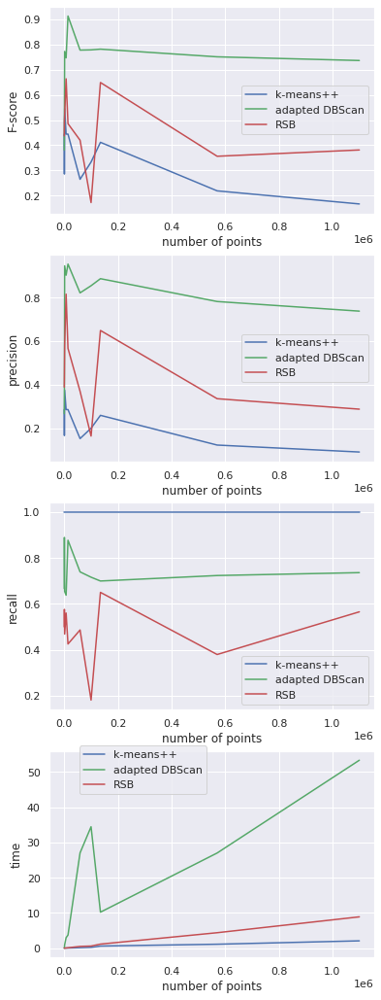

In [ ]:
fig = plt.figure(figsize=(6,18))
ax = fig.add_subplot(4,1,1)
n_list_n = np.sum(list_n, axis=1)
ax.plot(n_list_n, fscore_list[:,0], 'b', label='k-means++')
ax.plot(n_list_n, fscore_list[:,1], 'g', label='adapted DBScan')
ax.plot(n_list_n, fscore_list[:,2], 'r', label='RSB')
ax.set_xlabel('number of points')
ax.set_ylabel('F-score')
ax.legend()
ax = fig.add_subplot(4,1,2)
ax.plot(n_list_n, precision_list[:,0], 'b', label='k-means++')
ax.plot(n_list_n, precision_list[:,1], 'g', label='adapted DBScan')
ax.plot(n_list_n, precision_list[:,2], 'r', label='RSB')
ax.set_xlabel('number of points')
ax.set_ylabel('precision')
ax.legend()
ax = fig.add_subplot(4,1,3)
ax.plot(n_list_n, recall_list[:,0], 'b', label='k-means++')
ax.plot(n_list_n, recall_list[:,1], 'g', label='adapted DBScan')
ax.plot(n_list_n, recall_list[:,2], 'r', label='RSB')
ax.set_xlabel('number of points')
ax.set_ylabel('recall')
ax.legend()
ax = fig.add_subplot(4,1,4)
ax.plot(n_list_n, cost_time_list[:,0], 'b', label='k-means++')
ax.plot(n_list_n, cost_time_list[:,1], 'g', label='adapted DBScan')
ax.plot(n_list_n, cost_time_list[:,2], 'r', label='RSB')
ax.set_xlabel('number of points')
ax.set_ylabel('time')
ax.legend(bbox_to_anchor=(0.5, 1.05))

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    label = np.array([p.cluster_label for p in points])
    # print('labels:', np.unique(label))
    # print('length of centroids:', len(centroids))
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        # print('label of p', p.cluster_label, 'length of centroids:', len(centroids))
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(list_n, list_a, rctgs_origin, rctgs_extra, datetime, interval):
# def compare_time(input, noise, n_samples, n_components, avg_factor, disjoint_bound):
    '''
        input: list - the name of the datasets
        noise: list - float, the noise of the generated set
        n_samples: list - the number of the points generated
        n_components: int - the number of the clusters
        avg_factor: list of float - the factor for avg_Z
    '''

    #  plot Numerical Data
    row = 20  # number of rows
    columns = 5  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # c, k = 5*n_components, 2*n_components

    fig = plt.figure(figsize=(20, 110))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=2.5)
    # fig.suptitle('comparison of time cost of various points')

################### k means++ ###################
    # import time
    # start = time.time()
    # # centroids = cluster(points)
    # # centroids = clustering(input_obj, centroids, local_search_)
    # X = np.array([points[idx].coords for idx in range(len(points))])
    # centroids_np = np.array([np.array(centroids[idx].coords) for idx in range(len(centroids))])
    # label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # ax = fig.add_subplot(row, columns, order+cnt)
    # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    # for idx, col in enumerate(colors):
    #     cluster_data = label == idx
    #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                 c=col, marker='.', s=10)

    # ax.scatter(centroids_np[:,0], centroids_np[:,1], c='b', s=50)

    # n_extra = n_origin = 0
    # n_points = len(points)
    # for i,p in enumerate(points):
    #     if p.type_point=='extra':
    #         n_extra += 1
    #     elif p.type_point == 'Rect':
    #         n_origin += 1
    # precision = n_extra / n_points
    # recall = 1.0
    # fscore = 2* (precision*recall) / (precision+recall)
    # currentAxis = plt.gca()

    # for r in rctgs_extra:
    #     currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
    
    
    # end = time.time()
    # cost_time = end-start
    # str_dist = 'mean square distance: '+str(round(f_score(points,centroids)/len(points),3))+'\n'
    # str_fscore = 'f score: ' + str(fscore) + '\n'
    # str_precision = 'precision: ' + str(precision) + '\n'
    # str_recall = 'recall: ' + str(recall) + '\n'
    # str_duration = 'time taken:'+str(round(cost_time,3))
    # title = str_dist+str_fscore+str_precision+str_recall+str_duration
    # ax.set_xlabel("K-Means")
    # ax.set_title(title)
    # # ax.set_ylabel(ns)
    # ax.set_xticks([0,10])
    # ax.set_yticks([0,10])

    # cnt += 1



###################  plot dbscan boxgraph  ###################
    fscore_dbscan = [] 
    time_cost = []
    for i in range(100):
        import time
        start = time.time()
        epsilon, min_pts = 1.61, 95
        bg_origin = rectangle_set(list_n[0], list_a[0], rctgs_origin, datetime, interval, epsilon, min_pts)
        bg_extra = rectangle_set(list_n[1], list_a[1], rctgs_extra, datetime, interval, epsilon, min_pts, type_point='extra')
        points = []
        points.extend(bg_origin.points)
        points.extend(bg_extra.points)
        bg = BoxGraph(len(points), 2, epsilon, min_pts, points)
        find_core_points(bg)
        nr_clusters = compute_cluster_cores(bg)
        assign_border_points(bg)

        label = [bg.points[i].cluster_label for i in range(len(bg.points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print('labels:', np.unique(label))
        # print('the first 5 labels:', label[:5])
        X = [np.array(bg.points[i].coords) for i in range(len(bg.points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        ax = fig.add_subplot(row, columns, order+i)

        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)
        
        currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        unique_label = np.unique(label)
        # unique_label = unique_label[unique_label != -1]
        # for idx, lbl in enumerate(np.unique(label),1):
        for idx in range(1,len(unique_label)+1):
            cluster_data = label == idx
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                # print(left, right, top,bottom)
                # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                cluster_rect.append(temp_rect)
        
        # print('number of clusters:', len(cluster_rect))
        if len(cluster_rect)>0:
            k_rects, k_density = dense_rectangle(bg.points, cluster_rect, k=3, min_area=1)
            points_in_rects = np.array(points_in_rect(k_rects, bg.points))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'Rect')
            n_extra_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'extra')
            fscore, pcs, rcl = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, bg.points)
            tmp = np.array([fscore, pcs, rcl])
            fscore_dbscan.append(tmp)
            # print('fscore, pcs, rcl:',tmp, fscore_dbscan)
            fsocre, pcs, rcl = round(fscore, 4), round(pcs, 4), round(rcl, 4)
            for r in k_rects:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        for r in rctgs_extra:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
        
        end = time.time()
        cost_time = end-start
        time_cost.append(cost_time)
        title_1 = 'epsilon:' + str(epsilon) + '. minPts:' + str(min_pts) + '\n'
        # ax.set_title(title)
        xlabel_1 = 'time taken: ' + str(round(cost_time, 4)) + ' seconds.'
        xlabel_2 = 'average density: ' + str(round(np.mean(k_density), 4))+'\n'
        xlabel_3 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_3 = 'f score: ' + str(fscore) + '\n'
        title_3_2 = 'precision: ' + str(pcs) + '\n'
        title_3_3 = 'recall: ' + str(rcl) + '\n'
        title_5 = 'original points: ' + str(n_rect_points) + '\n'
        title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
        title = title_1 + xlabel_2 + xlabel_3 + title_3 + title_3_2 + title_3_3 + title_5 + title_6 + xlabel_1
        ax.set_title(title)
        ax.set_xlabel('DBScan with box graphs')
        ax.set_xticks([0,10])
        ax.set_yticks([0,10])
    
    return fscore_dbscan, time_cost


################### plot sample algorithm ###################
    # start = time.time()
    # df_not_prob = points
    # X = [np.array(points[i].coords) for i in range(len(points))]
    # X = np.array(X)
    # label = [points[i].cluster_label for i in range(len(points))]
    # label = np.array(label)
    
    # ax = fig.add_subplot(row, columns, order+cnt)
    # cnt += 1
    # # ax.imshow(im, cmap='gray')
    # # implot = plt.imshow(im)
    # # ax.axis('off')

    # # dots = ax.scatter(X[:, 0], X[:, 1],
    # #                 marker='.', s=10)
    # # ax.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

    # k_rects, average_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.3)
    # if len(k_rects)>0:
    #     points_in_rects = np.array(points_in_rect(k_rects, points))
    #     n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
    #     n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
    #     fscore, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
    #     fscore, precision, recall = round(fscore, 4), round(precision,4), round(recall,4)
    # else:
    #     points_in_rects = []
    #     n_rect_points = 0
    #     n_extra_points = 0
    #     fscore = 0

    # # ax.scatter(X[:,0], X[:,1], s=2, c='green')

    # for r in k_rects:
    #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
    # for r in rctgs_extra:
    #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # if len(points_in_rects)>0:
    #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
    #     ax.plot(X[:,0], X[:,1], 'g.', markersize=2)
    #     ax.plot(x, y, 'r.', markersize=2)
    #     from pandas import DataFrame
    #     pos = []
    #     for i in range(len(x)):
    #         pos.append([x[i], y[i]])
    #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
    #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
    #     contour.collections[0].set_alpha(0)

    # end = time.time()
    # cost_time = end-start
    # title_1 = 'time taken: ' + str(cost_time)
    # title_3 = 'f score: ' + str(fscore) + '\n'
    # title_3_2 = 'precision: ' + str(precision) + '\n'
    # title_3_3 = 'recall: ' + str(recall) + '\n'
    # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
    # title_5 = 'extra data points: ' + str(n_extra_points) + '\n'
    # title_6 = 'rect data points: ' + str(n_rect_points) + '\n'
    # title_str = title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6 + title_1
    # ax.set_title(title_str)
    # ax.set_xticks([0,10])
    # ax.set_yticks([0,10])
    # # update_start_time += dt.timedelta(minutes=interval)

    # plt.show()

if __name__ == '__main__':
    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    interval = 12

    # eps = 7.4
    fscore_dbscan, time_dbscan = plot_clusters(list_n, list_a, rctgs_origin, rctgs_extra, datetime, interval)

    fscore_dbscan = np.array(fscore_dbscan)
    from pandas import DataFrame
    fig = plt.figure(figsize=(15,4))
    ax = fig.add_subplot(1,2,1)
    # print('the first 20 item in list:',fscore_dbscan[:20])
    sns.kdeplot(fscore_dbscan[:,0],shade=True)
    # plt.figure(figsize=(10,5))
    ax.set_xlim(0,1)
    ax.set_xlabel('F-score')
    ax.set_ylabel('Density')
    ax = fig.add_subplot(1,2,2)
    sns.kdeplot(time_dbscan,shade=True)
    ax.set_xlabel('time(s)')
    ax.set_ylabel('Density')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    label = np.array([p.cluster_label for p in points])
    # print('labels:', np.unique(label))
    # print('length of centroids:', len(centroids))
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        # print('label of p', p.cluster_label, 'length of centroids:', len(centroids))
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids


def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval,'extra')
    rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects

def plot_clusters(taxis, n, a, rctgs_extra, datetime, interval, local_search_=False):
# def compare_time(input, noise, n_samples, n_components, avg_factor, disjoint_bound):
    '''
        input: list - the name of the datasets
        noise: list - float, the noise of the generated set
        n_samples: list - the number of the points generated
        n_components: int - the number of the clusters
        avg_factor: list of float - the factor for avg_Z
    '''

    #  plot Numerical Data
    row = 20  # number of rows
    columns = 5  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # c, k = 5*n_components, 2*n_components

    fig = plt.figure(figsize=(26, 180))
    # fig.suptitle('comparison of time cost of various points')
    
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

################### k means++ ###################
    # import time
    # start = time.time()
    # # centroids = cluster(points)
    # # centroids = clustering(input_obj, centroids, local_search_)
    # X = np.array([points[idx].coords for idx in range(len(points))])
    # centroids_np = np.array([np.array(centroids[idx].coords) for idx in range(len(centroids))])
    # label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # ax = fig.add_subplot(row, columns, order+cnt)
    # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    # for idx, col in enumerate(colors):
    #     cluster_data = label == idx
    #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                 c=col, marker='.', s=2)

    # # ax.scatter(centroids_np[:,0], centroids_np[:,1], c='b', s=50)
    # ax.axis('off')
    # ax.imshow(im, cmap='gray')
    # implot = plt.imshow(im)

    # n_extra = n_origin = 0
    # n_points = len(points)
    # for i,p in enumerate(points):
    #     if p.type_point=='extra':
    #         n_extra += 1
    #     elif p.type_point == 'Rect':
    #         n_origin += 1
    # precision = n_extra / n_points
    # recall = 1.0
    # fscore = 2* (precision*recall) / (precision+recall)
    # currentAxis = plt.gca()

    # for r in rctgs_extra:
    #     currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
    
    
    # end = time.time()
    # cost_time = end-start
    # str_dist = 'mean square distance: '+str(round(f_score(points,centroids)/len(points),3))+'\n'
    # str_fscore = 'f score: ' + str(fscore) + '\n'
    # str_precision = 'precision: ' + str(precision) + '\n'
    # str_recall = 'recall: ' + str(recall) + '\n'
    # str_duration = 'time taken:'+str(round(cost_time,3))
    # title = str_dist+str_fscore+str_precision+str_recall+str_duration
    # ax.set_xlabel("K-Means")
    # ax.set_title(title)
    # # ax.set_ylabel(ns)
    # ax.set_xticks([0,10])
    # ax.set_yticks([0,10])

    # cnt += 1

###################  plot dbscan boxgraph  ###################Z
    fscore_dbscan = []
    time_dbscan = []
    for _ in range(100):
        import time
        start = time.time()
        epsilon, min_pts = 45, 590
        bg, _ = generate_data_set(taxis, n, a, rctgs, datetime, interval, epsilon, min_pts, prob=0.5)
        find_core_points(bg)
        nr_clusters = compute_cluster_cores(bg)
        assign_border_points(bg)
        points = bg.points

        label = [bg.points[i].cluster_label for i in range(len(bg.points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
        # print('labels:', np.unique(label))
        # print('the first 5 labels:', label[:5])
        X = [np.array(bg.points[i].coords) for i in range(len(bg.points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])

        ax = fig.add_subplot(row, columns, order+cnt)
        cnt += 1

        ax.axis('off')
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)

        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=2)
        
        currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        unique_label = np.unique(label)
        # unique_label = unique_label[unique_label != -1]
        # for idx, lbl in enumerate(np.unique(label),1):
        for idx in range(1,len(unique_label)+1):
            cluster_data = label == idx
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                # print(left, right, top,bottom)
                # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                cluster_rect.append(temp_rect)
        
        # print('number of clusters:', len(cluster_rect))
        if len(cluster_rect)>0:
            k_rects, k_density = dense_rectangle(bg.points, cluster_rect, k=3, min_area=10)
        else:
            k_rects, k_density = [],[]
        print('number of k:', len(k_rects))
        end = time.time()
        cost_time = end-start
        points_in_rects = np.array(points_in_rect(k_rects, bg.points))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'taxi')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'extra')
        fscore, pcs, rcl = f_score_points_in_rect(rctgs_extra, k_rects, bg.points)
        fscore_dbscan.append(fscore)
        fsocre, pcs, rcl = round(fscore, 4), round(pcs, 4), round(rcl, 4)
        for r in k_rects:
            print('rect info:', r.x, r.y, r.width, r.height)
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        for r in rctgs_extra:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
        
        time_dbscan.append(cost_time)
        title_1 = 'epsilon:' + str(epsilon) + '. minPts:' + str(min_pts) + '\n'
        # ax.set_title(title)
        xlabel_1 = 'time taken: ' + str(round(cost_time, 4)) + ' seconds.'
        xlabel_2 = 'average density: ' + str(round(np.mean(k_density), 4))+'\n'
        xlabel_3 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_3 = 'f score: ' + str(fscore) + '\n'
        title_3_2 = 'precision: ' + str(pcs) + '\n'
        title_3_3 = 'recall: ' + str(rcl) + '\n'
        title_5 = 'taxi points: ' + str(n_rect_points) + '\n'
        title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
        title = title_1 + xlabel_2 + xlabel_3 + title_3 + title_3_2 + title_3_3 + title_5 + title_6 + xlabel_1
        ax.set_title(title)
        ax.set_xlabel('DBScan with box graphs')
        ax.set_xticks([0,10])
        ax.set_yticks([0,10])
    fscore_dbscan = np.array(fscore_dbscan)
    from pandas import DataFrame
    fig = plt.figure(figsize=(15,4))
    ax = fig.add_subplot(1,2,1)
    # print('the first 20 item in list:',fscore_dbscan[:20])
    sns.kdeplot(fscore_dbscan,shade=True)
    # plt.figure(figsize=(10,5))
    ax.set_xlim(0,1)
    ax.set_xlabel('F-score')
    ax.set_ylabel('Density')
    ax = fig.add_subplot(1,2,2)
    sns.kdeplot(time_dbscan,shade=True)
    ax.set_xlabel('time(s)')
    ax.set_ylabel('Density')

    return fscore_dbscan, time_dbscan
    

################### plot sample algorithm ###################
    # start = time.time()
    # df_not_prob = points
    # X = [np.array(points[i].coords) for i in range(len(points))]
    # X = np.array(X)
    # label = [points[i].cluster_label for i in range(len(points))]
    # label = np.array(label)
    
    # ax = fig.add_subplot(row, columns, order+cnt)
    # cnt += 1
    # ax.imshow(im, cmap='gray')
    # implot = plt.imshow(im)
    # ax.axis('off')

    # # dots = ax.scatter(X[:, 0], X[:, 1],
    # #                 marker='.', s=10)
    # # ax.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

    # k_rects, average_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.3)
    # if len(k_rects)>0:
    #     points_in_rects = np.array(points_in_rect(k_rects, points))
    #     n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
    #     n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
    #     fscore, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
    #     fscore, precision, recall = round(fscore, 4), round(precision,4), round(recall,4)
    # else:
    #     points_in_rects = []
    #     n_rect_points = 0
    #     n_extra_points = 0
    #     fscore = 0

    # # ax.scatter(X[:,0], X[:,1], s=2, c='green')

    # for r in k_rects:
    #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
    # for r in rctgs_extra:
    #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # if len(points_in_rects)>0:
    #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
    #     ax.plot(X[:,0], X[:,1], 'g.', markersize=2)
    #     ax.plot(x, y, 'r.', markersize=2)
    #     from pandas import DataFrame
    #     pos = []
    #     for i in range(len(x)):
    #         pos.append([x[i], y[i]])
    #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
    #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap='Reds', fill=True)
    #     contour.collections[0].set_alpha(0)

    # end = time.time()
    # cost_time = end-start
    # title_1 = 'time taken: ' + str(cost_time)
    # title_3 = 'f score: ' + str(fscore) + '\n'
    # title_3_2 = 'precision: ' + str(precision) + '\n'
    # title_3_3 = 'recall: ' + str(recall) + '\n'
    # title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
    # title_5 = 'extra data points: ' + str(n_extra_points) + '\n'
    # title_6 = 'taxi data points: ' + str(n_rect_points) + '\n'
    # title_str = title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6 + title_1
    # ax.set_title(title_str)
    # ax.set_xticks([0,10])
    # ax.set_yticks([0,10])
    # # update_start_time += dt.timedelta(minutes=interval)

    # plt.show()

def run_kmeans(list_a, datetime, interval, eps, list_n, data_oneday, rctgs_extra, n_components=3, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    

    # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
    taxis = generate_bg_list(data_oneday)

    # find the best centroids using k_means++ (w\ or w\o local search)
    # centroids = cluster(points, n_components)
    # centroids = clustering(input_obj, centroids, local_search_=local_search_)

    # simple check if the correct number of centroids has been given
    # assert len(centroids) == input_obj.k

    fscore_dbscan, time_dbscan = plot_clusters(taxis, list_n, list_a, rctgs_extra, datetime, interval, local_search_=local_search_)
    return fscore_dbscan, time_dbscan

    # print("Cluster counter:      ", input_obj.k, file=sys.stderr)
    # def avg_score(points, centroids):
    #     return f_score(points, centroids) / len(points)
    # average_score = avg_score(points, centroids)
    # print("Mean squared distance: {:.3f}".format(average_score), file=sys.stderr)  

if __name__ == '__main__':
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    a = [0.5, 0.5]

    n = 2000

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    interval = 1

    eps = 45
    fscore_dbscan, time_dbscan = run_kmeans(a, datetime, interval, eps, n, data_onehour, rctgs, 3, False)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    label = np.array([p.cluster_label for p in points])
    # print('labels:', np.unique(label))
    # print('length of centroids:', len(centroids))
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        # print('label of p', p.cluster_label, 'length of centroids:', len(centroids))
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(list_n, list_a, rctgs_origin, rctgs_extra, datetime, interval):
# def compare_time(input, noise, n_samples, n_components, avg_factor, disjoint_bound):
    '''
        input: list - the name of the datasets
        noise: list - float, the noise of the generated set
        n_samples: list - the number of the points generated
        n_components: int - the number of the clusters
        avg_factor: list of float - the factor for avg_Z
    '''

    #  plot Numerical Data
    row = 20  # number of rows
    columns = 5  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # c, k = 5*n_components, 2*n_components

    fig = plt.figure(figsize=(20, 90))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=2.5)
    # fig.suptitle('comparison of time cost of various points')

################### k means++ ###################
    # import time
    # start = time.time()
    # # centroids = cluster(points)
    # # centroids = clustering(input_obj, centroids, local_search_)
    # X = np.array([points[idx].coords for idx in range(len(points))])
    # centroids_np = np.array([np.array(centroids[idx].coords) for idx in range(len(centroids))])
    # label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # ax = fig.add_subplot(row, columns, order+cnt)
    # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    # for idx, col in enumerate(colors):
    #     cluster_data = label == idx
    #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                 c=col, marker='.', s=10)

    # ax.scatter(centroids_np[:,0], centroids_np[:,1], c='b', s=50)

    # n_extra = n_origin = 0
    # n_points = len(points)
    # for i,p in enumerate(points):
    #     if p.type_point=='extra':
    #         n_extra += 1
    #     elif p.type_point == 'Rect':
    #         n_origin += 1
    # precision = n_extra / n_points
    # recall = 1.0
    # fscore = 2* (precision*recall) / (precision+recall)
    # currentAxis = plt.gca()

    # for r in rctgs_extra:
    #     currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
    
    
    # end = time.time()
    # cost_time = end-start
    # str_dist = 'mean square distance: '+str(round(f_score(points,centroids)/len(points),3))+'\n'
    # str_fscore = 'f score: ' + str(fscore) + '\n'
    # str_precision = 'precision: ' + str(precision) + '\n'
    # str_recall = 'recall: ' + str(recall) + '\n'
    # str_duration = 'time taken:'+str(round(cost_time,3))
    # title = str_dist+str_fscore+str_precision+str_recall+str_duration
    # ax.set_xlabel("K-Means")
    # ax.set_title(title)
    # # ax.set_ylabel(ns)
    # ax.set_xticks([0,10])
    # ax.set_yticks([0,10])

    # cnt += 1



###################  plot dbscan boxgraph  ###################
    # fscore_dbscan = []
    # for i in range(100):
    #     import time
    #     start = time.time()
    #     epsilon, min_pts = 2.85, 38.34
    #     bg_origin = rectangle_set(list_n[0], list_a[0], rctgs_origin, datetime, interval, epsilon, min_pts)
    #     bg_extra = rectangle_set(list_n[1], list_a[1], rctgs_extra, datetime, interval, epsilon, min_pts, type_point='extra')
    #     points = []
    #     points.extend(bg_origin.points)
    #     points.extend(bg_extra.points)
    #     bg = BoxGraph(len(points), 2, epsilon, min_pts, points)
    #     find_core_points(bg)
    #     nr_clusters = compute_cluster_cores(bg)
    #     assign_border_points(bg)

    #     label = [bg.points[i].cluster_label for i in range(len(bg.points))]
    #     label = np.array(label)

    #     colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
    #     # print('labels:', np.unique(label))
    #     # print('the first 5 labels:', label[:5])
    #     X = [np.array(bg.points[i].coords) for i in range(len(bg.points))]
    #     X = np.array(X)
    #     # print('number of coords:', len(X))
    #     # print('the first 5 coords:', X[:5])

    #     ax = fig.add_subplot(row, columns, order+i)

    #     for idx, col in enumerate(colors):
    #         # print(idx, col)
    #         cluster_data = label == idx
    #         ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                     c=col, marker='.', s=10)
        
    #     currentAxis = plt.gca()
    #     # big_rect = rctgs[-1]
    #     cluster_rect = []
    #     unique_label = np.unique(label)
    #     # unique_label = unique_label[unique_label != -1]
    #     # for idx, lbl in enumerate(np.unique(label),1):
    #     for idx in range(1,len(unique_label)+1):
    #         cluster_data = label == idx
    #         if np.any(cluster_data):
    #             left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
    #             bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
    #             width, height = abs(right-left), abs(top-bottom)
    #             # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
    #             temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
    #             # print(left, right, top,bottom)
    #             # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
    #             cluster_rect.append(temp_rect)
        
    #     # print('number of clusters:', len(cluster_rect))
    #     if len(cluster_rect)>0:
    #         k_rects, k_density = dense_rectangle(bg.points, cluster_rect, k=3, min_area=1)
    #         points_in_rects = np.array(points_in_rect(k_rects, bg.points))
    #         n_rect_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'Rect')
    #         n_extra_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'extra')
    #         fscore, pcs, rcl = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, bg.points)
    #         # print('fscore, pcs, rcl:',fscore, pcs, rcl)
    #         fscore_dbscan.append(np.array([fscore,pcs,rcl]))
    #         fsocre, pcs, rcl = round(fscore, 4), round(pcs, 4), round(rcl, 4)
    #         for r in k_rects:
    #             currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    #     for r in rctgs_extra:
    #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
        
    #     end = time.time()
    #     cost_time = end-start
    #     title_1 = 'epsilon:' + str(epsilon) + '. minPts:' + str(min_pts) + '\n'
    #     # ax.set_title(title)
    #     xlabel_1 = 'time taken: ' + str(round(cost_time, 4)) + ' seconds.'
    #     xlabel_2 = 'average density: ' + str(round(np.mean(k_density), 4))+'\n'
    #     xlabel_3 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    #     title_3 = 'f score: ' + str(fscore) + '\n'
    #     title_3_2 = 'precision: ' + str(pcs) + '\n'
    #     title_3_3 = 'recall: ' + str(rcl) + '\n'
    #     title_5 = 'original points: ' + str(n_rect_points) + '\n'
    #     title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
    #     title = title_1 + xlabel_2 + xlabel_3 + title_3 + title_3_2 + title_3_3 + title_5 + title_6 + xlabel_1
    #     ax.set_title(title)
    #     ax.set_xlabel('DBScan with box graphs')
    #     ax.set_xticks([0,10])
    #     ax.set_yticks([0,10])
    # fscore_dbscan = np.array(fscore_dbscan)
    # from pandas import DataFrame
    # fig = plt.figure(figsize=(15,4))
    # ax = fig.add_subplot(1,2,1)
    # df_plot = DataFrame(fscore_dbscan,columns=['fscore','precision','recall'])
    # df_plot.head()
    # sns.kdeplot(fscore_dbscan[:,0],shade=True)
    # # plt.figure(figsize=(10,5))
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(1,2,2)
    # plt.scatter(fscore_dbscan[:, 1], fscore_dbscan[:, 2],
    #                 c='green', marker='.', s=10)
    # ax.set_xlim(0,1)
    # ax.set_ylim(0,1)
    # plt.show()
    


################### plot sample algorithm ###################
    fscore_sampling = []
    time_cost = []
    for i in range(100):
        import time
        start = time.time()
        epsilon, min_pts = 2.85, 38.34
        bg_origin = rectangle_set(list_n[0], list_a[0], rctgs_origin, datetime, interval, epsilon, min_pts)
        bg_extra = rectangle_set(list_n[1], list_a[1], rctgs_extra, datetime, interval, epsilon, min_pts, type_point='extra')
        points = []
        points.extend(bg_origin.points)
        points.extend(bg_extra.points)
        df_not_prob = points
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)
        
        ax = fig.add_subplot(row, columns, order+i)
        # cnt += 1
        # ax.imshow(im, cmap='gray')
        # implot = plt.imshow(im)
        # ax.axis('off')

        # dots = ax.scatter(X[:, 0], X[:, 1],
        #                 marker='.', s=10)
        # ax.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

        k_rects, average_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.3, 1)
        if len(k_rects)>0:
            points_in_rects = np.array(points_in_rect(k_rects, points))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
            fscore, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
            fscore_sampling.append(np.array([fscore,precision, recall]))
            fscore, precision, recall = round(fscore, 4), round(precision,4), round(recall,4)
        else:
            points_in_rects = []
            n_rect_points = 0
            n_extra_points = 0
            fscore = 0

        # ax.scatter(X[:,0], X[:,1], s=2, c='green')

        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs_extra:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if len(points_in_rects)>0:
            x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            ax.plot(X[:,0], X[:,1], 'g.', markersize=2)
            ax.plot(x, y, 'r.', markersize=2)
            from pandas import DataFrame
            pos = []
            for i in range(len(x)):
                pos.append([x[i], y[i]])
            df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            contour.collections[0].set_alpha(0)

        end = time.time()
        cost_time = end-start
        time_cost.append(cost_time)
        title_1 = 'time taken: ' + str(cost_time)
        title_3 = 'f score: ' + str(fscore) + '\n'
        title_3_2 = 'precision: ' + str(precision) + '\n'
        title_3_3 = 'recall: ' + str(recall) + '\n'
        title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
        title_5 = 'extra data points: ' + str(n_extra_points) + '\n'
        title_6 = 'rect data points: ' + str(n_rect_points) + '\n'
        title_str = title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6 + title_1
        ax.set_title(title_str)
        ax.set_xticks([0,10])
        ax.set_yticks([0,10])
        # update_start_time += dt.timedelta(minutes=interval)

    return fscore_sampling, time_cost

def run_kmeans(list_a, datetime, interval, eps, list_n, rctgs_origin, rctgs_extra, n_components=3, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    

    # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
    bg_origin = rectangle_set(list_n[0], list_a[0], rctgs_origin, datetime, interval, eps, 1470)
    bg_extra = rectangle_set(list_n[1], list_a[1], rctgs_extra, datetime, interval, eps, 1470, type_point='extra')
    points = []
    points.extend(bg_origin.points)
    points.extend(bg_extra.points)

    # find the best centroids using k_means++ (w\ or w\o local search)
    centroids = cluster(points, n_components)
    # centroids = clustering(input_obj, centroids, local_search_=local_search_)

    # simple check if the correct number of centroids has been given
    # assert len(centroids) == input_obj.k

    plot_clusters(list_n, list_a, rctgs_origin, rctgs_extra, datetime, interval)
       

    # print("Cluster counter:      ", input_obj.k, file=sys.stderr)
    # def avg_score(points, centroids):
    #     return f_score(points, centroids) / len(points)
    # average_score = avg_score(points, centroids)
    # print("Mean squared distance: {:.3f}".format(average_score), file=sys.stderr)  

if __name__ == '__main__':
    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,4,4)
    r_p = Rectangle(5,3,4,4)
    r_q = Rectangle(8,7,4,4)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(4,4,1,1)
    r_12 = Rectangle(5,5.5,1,1)
    rctgs_extra = [r_10, r_11, r_12]

    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3]
    list_a = [a_origin, a_extra]

    list_n = [1500, 800]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    interval = 12

    # eps = 7.4
    fscore_sampling, time_sampling = plot_clusters(list_n, list_a, rctgs_origin, rctgs_extra, datetime, interval)

    fscore_sampling = np.array(fscore_sampling)
    from pandas import DataFrame
    fig = plt.figure(figsize=(15,4))
    ax = fig.add_subplot(1,2,1)
    sns.kdeplot(fscore_sampling[:,0],shade=True)
    # plt.figure(figsize=(10,5))
    ax.set_xlim(0,1)
    ax.set_xlabel('F-score')
    ax.set_ylabel('Density')
    ax = fig.add_subplot(1,2,2)
    sns.kdeplot(time_sampling,shade=True)
    ax.set_xlabel('time(s)')
    ax.set_ylabel('Density')
    plt.show()

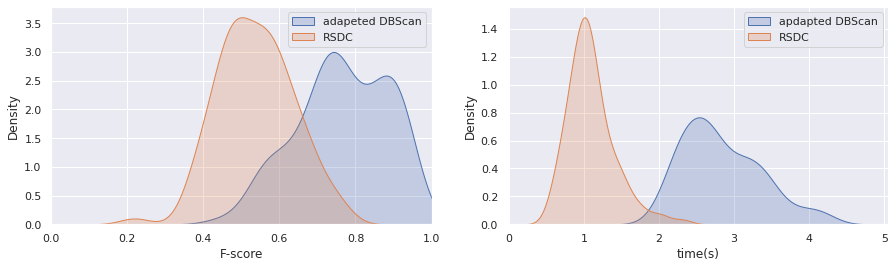

In [ ]:
from pandas import DataFrame
fig = plt.figure(figsize=(15,4))
ax = fig.add_subplot(1,2,1)
# print('the first 20 item in list:',fscore_dbscan[:20])
sns.kdeplot(fscore_dbscan[:,0],shade=True, label='adapeted DBScan')
sns.kdeplot(fscore_sampling[:,0],shade=True, label='RSB')
ax.legend()
# plt.figure(figsize=(10,5))
ax.set_xlabel('F-score')
ax.set_ylabel('Density')
ax = fig.add_subplot(1,2,2)
sns.kdeplot(time_dbscan,shade=True, label='adapted DBScan')
sns.kdeplot(time_sampling,shade=True, label='RSB')
ax.legend()
ax.set_xlabel('time(s)')
ax.set_ylabel('Density')
plt.show()

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    label = np.array([p.cluster_label for p in points])
    # print('labels:', np.unique(label))
    # print('length of centroids:', len(centroids))
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        # print('label of p', p.cluster_label, 'length of centroids:', len(centroids))
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(taxis, n, a, rctgs_extra, datetime, interval, local_search_=False):
# def compare_time(input, noise, n_samples, n_components, avg_factor, disjoint_bound):
    '''
        input: list - the name of the datasets
        noise: list - float, the noise of the generated set
        n_samples: list - the number of the points generated
        n_components: int - the number of the clusters
        avg_factor: list of float - the factor for avg_Z
    '''

    #  plot Numerical Data
    row = 20  # number of rows
    columns = 5  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # c, k = 5*n_components, 2*n_components

    fig = plt.figure(figsize=(26, 180))
    # fig.suptitle('comparison of time cost of various points')
    
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

################### k means++ ###################
    # import time
    # start = time.time()
    # # centroids = cluster(points)
    # # centroids = clustering(input_obj, centroids, local_search_)
    # X = np.array([points[idx].coords for idx in range(len(points))])
    # centroids_np = np.array([np.array(centroids[idx].coords) for idx in range(len(centroids))])
    # label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # ax = fig.add_subplot(row, columns, order+cnt)
    # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    # for idx, col in enumerate(colors):
    #     cluster_data = label == idx
    #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                 c=col, marker='.', s=2)

    # # ax.scatter(centroids_np[:,0], centroids_np[:,1], c='b', s=50)
    # ax.axis('off')
    # ax.imshow(im, cmap='gray')
    # implot = plt.imshow(im)

    # n_extra = n_origin = 0
    # n_points = len(points)
    # for i,p in enumerate(points):
    #     if p.type_point=='extra':
    #         n_extra += 1
    #     elif p.type_point == 'Rect':
    #         n_origin += 1
    # precision = n_extra / n_points
    # recall = 1.0
    # fscore = 2* (precision*recall) / (precision+recall)
    # currentAxis = plt.gca()

    # for r in rctgs_extra:
    #     currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
    
    
    # end = time.time()
    # cost_time = end-start
    # str_dist = 'mean square distance: '+str(round(f_score(points,centroids)/len(points),3))+'\n'
    # str_fscore = 'f score: ' + str(fscore) + '\n'
    # str_precision = 'precision: ' + str(precision) + '\n'
    # str_recall = 'recall: ' + str(recall) + '\n'
    # str_duration = 'time taken:'+str(round(cost_time,3))
    # title = str_dist+str_fscore+str_precision+str_recall+str_duration
    # ax.set_xlabel("K-Means")
    # ax.set_title(title)
    # # ax.set_ylabel(ns)
    # ax.set_xticks([0,10])
    # ax.set_yticks([0,10])

    # cnt += 1



###################  plot dbscan boxgraph  ###################Z
    # fscore_dbscan = []
    # time_cost = []
    # for _ in range(100):
    #     import time
    #     start = time.time()
    #     epsilon, min_pts = 45, 590
    #     rect_list = rectangle_set_list(n, a, rctgs_extra, datetime, interval, type_point='extra')
    #     points = taxis + rect_list
    #     bg = BoxGraph(len(points), 2, epsilon, min_pts, points)
    #     find_core_points(bg)
    #     nr_clusters = compute_cluster_cores(bg)
    #     assign_border_points(bg)

    #     label = [bg.points[i].cluster_label for i in range(len(bg.points))]
    #     label = np.array(label)

    #     colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
        
    #     # print('labels:', np.unique(label))
    #     # print('the first 5 labels:', label[:5])
    #     X = [np.array(bg.points[i].coords) for i in range(len(bg.points))]
    #     X = np.array(X)
    #     # print('number of coords:', len(X))
    #     # print('the first 5 coords:', X[:5])

    #     ax = fig.add_subplot(row, columns, order+cnt)
    #     cnt += 1

    #     ax.axis('off')
    #     ax.imshow(im, cmap='gray')
    #     implot = plt.imshow(im)

    #     for idx, col in enumerate(colors):
    #         # print(idx, col)
    #         cluster_data = label == idx
    #         ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                     c=col, marker='.', s=2)
        
    #     currentAxis = plt.gca()
    #     # big_rect = rctgs[-1]
    #     cluster_rect = []
    #     unique_label = np.unique(label)
    #     # unique_label = unique_label[unique_label != -1]
    #     # for idx, lbl in enumerate(np.unique(label),1):
    #     for idx in range(1,len(unique_label)+1):
    #         cluster_data = label == idx
    #         if np.any(cluster_data):
    #             left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
    #             bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
    #             width, height = abs(right-left), abs(top-bottom)
    #             # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
    #             temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
    #             # print(left, right, top,bottom)
    #             # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
    #             cluster_rect.append(temp_rect)
        
    #     # print('number of clusters:', len(cluster_rect))
    #     if len(cluster_rect)>0:
    #         k_rects, k_density = dense_rectangle(bg.points, cluster_rect, k=3, min_area=10)
    #     else:
    #         k_rects, k_density = [],[]
    #     print('number of k:', len(k_rects))
    #     points_in_rects = np.array(points_in_rect(k_rects, bg.points))
    #     n_rect_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'taxi')
    #     n_extra_points = n_type_of_points_in_rectangle(k_rects, bg.points, 'extra')
    #     fscore, pcs, rcl = f_score_points_in_rect(rctgs_extra, k_rects, bg.points)
    #     fscore_dbscan.append(fscore)
    #     fsocre, pcs, rcl = round(fscore, 4), round(pcs, 4), round(rcl, 4)
    #     for r in k_rects:
    #         print('rect info:', r.x, r.y, r.width, r.height)
    #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    #     for r in rctgs_extra:
    #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))
        
    #     end = time.time()
    #     cost_time = end-start
    #     time_cost.append(cost_time)
    #     title_1 = 'epsilon:' + str(epsilon) + '. minPts:' + str(min_pts) + '\n'
    #     # ax.set_title(title)
    #     xlabel_1 = 'time taken: ' + str(round(cost_time, 4)) + ' seconds.'
    #     xlabel_2 = 'average density: ' + str(round(np.mean(k_density), 4))+'\n'
    #     xlabel_3 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    #     title_3 = 'f score: ' + str(fscore) + '\n'
    #     title_3_2 = 'precision: ' + str(pcs) + '\n'
    #     title_3_3 = 'recall: ' + str(rcl) + '\n'
    #     title_5 = 'taxi points: ' + str(n_rect_points) + '\n'
    #     title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
    #     title = title_1 + xlabel_2 + xlabel_3 + title_3 + title_3_2 + title_3_3 + title_5 + title_6 + xlabel_1
    #     ax.set_title(title)
    #     ax.set_xlabel('DBScan with box graphs')
    #     ax.set_xticks([0,10])
    #     ax.set_yticks([0,10])
    # fscore_dbscan = np.array(fscore_dbscan)
    # from pandas import DataFrame
    # fig = plt.figure(figsize=(15,4))
    # ax = fig.add_subplot(1,2,1)
    # # print('the first 20 item in list:',fscore_dbscan[:20])
    # sns.kdeplot(fscore_dbscan,shade=True)
    # # plt.figure(figsize=(10,5))
    # ax.set_xlim(0,1)
    # ax.set_xlabel('F-score')
    # ax.set_ylabel('Density')
    # ax = fig.add_subplot(1,2,2)
    # sns.kdeplot(time_cost,shade=True)
    # ax.set_xlabel('time(s)')
    # ax.set_ylabel('Density')
    

################### plot sample algorithm ###################
    fscore_sample = []
    time_sample = []
    for _ in range(100):
        import time
        start = time.time()
        rect_list = rectangle_set_list(n, a, rctgs_extra, datetime, interval, type_point='extra')
        points = taxis + rect_list
        df_not_prob = points
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)
        
        ax = fig.add_subplot(row, columns, order+cnt)
        cnt += 1

        # dots = ax.scatter(X[:, 0], X[:, 1],
        #                 marker='.', s=10)
        # ax.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

        k_rects, average_density = disjoint_dense_rectangle_pq(points, 30, 3, 0.5, min_area=1024)
        if len(k_rects)>0:
            points_in_rects = np.array(points_in_rect(k_rects, points))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
            fscore, precision, recall = f_score_points_in_rect_duplicate(rctgs_extra, k_rects, points)
            fscore_sample.append(fscore)
            fscore, precision, recall = round(fscore, 4), round(precision,4), round(recall,4)
        else:
            points_in_rects = []
            n_rect_points = 0
            n_extra_points = 0
            fscore = 0

        # ax.scatter(X[:,0], X[:,1], s=2, c='green')

        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs_extra:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if len(points_in_rects)>0:
            x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            ax.scatter(X[:,0], X[:,1], color='g', marker='.', s=2)
            ax.scatter(x, y, color='r', marker='.', s=2)
            # from pandas import DataFrame
            # pos = []
            # for i in range(len(x)):
            #     pos.append([x[i], y[i]])
            # df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            # contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap='Reds', fill=True)
            # contour.collections[0].set_alpha(0)

        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')
        
        end = time.time()
        cost_time = end-start
        time_sample.append(cost_time)
        title_1 = 'time taken: ' + str(cost_time)
        title_3 = 'f score: ' + str(fscore) + '\n'
        title_3_2 = 'precision: ' + str(precision) + '\n'
        title_3_3 = 'recall: ' + str(recall) + '\n'
        title_4 = 'number of clusters: '+str(len(k_rects)) + '\n'
        title_5 = 'extra data points: ' + str(n_extra_points) + '\n'
        title_6 = 'taxi data points: ' + str(n_rect_points) + '\n'
        title_str = title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6 + title_1
        ax.set_title(title_str)
        # ax.set_xticks([0,10])
        # ax.set_yticks([0,10])
        # update_start_time += dt.timedelta(minutes=interval)

    return fscore_sample, time_sample

def run_kmeans(list_a, datetime, interval, eps, list_n, data_oneday, rctgs_extra, n_components=3, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    

    # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
    taxis = generate_bg_list(data_oneday)

    # find the best centroids using k_means++ (w\ or w\o local search)
    # centroids = cluster(points, n_components)
    # centroids = clustering(input_obj, centroids, local_search_=local_search_)

    # simple check if the correct number of centroids has been given
    # assert len(centroids) == input_obj.k

    fscore_sample, time_sample = plot_clusters(taxis, list_n, list_a, rctgs_extra, datetime, interval, local_search_=local_search_)
       
    return fscore_sample, time_sample

    # print("Cluster counter:      ", input_obj.k, file=sys.stderr)
    # def avg_score(points, centroids):
    #     return f_score(points, centroids) / len(points)
    # average_score = avg_score(points, centroids)
    # print("Mean squared distance: {:.3f}".format(average_score), file=sys.stderr)  

if __name__ == '__main__':
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    a = [0.5, 0.5]

    n = 2000

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    interval = 1

    eps = 45
    fscore_sample, time_sample = run_kmeans(a, datetime, interval, eps, n, data_onehour, rctgs, 3, False)

    
    # fscore_sample = np.array(fscore_sample)
    from pandas import DataFrame
    fig = plt.figure(figsize=(15,4))
    ax = fig.add_subplot(1,2,1)
    # print('the first 20 item in list:',fscore_dbscan[:20])
    sns.kdeplot(fscore_sample,shade=True)
    # plt.figure(figsize=(10,5))
    ax.set_xlim(0,1)
    ax.set_xlabel('F-score')
    ax.set_ylabel('Density')
    ax = fig.add_subplot(1,2,2)
    sns.kdeplot(time_sample,shade=True)
    ax.set_xlabel('time(s)')
    ax.set_ylabel('Density')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

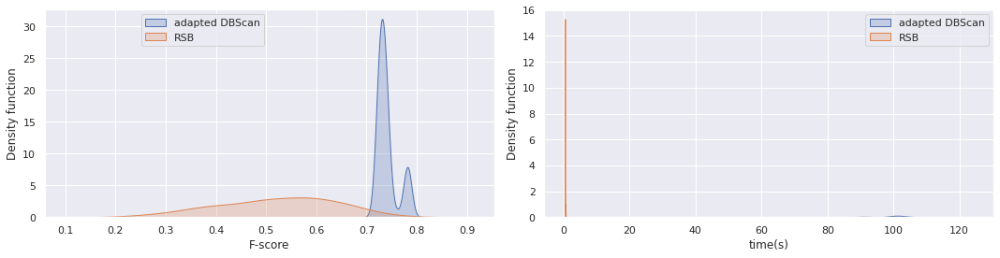

In [ ]:
from pandas import DataFrame
fig = plt.figure(figsize=(15,4))
ax = fig.add_subplot(1,2,1)
# print('the first 20 item in list:',fscore_dbscan[:20])
sns.kdeplot(fscore_dbscan,shade=True, label='adapted DBScan')
sns.kdeplot(fscore_sample,shade=True, label='RSB')
ax.legend(bbox_to_anchor=(0.5, 1))
# plt.figure(figsize=(10,5))
ax.set_xlabel('F-score')
ax.set_ylabel('Density function')
ax = fig.add_subplot(1,2,2)
sns.kdeplot(time_dbscan,shade=True, label='adapted DBScan')
sns.kdeplot(time_sample,shade=True, label='RSB')
ax.legend()
ax.set_xlabel('time(s)')
ax.set_ylabel('Density function')
plt.show()

# sliding window fscore


In [ ]:
from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 2**6)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(48):

            import time
            time_cost_start = time.time()

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
        
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="gist_rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_chr = dt.date(2015,12,25)
    time = dt.time(0,0,0)
    datetime_chr = dt.datetime.combine(date_chr,time)

    list_prob = [1/4]    
    fscore_list_chr, time_cost_list_chr = plot_sliding_window_taxi_and_rect_multi_prob(data_christmas, datetime_chr, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_chr_no = np.array(fscore_list_chr)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(0,24,0.5)
    # for i in range(len(list_prob)):
    # ax = fig.add_subplot(prob_row, prob_col, order+cnt)
    average_fscore_chr_no = np.mean(fscore_list_chr_no)
    title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'Average of F-score: ' + str(round(average_fscore_chr_no,4))
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_chr_no, (48,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.axhline(y=average_fscore_chr_no, color='r', ls='--')
    plt.xlim()
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

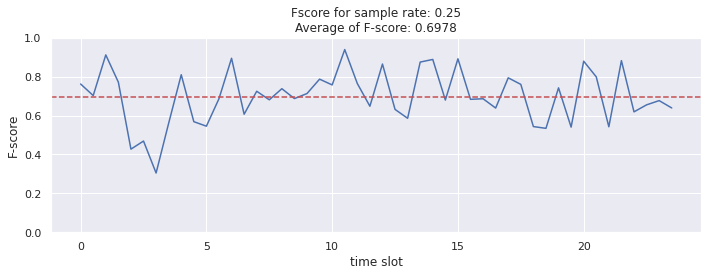

In [ ]:
fig = plt.figure(figsize=(10, 4))
list_time = np.arange(0,24,0.5)
# for i in range(len(list_prob)):
# ax = fig.add_subplot(prob_row, prob_col, order+cnt)
average_fscore_chr_no = np.mean(fscore_list_chr_no)
title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'Average of F-score: ' + str(round(average_fscore_chr_no,4))
plt.title(title)
plt.plot(list_time, np.reshape(fscore_list_chr_no, (48,)), 'b')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.axhline(y=average_fscore_chr_no, color='r', ls='--')
plt.xlim()
plt.ylim([0, 1])
plt.ylabel('F-score')
plt.xlabel('time slot')

plt.show()

In [ ]:
from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(48):

            import time
            time_cost_start = time.time()
            
            if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=21) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=18):
                epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
                eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
        
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="gist_rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect, 3, 2**6)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_chr = dt.date(2015,12,25)
    time = dt.time(0,0,0)
    datetime_chr = dt.datetime.combine(date_chr,time)

    list_prob = [1/4]    
    fscore_list_chr, time_cost_list_chr = plot_sliding_window_taxi_and_rect_multi_prob(data_christmas, datetime_chr, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_chr_yes = np.array(fscore_list_chr)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(0,24,0.5)
    average_fscore_chr_yes = np.mean(fscore_list_chr_yes)
    title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'with updates, average of F-score: ' + str(round(average_fscore_chr_yes,4))
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_chr_yes, (48,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.axvline(x=3, ls='--', color='grey')
    plt.axvline(x=12, ls='--', color='grey')
    plt.axvline(x=18, ls='--', color='grey')
    plt.axvline(x=21, ls='--', color='grey')
    plt.axhline(y=average_fscore_chr_yes, ls='--', color='r')
    plt.xlim()
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

No handles with labels found to put in legend.


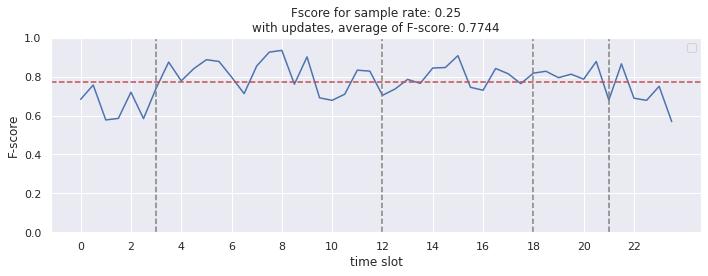

In [ ]:
fig = plt.figure(figsize=(10, 4))
list_time = np.arange(0,24,0.5)
average_fscore_chr_yes = np.mean(fscore_list_chr_yes)
title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'with updates, average of F-score: ' + str(round(average_fscore_chr_yes,4))
plt.title(title)
plt.plot(list_time, np.reshape(fscore_list_chr_yes, (48,)), 'b')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.axvline(x=3, ls='--', color='grey')
plt.axvline(x=12, ls='--', color='grey')
plt.axvline(x=18, ls='--', color='grey')
plt.axvline(x=21, ls='--', color='grey')
plt.axhline(y=average_fscore_chr_yes, ls='--', color='r')
plt.legend()
plt.xlim()
plt.ylim([0, 1])
plt.xticks(np.arange(0, 24, 2))
plt.ylabel('F-score')
plt.xlabel('time slot')

plt.show()

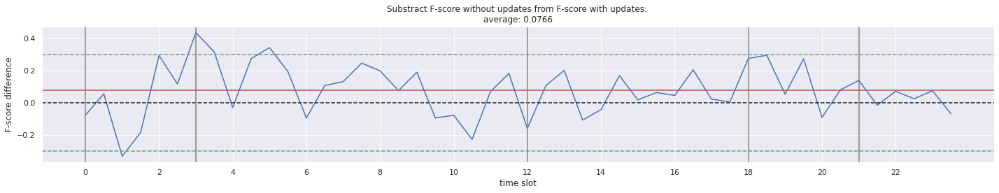

In [ ]:
# fscore_list_mon_adjust = np.reshape(fscore_list_mon_adjust,(34,))
# fscore_list_mon = np.reshape(fscore_list_mon,(34,))
fscore_list_chr_dif = np.subtract(fscore_list_chr_yes, fscore_list_chr_no)
fscore_list_chr_dif = np.reshape(fscore_list_chr_dif, (48,))
# print(fscore_list_mon)
# print(fscore_mon)

fig = plt.figure(figsize=(20, 4))
list_time = np.arange(0,24,0.5)
average_fscore_chr_dif = np.mean(fscore_list_chr_dif)
title = 'Substract F-score without updates from F-score with updates: ' + '\n' + 'average: ' + str(round(average_fscore_chr_dif,4))
plt.title(title)
plt.plot(list_time, fscore_list_chr_dif, 'b')
plt.axhline(y=0, color='k', ls='--')
plt.axhline(y=0.3, color='g', ls='--')
plt.axhline(y=-0.3, color='g', ls='--')
plt.axhline(y=average_fscore_chr_dif, color='r')
plt.axvline(x=0, color='grey')
plt.axvline(x=3, color='grey')
plt.axvline(x=18, color='grey')
plt.axvline(x=21, color='grey')
plt.axvline(x=12, color='grey')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.xlim()
plt.xticks(np.arange(0,24,2))
# plt.ylim([0, 1])
plt.ylabel('F-score difference')
plt.xlabel('time slot')
plt.show()

In [ ]:
from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(48):

            import time
            time_cost_start = time.time()
            
            eps, mpt = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
        
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="gist_rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect, 3, 2**6)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_chr = dt.date(2015,12,25)
    time = dt.time(0,0,0)
    datetime_chr = dt.datetime.combine(date_chr,time)

    list_prob = [1/4]    
    fscore_list_chr, time_cost_list_chr = plot_sliding_window_taxi_and_rect_multi_prob(data_christmas, datetime_chr, 30, 60, 'tpep_pickup_datetime', list_prob)
    fscore_list_chr_every = np.array(fscore_list_chr)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(0,24,0.5)
    average_fscore_chr_yes = np.mean(fscore_list_chr_every)
    title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'with updates every point, average of F-score: ' + str(round(average_fscore_chr_yes,4))
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_chr_every, (48,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.axhline(y=average_fscore_chr_yes, ls='--', color='r')
    plt.xlim()
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 2**6)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(48):

            import time
            time_cost_start = time.time()

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
        
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_ny = dt.date(2015,1,1)
    time = dt.time(0,0,0)
    datetime_ny = dt.datetime.combine(date_ny,time)

    list_prob = [1/4]    
    fscore_list_ny, time_cost_list_ny = plot_sliding_window_taxi_and_rect_multi_prob(data_newyear, datetime_ny, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_ny_no = np.array(fscore_list_ny)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(0,24,0.5)
    # for i in range(len(list_prob)):
    # ax = fig.add_subplot(prob_row, prob_col, order+cnt)
    average_fscore_list_ny_no = np.mean(fscore_list_ny_no)
    title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'Average F-score: ' + str(average_fscore_list_ny_no)
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_ny_no, (48,)), 'b')
    plt.axhline(x=average_fscore_list_ny_no, ls='--')
    plt.xlim()
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

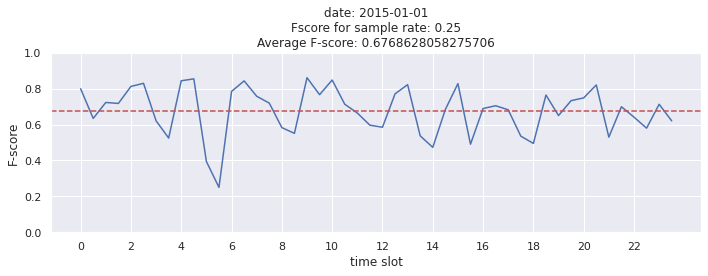

In [ ]:
fig = plt.figure(figsize=(10, 4))
list_time = np.arange(0,24,0.5)
# for i in range(len(list_prob)):
# ax = fig.add_subplot(prob_row, prob_col, order+cnt)
average_fscore_list_ny_no = np.mean(fscore_list_ny_no)
title = 'date: ' + str(date_ny) + '\n' + 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'Average F-score: ' + str(average_fscore_list_ny_no)
plt.title(title)
plt.plot(list_time, np.reshape(fscore_list_ny_no, (48,)), 'b')
plt.axhline(y=average_fscore_list_ny_no, color='r', ls='--')
plt.xlim()
plt.ylim([0, 1])
plt.xticks(np.arange(0,24,2))
plt.ylabel('F-score')
plt.xlabel('time slot')
plt.show()

In [ ]:
from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(48):

            import time
            time_cost_start = time.time()
            
            if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=13) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=19) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=5.5):
                eps, mpt = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
        
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect, 3, 2**6)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_ny = dt.date(2015,1,1)
    time = dt.time(0,0,0)
    datetime_ny = dt.datetime.combine(date_ny,time)

    list_prob = [1/4]    
    fscore_list_ny, time_cost_list_ny = plot_sliding_window_taxi_and_rect_multi_prob(data_newyear, datetime_ny, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_ny_yes = np.array(fscore_list_ny)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(0,24,0.5)
    average_fscore_chr_yes = np.mean(fscore_list_ny_yes)
    title = 'date: ' + str(date_ny) + '\n' + 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'with updates, average F-score: ' + str(round(average_fscore_chr_yes,4))
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_ny_yes, (48,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.axvline(x=1, ls='--', color='grey')
    plt.axvline(x=3, ls='--', color='grey')
    plt.axvline(x=13, ls='--', color='grey')
    plt.axvline(x=19, ls='--', color='grey')
    plt.axvline(x=0, ls='--', color='grey')
    plt.axvline(x=5.5, ls='--', color='grey')
    plt.axhline(y=average_fscore_chr_yes, ls='--', color='r')
    plt.xlim()
    plt.xticks(np.arange(0,24,2))
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

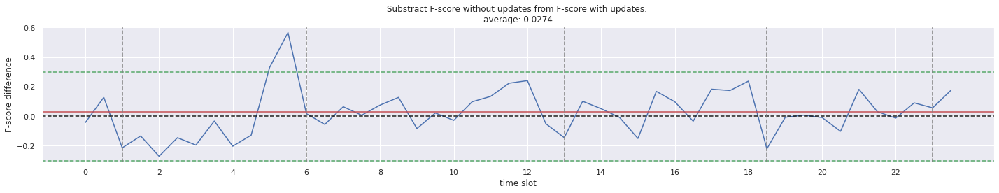

In [ ]:
# fscore_list_mon_adjust = np.reshape(fscore_list_mon_adjust,(34,))
# fscore_list_mon = np.reshape(fscore_list_mon,(34,))
# fscore_list_chr_yes_dynamic = fscore_list_chr_yes
fscore_list_ny_dif = np.subtract(fscore_list_ny_yes, fscore_list_ny_no)
fscore_list_ny_dif = np.reshape(fscore_list_ny_dif, (48,))
# print(fscore_list_mon)
# print(fscore_mon)

fig = plt.figure(figsize=(20, 4))
list_time = np.arange(0,24,0.5)
average_fscore_ny_dif = np.mean(fscore_list_ny_dif)
title = 'Substract F-score without updates from F-score with updates: ' + '\n' + 'average: ' + str(round(average_fscore_ny_dif,4))
plt.title(title)
plt.plot(list_time, fscore_list_ny_dif, 'b')
plt.axhline(y=0, color='k', ls='--')
plt.axhline(y=0.3, color='g', ls='--')
plt.axhline(y=-0.3, color='g', ls='--')
plt.axhline(y=average_fscore_ny_dif, color='r')
plt.axvline(1, color='grey', ls='--')
plt.axvline(13, color='grey', ls='--')
plt.axvline(18.5, color='grey', ls='--')
plt.axvline(6, color='grey', ls='--')
plt.axvline(23, color='grey', ls='--')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.xlim()
plt.xticks(np.arange(0,24,2))
# plt.ylim([0, 1])
plt.ylabel('F-score difference')
plt.xlabel('time slot')
plt.show()

In [ ]:
# ============================ christmas / change dataset / no update paramters ====================================

from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    rect_prob = []
    if prob < 1:
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return taxis, bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 2**6)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rect_3 = Rectangle(150, 755, 30, 30)
    rctgs = [rect_1, rect_2, rect_3]

    rect_set_list_3 = rectangle_set_list(4500, [1/3,1/3,1/3], rctgs, begin_date, interval)
    rect_set_list_2 = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    rect_set_list_1 = rectangle_set_list(1500, [1], rctgs, begin_date, interval)
    rect_set_list = rect_set_list_2
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for i in range(48):

            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
            templist= np.array([1,4,7,10])
        
            if i%4==0:
                if i//4 in templist:
                    rect_set_list = rect_set_list_1
                    for r in rctgs[:1]:
                        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))
                elif i//4 in templist+1:
                    rect_set_list = rect_set_list_2
                    for r in rctgs[:2]:
                        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))
                elif i//4 in templist+2:
                    rect_set_list = rect_set_list_3
                    for r in rctgs:
                        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            import time
            time_cost_start = time.time()

            # temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            # temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            temp_taxi_list, temp_bg = generate_data(latest_window, rect_set_list, eps, int(mpt*prob), prob)
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)
            print('f_score, precision, recall:', f_score, precision, recall)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_chr = dt.date(2015,12,25)
    time = dt.time(0,0,0)
    datetime_chr = dt.datetime.combine(date_chr,time)

    list_prob = [1/4]    
    fscore_list_chr, time_cost_list_chr = plot_sliding_window_taxi_and_rect_multi_prob(data_christmas, datetime_chr, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_chr_no_dynamic = np.array(fscore_list_chr)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(0,24,0.5)
    # for i in range(len(list_prob)):
    # ax = fig.add_subplot(prob_row, prob_col, order+cnt)
    title = 'Fscore for sample rate: ' + str(list_prob[0])
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_chr_no_dynamic, (48,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.xlim()
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

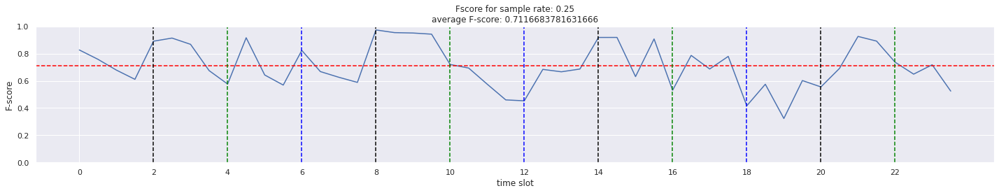

In [ ]:
fig = plt.figure(figsize=(20, 4))
list_time = np.arange(0,24,0.5)
# for i in range(len(list_prob)):
# ax = fig.add_subplot(prob_row, prob_col, order+cnt)
plt.plot(list_time, np.reshape(fscore_list_chr_no_dynamic, (48,)), 'b')
avg_fscore_list_chr_dynamic_no = np.mean(fscore_list_chr_no_dynamic)
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.xlim()
plt.ylim([0, 1])
title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'average F-score: ' + str(avg_fscore_list_chr_dynamic_no)
plt.title(title)
plt.axhline(avg_fscore_list_chr_dynamic_no, color='red', ls='--')
templist= np.array([1,4,7,10])
for i in templist*2:
    plt.axvline(i, color='black', ls='--')
for i in (templist+1)*2:
    plt.axvline(i, color='green', ls='--')
for i in ((templist+2)*2)[:-1]:
    plt.axvline(i, color='blue', ls='--')
plt.xticks(np.arange(0,24,2))
plt.ylabel('F-score')
plt.xlabel('time slot')

plt.show()

In [ ]:
# ============================ christmas / change dataset / with update paramters ====================================

from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    rect_prob = []
    if prob < 1:
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return taxis, bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            _, bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 2**6)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rect_3 = Rectangle(150, 755, 30, 30)
    rctgs = [rect_1, rect_2, rect_3]

    rect_set_list_3 = rectangle_set_list(4500, [1/3,1/3,1/3], rctgs, begin_date, interval)
    rect_set_list_2 = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    rect_set_list_1 = rectangle_set_list(1500, [1], rctgs, begin_date, interval)
    rect_set_list = rect_set_list_2
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for i in range(48):

            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
            templist= np.array([1,4,7,10])
        
            if i%4==0:
                if i//4 in templist:
                    rect_set_list = rect_set_list_1
                    for r in rctgs[:1]:
                        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))
                elif i//4 in templist+1:
                    rect_set_list = rect_set_list_2
                    for r in rctgs[:2]:
                        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))
                elif i//4 in templist+2:
                    rect_set_list = rect_set_list_3
                    for r in rctgs:
                        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            import time
            time_cost_start = time.time()

            if filtered_tw.start_time == begin_date+dt.timedelta(hours=1) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=13) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=18.5) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=6) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=23):
                epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
                eps, mpt = epsilon, minpts

            # temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            # temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            temp_taxi_list, temp_bg = generate_data(latest_window, rect_set_list, eps, int(mpt*prob), prob)
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)
            print('f_score, precision, recall:', f_score, precision, recall)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_chr = dt.date(2015,12,25)
    time = dt.time(0,0,0)
    datetime_chr = dt.datetime.combine(date_chr,time)

    list_prob = [1/4]    
    fscore_list_chr, time_cost_list_chr = plot_sliding_window_taxi_and_rect_multi_prob(data_christmas, datetime_chr, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_chr_yes_dynamic = np.array(fscore_list_chr)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(0,24,0.5)
    # for i in range(len(list_prob)):
    # ax = fig.add_subplot(prob_row, prob_col, order+cnt)
    avg_fscore_list_chr_yes_dynamic = np.mean(fscore_list_chr_yes_dynamic)
    title = 'Fscore for sample rate: ' + str(list_prob[0]) + 'with parameter updates, average F-score: ' + str(avg_fscore_list_chr_yes_dynamic)
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_chr_yes_dynamic, (48,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.xlim()
    plt.ylim([0, 1])
    plt.axvline(1, color='grey', ls='--')
    plt.axvline(13, color='grey', ls='--')
    plt.axvline(18.5, color='grey', ls='--')
    plt.axvline(6, color='grey', ls='--')
    plt.axvline(23, color='grey', ls='--')
    plt.axhline(avg_fscore_list_chr_yes_dynamic, color='red', ls='--')
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

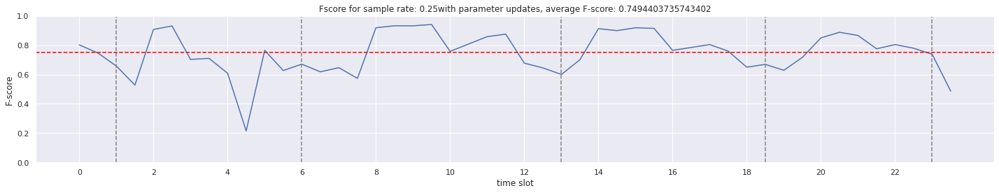

In [ ]:
fig = plt.figure(figsize=(20, 4))
list_time = np.arange(0,24,0.5)
# for i in range(len(list_prob)):
# ax = fig.add_subplot(prob_row, prob_col, order+cnt)
avg_fscore_list_chr_yes_dynamic = np.mean(fscore_list_chr_yes_dynamic)
title = 'Fscore for sample rate: ' + str(list_prob[0]) + 'with parameter updates, average F-score: ' + str(avg_fscore_list_chr_yes_dynamic)
plt.title(title)
plt.plot(list_time, np.reshape(fscore_list_chr_yes_dynamic, (48,)), 'b')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.xlim()
plt.ylim([0, 1])
plt.axvline(1, color='grey', ls='--')
plt.axvline(13, color='grey', ls='--')
plt.axvline(18.5, color='grey', ls='--')
plt.axvline(6, color='grey', ls='--')
plt.axvline(23, color='grey', ls='--')
plt.axhline(avg_fscore_list_chr_yes_dynamic, color='red', ls='--')
plt.xticks(np.arange(0,24,2))
plt.ylabel('F-score')
plt.xlabel('time slot')

plt.show()

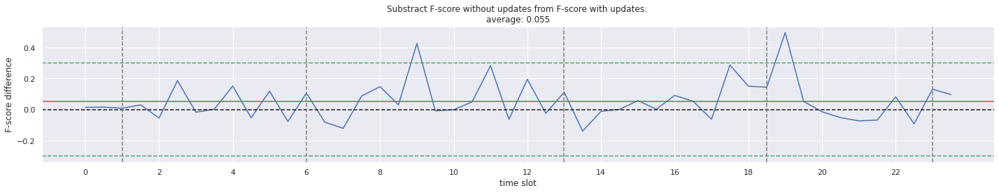

In [ ]:
# fscore_list_mon_adjust = np.reshape(fscore_list_mon_adjust,(34,))
# fscore_list_mon = np.reshape(fscore_list_mon,(34,))
# fscore_list_chr_yes_dynamic = fscore_list_chr_yes
fscore_list_chr_dynamic_dif = np.subtract(fscore_list_chr_yes_dynamic, fscore_list_chr_no_dynamic)
fscore_list_chr_dynamic_dif = np.reshape(fscore_list_chr_dynamic_dif, (48,))
# print(fscore_list_mon)
# print(fscore_mon)

fig = plt.figure(figsize=(20, 4))
list_time = np.arange(0,24,0.5)
average_fscore_chr_dynamic_dif = np.mean(fscore_list_chr_dynamic_dif)
title = 'Substract F-score without updates from F-score with updates: ' + '\n' + 'average: ' + str(round(average_fscore_chr_dynamic_dif,4))
plt.title(title)
plt.plot(list_time, fscore_list_chr_dynamic_dif, 'b')
plt.axhline(y=0, color='k', ls='--')
plt.axhline(y=0.3, color='g', ls='--')
plt.axhline(y=-0.3, color='g', ls='--')
plt.axhline(y=average_fscore_chr_dynamic_dif, color='r')
plt.axvline(1, color='grey', ls='--')
plt.axvline(13, color='grey', ls='--')
plt.axvline(18.5, color='grey', ls='--')
plt.axvline(6, color='grey', ls='--')
plt.axvline(23, color='grey', ls='--')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.xlim()
plt.xticks(np.arange(0,24,2))
# plt.ylim([0, 1])
plt.ylabel('F-score difference')
plt.xlabel('time slot')
plt.show()

In [ ]:
from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 2**6)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):
            
            import time
            time_cost_start = time.time()

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
        
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)

    list_prob = [1/4]    
    fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_sat_no = np.array(fscore_list_sat)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(7,24,0.5)
    # for i in range(len(list_prob)):
    # ax = fig.add_subplot(prob_row, prob_col, order+cnt)
    average_fscore_sat_no = np.mean(fscore_list_sat_no)
    title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'Average of F-score: ' + str(round(average_fscore_sat_no,4))
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_sat_no, (34,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.axhline(y=average_fscore_sat_no, color='r', ls='--')
    plt.xlim()
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from IPython.display import clear_output

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    # print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 2**6)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    tmp_cnt = 0

    fig = plt.figure(figsize=(30, 120))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.25)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True

    row, columns, order, cnt = 12, 4, 1, 0

    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):
            
            if filtered_tw.start_time == begin_date+dt.timedelta(hours=2) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=6) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=8) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=15):
                epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
                eps, mpt = epsilon, minpts

            import time
            time_cost_start = time.time()

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 1000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('time:', update_start_time)
            print('number of taxi points:', len(temp_taxi_list), '. number of rect points:', len(temp_bg.points))
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            ax = fig.add_subplot(row, columns, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')
        
            from pandas import DataFrame
            df_predicted = DataFrame(X,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', cmap="rainbow", fill=True, cbar=True)
            contour.collections[0].set_alpha(0)

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_score, precision, recall = round(f_score, 4), round(precision,4), round(recall, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'f_score: ' + str(f_score) + '\n'
            title_3_1 = 'precision: ' + str(precision) + '\n'
            title_3_2 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3_1 + title_3_2 + title_4 + title_5 + title_6
            plt.title(title_str)
            
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window
            update_start_time += dt.timedelta(minutes=interval)

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)

    list_prob = [1/4]    
    fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_sat_no = np.array(fscore_list_sat)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(10, 4))
    list_time = np.arange(7,24,0.5)
    # for i in range(len(list_prob)):
    # ax = fig.add_subplot(prob_row, prob_col, order+cnt)
    average_fscore_sat_no = np.mean(fscore_list_sat_no)
    title = 'Fscore for sample rate: ' + str(list_prob[0]) + '\n' + 'Average of F-score: ' + str(round(average_fscore_sat_no,4))
    plt.title(title)
    plt.plot(list_time, np.reshape(fscore_list_sat_no, (34,)), 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    plt.axhline(y=average_fscore_sat_no, color='r')
    plt.axvline(7, color='grey', ls='--')
    plt.axvline(9, color='grey', ls='--')
    plt.axvline(13, color='grey', ls='--')
    plt.axvline(22, color='grey', ls='--')
    plt.xlim()
    plt.ylim([0, 1])
    plt.ylabel('F-score')
    plt.xlabel('time slot')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.